In [3]:
import os, copy
import numpy as np
import jax
import jax.numpy as jnp
from jax import vmap
import matplotlib.pyplot as plt
import pandas as pd
import interpax
from scipy.interpolate import interp1d

from jax_cosmo import Cosmology
import jax_cosmo.background as bkgrd
from jax_cosmo.background import radial_comoving_distance

from godmax.get_Cls  import get_Cl
from godmax.get_covs import get_cov
from godmax.base_class import get_vmapped_func_warg
from godmax.base_class import base_class
from godmax.get_radial_profiles import Profiles
from godmax.get_Pkzs import get_Pkz

from tSZxEuclid.godmax.config.loader import merge_params
from tSZxEuclid.godmax.sampling.ell  import setup_ell_arrays

import diag_utils

In [5]:
from pathlib import Path

# ── Anchor: directory containing this notebook ───────────────────────────────
HERE = Path().resolve()          # GODMAX/notebooks/diagnostics
DEVELOP = HERE.parents[2]        # develop/

# ── Parameter files (diagnostics/params/) ────────────────────────────────────
PARAM_DIR = HERE / 'params'
sim_params_dict, halo_params_dict, analysis_dict, other_params_dict = merge_params(
    str(PARAM_DIR / 'params_default.yaml'),
    str(PARAM_DIR / 'params.yaml'),
)

# ── Cosmology (jax_cosmo) ────────────────────────────────────────────────────
cosmo_params = sim_params_dict['cosmo']
cosmo_jax = Cosmology(
    Omega_c  = cosmo_params['Om0'] - cosmo_params['Ob0'],
    Omega_b  = cosmo_params['Ob0'],
    h        = cosmo_params['H0'] / 100.,
    sigma8   = cosmo_params['sigma8'],
    n_s      = cosmo_params['ns'],
    Omega_k  = 0.,
    w0       = cosmo_params.get('w0', -1.0),
    wa       = 0.,
)

# ── ell array (mutates analysis_dict and halo_params_dict in place) ──────────
setup_ell_arrays(analysis_dict, halo_params_dict, lmin=80.0, lmax=3000.0)
print(f"nell = {len(analysis_dict['l_array_survey'])}, "
      f"ell range [{float(analysis_dict['l_array_survey'][0]):.1f}, "
      f"{float(analysis_dict['l_array_survey'][-1]):.1f}]")

# ── Galaxy n(z) paths ────────────────────────────────────────────────────────
DNDZ_DIR = DEVELOP / 'tSZxEuclid' / 'Data' / 'dndz'

def to_comoving_nz(z_array, nz_array, cosmo):
    """Convert non-normalised n(z) [#gal/z] to comoving n(z) [(Mpc/h)^-3]."""
    a = 1.0 / (1.0 + z_array)
    chi = radial_comoving_distance(cosmo, a)
    dchi_dz = (2.998e5) / bkgrd.H(cosmo, a)   # c [km/s] / H(a) [km/s/(Mpc/h)]
    dV_dzdOmega = chi**2 * dchi_dz
    return nz_array / dV_dzdOmega

dndz_gal = np.loadtxt(DNDZ_DIR / 'nz_euclid_forecast_bin-all.txt')
z_gal  = dndz_gal[:, 0]
nz_gal = dndz_gal[:, 1]
nz_gal_comoving = to_comoving_nz(z_gal, nz_gal, cosmo_jax)
analysis_dict['nbar_gal_comoving_zarray'] = z_gal
analysis_dict['nbar_gal_comoving_val']    = nz_gal_comoving

# ── Lens N(z) bins ───────────────────────────────────────────────────────────
nbins_lens   = 5
nz_lens      = {}
nz_info_dict = {'nbins_lens': nbins_lens}

for nbin in range(nbins_lens):
    d = np.loadtxt(DNDZ_DIR / f'nz_norm_euclid_forecast_bin-{nbin+1}.txt')
    nz_lens[nbin]              = d[:, 1]
    nz_info_dict[f'nz{nbin}'] = nz_lens[nbin]
z_lens = d[:, 0]
nz_info_dict['z_array_lens'] = z_lens
analysis_dict['nz_lens_info_dict'] = nz_info_dict

# ── Source N(z) bins (same as lens for mock) ─────────────────────────────────
nbins_source = 5
nz_source  = {}
nz_info_src = {'nbins': nbins_source}

for nbin in range(nbins_source):
    d = np.loadtxt(DNDZ_DIR / f'nz_norm_euclid_forecast_bin-{nbin+1}.txt')
    nz_source[nbin]             = d[:, 1]
    nz_info_src[f'nz{nbin}']  = nz_source[nbin]
z_source = d[:, 0]
nz_info_src['z_array_source'] = z_source
analysis_dict['nz_source_info_dict'] = nz_info_src

# ── Per-bin nbar [gal/arcmin²] ───────────────────────────────────────────────
deg2_to_arcmin2 = 3600.0
nz_gal_interp   = interp1d(z_gal, nz_gal, bounds_error=False, fill_value=0.0)
nz_gal_on_zlens = nz_gal_interp(z_lens)

pz_bins = np.vstack([nz_lens[jb] for jb in range(nbins_lens)])   # (nbins, Nz)
pz_sum  = np.sum(pz_bins, axis=0)
nbar_lens_bins = np.zeros(nbins_lens)
for jb in range(nbins_lens):
    frac_j = np.zeros_like(z_lens)
    valid  = pz_sum > 0
    frac_j[valid] = pz_bins[jb, valid] / pz_sum[valid]
    nbar_lens_bins[jb] = np.trapezoid(nz_gal_on_zlens * frac_j, z_lens) / deg2_to_arcmin2
analysis_dict['nbar_lens_bins'] = nbar_lens_bins

# ── SO LAT noise ─────────────────────────────────────────────────────────────
SO_NOISE = DEVELOP / 'tSZxEuclid' / 'Data' / 'SO_LAT_Nell_T_atmv1_baseline_fsky0p4_ILC_tSZ.txt'
analysis_dict['yy_noise_ell_fname'] = str(SO_NOISE)

# ── Output directory for figures ─────────────────────────────────────────────
FIGDIR = HERE / 'plots'
FIGDIR.mkdir(exist_ok=True)

print('nbar_lens_bins [gal/arcmin²]:', nbar_lens_bins)
print(f"Halo mass range: [{halo_params_dict['lg10_Mmin']}, {halo_params_dict['lg10_Mmax']}], nM={halo_params_dict['nM']}")
print(f"z grid: [{halo_params_dict['zmin']}, {halo_params_dict['zmax']}], nz={halo_params_dict['nz']}")
print(f"PARAM_DIR : {PARAM_DIR}")
print(f"DNDZ_DIR  : {DNDZ_DIR}")
print(f"FIGDIR    : {FIGDIR}")


nell = 15, ell range [90.4, 2269.7]
nbar_lens_bins [gal/arcmin²]: [0.91251697 0.8918078  0.8918939  0.93620033 1.58377251]
Halo mass range: [11.5, 15.5], nM=24
z grid: [0.01, 1.6], nz=22
PARAM_DIR : /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/params
DNDZ_DIR  : /home/vtinnane/Documents/Codes/develop/tSZxEuclid/Data/dndz
FIGDIR    : /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots


In [12]:
base_test = base_class(sim_params_dict, halo_params_dict, analysis_dict, other_params_dict)
profiles_test = Profiles(sim_params_dict, halo_params_dict, analysis_dict, other_params_dict, base_class_obj=base_test)
Pkz_test = get_Pkz(sim_params_dict, halo_params_dict, analysis_dict, other_params_dict, Profiles_obj=profiles_test)
Cls_test = get_Cl(sim_params_dict, halo_params_dict, analysis_dict, other_params_dict, Pkz_obj=Pkz_test)
cov_test = get_cov(sim_params_dict, halo_params_dict, analysis_dict, other_params_dict, Cls_test)

z_th = np.array(Cls_test.z_array)
nz = len(z_th)
z_sel = np.unique([0, nz//4, nz//2, 3*nz//4, nz-1])
ell_th = np.array(analysis_dict['l_array_survey'])

Loaded yy noise from file; Cl_y_y_tot_mat = theory + noise


## Here I will highlight the current issue we have with the covariance matrix. It is PSD for a single probe, but not for multi probe.

Data vector shape : (150,)   (10 bin-combos × 15 ell bins)
Entries:
  [ 0]  gy  bin_1_0
  [ 1]  gy  bin_2_0
  [ 2]  gy  bin_3_0
  [ 3]  gy  bin_4_0
  [ 4]  gy  bin_5_0
  [ 5]  gg  bin_1_1
  [ 6]  gg  bin_2_2
  [ 7]  gg  bin_3_3
  [ 8]  gg  bin_4_4
  [ 9]  gg  bin_5_5

Covariance matrix shape : (150, 150)
Count per probe         : {'gy': 5, 'gg': 5}
Min eigenvalue          : -6.813e-27
N negative eigenvalues  : 7


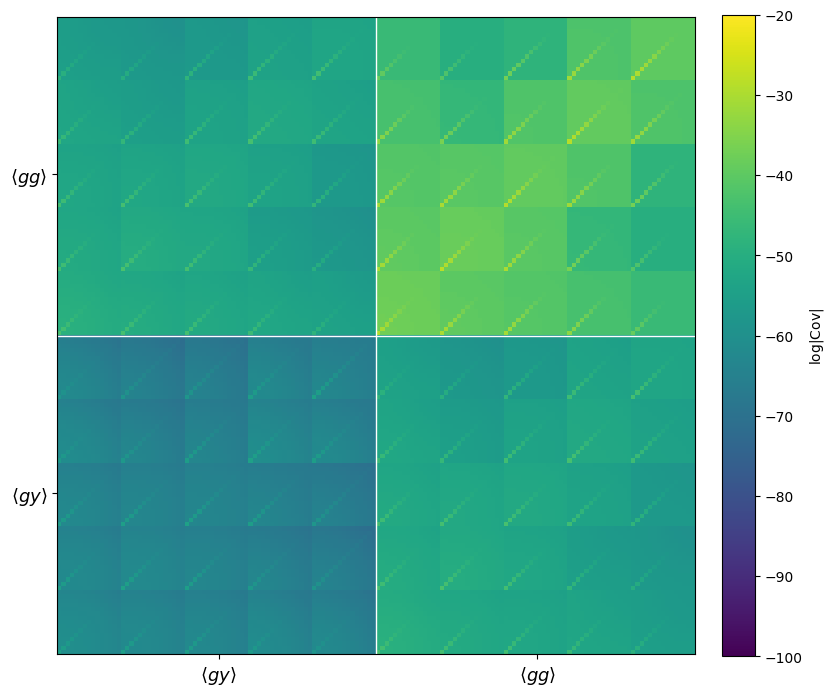

Data vector shape : (75,)   (5 bin-combos × 15 ell bins)
Entries:
  [ 0]  gg  bin_1_1
  [ 1]  gg  bin_2_2
  [ 2]  gg  bin_3_3
  [ 3]  gg  bin_4_4
  [ 4]  gg  bin_5_5

Covariance matrix shape : (75, 75)
Count per probe         : {'gg': 5}
Min eigenvalue          : 3.871e-20
N negative eigenvalues  : 0


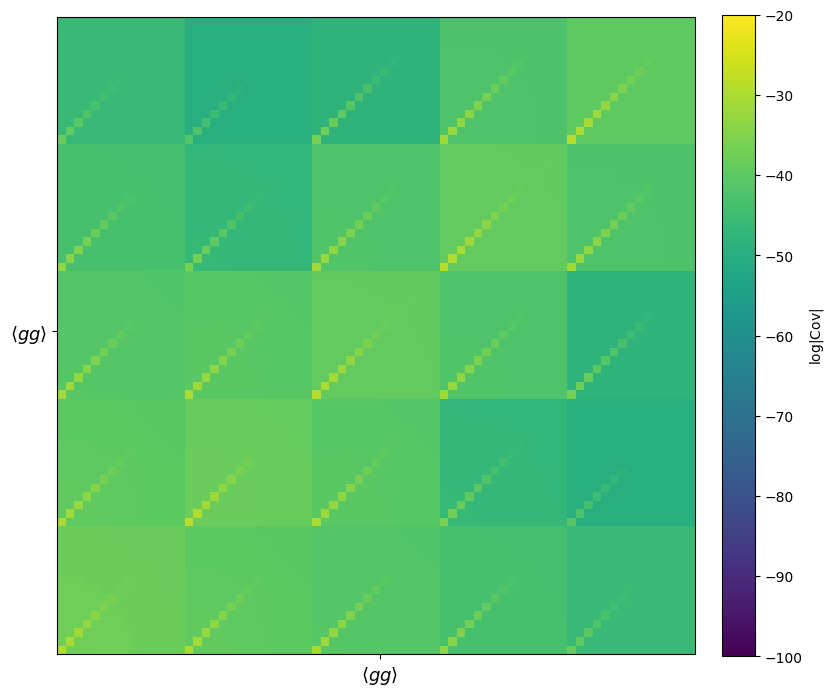

In [ ]:
# ── Define probes ─────────────────────────────────────────────────────────────
probes_arr = ['gy','gg']          
                                                                                                                                                            
# ── Data vector ───────────────────────────────────────────────────────────────                                                                            
dv, entries, nell = diag_utils.build_data_vector(                                                                                                           
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    key='tot_ellsurvey',       # 'tot_plus_noise_ellsurvey' for signal+noise                                                                                
)                                                                                                                                                           
                                                                                                                                                        
print(f"Data vector shape : {dv.shape}   ({len(entries)} bin-combos × {nell} ell bins)")                                                                    
print("Entries:")                                                                                                                                         
for i, (probe, (b1, b2)) in enumerate(entries):                                                                                                             
    print(f"  [{i:2d}]  {probe}  bin_{b1}_{b2}")                                                                                                            
                                                                                                                                                            
# ── Covariance matrix ─────────────────────────────────────────────────────────                                                                            
cov, entries, count_per_probe, nell = diag_utils.build_cov_matrix(                                                                                          
    cov_test.covtot_dict,                                                                                                                                   
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    warn_missing=True,                                                                                                                                      
)                                                                                                                                                         

print(f"\nCovariance matrix shape : {cov.shape}")                                                                                                           
print(f"Count per probe         : {dict(zip(probes_arr, count_per_probe))}")
                                                                                                                                                            
eigvals = np.linalg.eigvalsh(cov)                                                                                                                         
print(f"Min eigenvalue          : {eigvals.min():.3e}")                                                                                                     
print(f"N negative eigenvalues  : {(eigvals < 0).sum()}")                                                                                                   

# ── Plot ──────────────────────────────────────────────────────────────────────                                                                            
fig, ax = plt.subplots(figsize=(9, 9))                                                                                                                    
diag_utils.plot_cov_matrix(cov, count_per_probe, probes_arr, nell, ax=ax)                                                                                   
fig.savefig(FIGDIR / f"cov_{'_'.join(probes_arr)}.png", dpi=200, bbox_inches='tight')                                                                       
plt.show()  

# ── Define probes ─────────────────────────────────────────────────────────────
probes_arr = ['gg']          
                                                                                                                                                            
# ── Data vector ───────────────────────────────────────────────────────────────                                                                            
dv, entries, nell = diag_utils.build_data_vector(                                                                                                           
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    key='tot_ellsurvey',       # 'tot_plus_noise_ellsurvey' for signal+noise                                                                                
)                                                                                                                                                           
                                                                                                                                                        
print(f"Data vector shape : {dv.shape}   ({len(entries)} bin-combos × {nell} ell bins)")                                                                    
print("Entries:")                                                                                                                                         
for i, (probe, (b1, b2)) in enumerate(entries):                                                                                                             
    print(f"  [{i:2d}]  {probe}  bin_{b1}_{b2}")                                                                                                            
                                                                                                                                                            
# ── Covariance matrix ─────────────────────────────────────────────────────────                                                                            
cov, entries, count_per_probe, nell = diag_utils.build_cov_matrix(                                                                                          
    cov_test.covtot_dict,                                                                                                                                   
    cov_test.Cl_result_dict,                                                                                                                               
    probes_arr,                                                                                                                                             
    warn_missing=True,                                                                                                                                      
)                                                                                                                                                         

print(f"\nCovariance matrix shape : {cov.shape}")                                                                                                           
print(f"Count per probe         : {dict(zip(probes_arr, count_per_probe))}")
                                                                                                                                                            
eigvals = np.linalg.eigvalsh(cov)                                                                                                                         
print(f"Min eigenvalue          : {eigvals.min():.3e}")                                                                                                     
print(f"N negative eigenvalues  : {(eigvals < 0).sum()}")                                                                                                   

# ── Plot ──────────────────────────────────────────────────────────────────────                                                                            
fig, ax = plt.subplots(figsize=(9, 9))                                                                                                                    
diag_utils.plot_cov_matrix(cov, count_per_probe, probes_arr, nell, ax=ax)                                                                                   
fig.savefig(FIGDIR / f"cov_{'_'.join(probes_arr)}.png", dpi=200, bbox_inches='tight')                                                                       
plt.show()  

### The following cells has several tests that I did to check if there are inconsistencies anywhere.

## 3-D power spectra: shapes and C-S consistency

**Figure 1** — actual `Pk(k, z)` as stored in GODMAX for all six spectra,
at representative redshifts. The shaded band marks the Limber wavenumber
range $k_\ell = (\ell+0.5)/\chi$ for $\ell \in [100, 1200]$.

**Figure 2** — 3-D Cauchy-Schwarz consistency ratios:
$$r = \frac{P_{xy}^2}{P_{xx}\,P_{yy}} \leq 1 \quad \forall\, k,\,z$$
Values $> 1$ signal that the halo model violates C-S at that $(k, z)$,
which propagates directly into a non-PSD covariance matrix.
Three cross-pairs are checked: $(\kappa, y)$, $(g, y)$, $(g, \kappa)$.

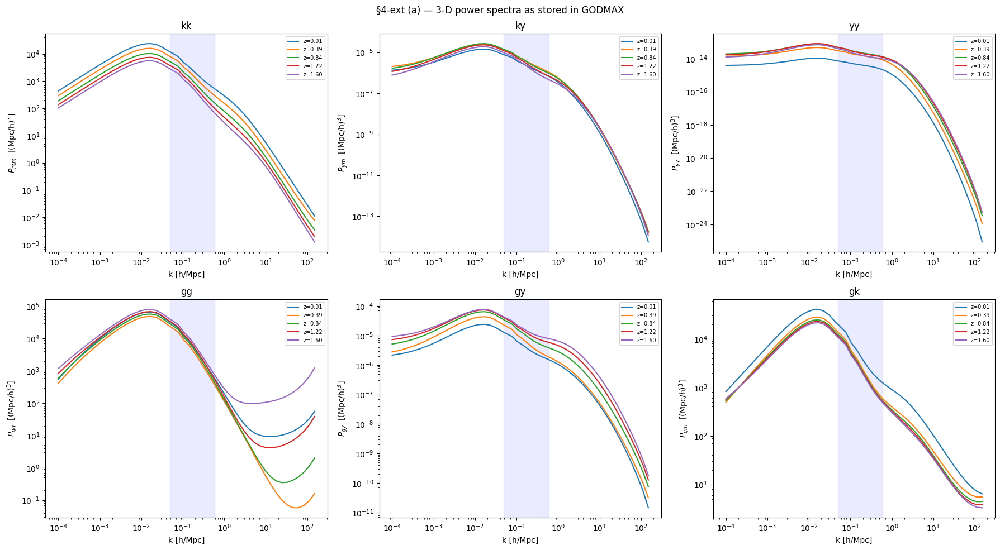

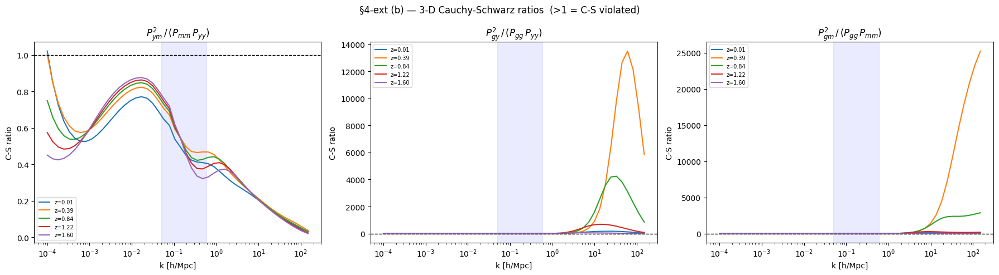

3-D C-S ratios in Limber band ell=[100,1200]:
pair    z       k_lo      k_hi      max ratio     flag
----------------------------------------------------------
ky-kkkk  0.01    3.3160    39.6100   0.2684        ok
ky-kkkk  0.39    0.0950    1.1343    0.5917        ok
ky-kkkk  0.84    0.0494    0.5906    0.7296        ok
ky-kkkk  1.22    0.0377    0.4501    0.7916        ok
ky-kkkk  1.60    0.0316    0.3774    0.8069        ok
gy-gggg  0.01    3.3160    39.6100   177.9792      VIOLATED
gy-gggg  0.39    0.0950    1.1343    2.4058        VIOLATED
gy-gggg  0.84    0.0494    0.5906    1.8106        VIOLATED
gy-gggg  1.22    0.0377    0.4501    2.1226        VIOLATED
gy-gggg  1.60    0.0316    0.3774    3.6139        VIOLATED
gk-gggg  0.01    3.3160    39.6100   209.8790      VIOLATED
gk-gggg  0.39    0.0950    1.1343    6.9297        VIOLATED
gk-gggg  0.84    0.0494    0.5906    3.1930        VIOLATED
gk-gggg  1.22    0.0377    0.4501    2.3603        VIOLATED
gk-gggg  1.60    0.0316    0.3

In [7]:
# ── Common grids ─────────────────────────────────────────────────────────────
kPk    = np.array(Cls_test.kPk_array)       # (nk,)
z_th   = np.array(Cls_test.z_array)          # (nz,)
nz_hm  = len(z_th)
z_sel  = np.unique([0, nz_hm//4, nz_hm//2, 3*nz_hm//4, nz_hm-1])
chi_arr = np.array(Cls_test.chi_array)       # (nz,)
jz_mid  = z_sel[len(z_sel)//2]

# ── Actual 3-D spectra as stored in GODMAX ───────────────────────────────────
Pk3d = {
    'kk': np.array(Cls_test.Pmm_tot_mat),      # (nk, nz)  P_mm used for C_kk
    'ky': np.array(Cls_test.Pym_tot_mat),      # (nk, nz)  P_ym used for C_ky
    'yy': np.array(Cls_test.Pyy_tot_kz_mat),  # (nk, nz)  P_yy used for C_yy
    'gg': np.array(Cls_test.Pgg_tot_mat),      # (nk, nz)  P_gg used for C_gg
    'gy': np.array(Cls_test.Pgy_tot_mat),      # (nk, nz)  P_gy used for C_gy
    'gk': np.array(Cls_test.Pgm_tot_mat),      # (nk, nz)  P_gm used for C_gk
}
ylabels = {
    'kk': r'$P_{mm}$  [(Mpc/h)$^3$]',
    'ky': r'$P_{ym}$  [(Mpc/h)$^3$]',
    'yy': r'$P_{yy}$  [(Mpc/h)$^3$]',
    'gg': r'$P_{gg}$  [(Mpc/h)$^3$]',
    'gy': r'$P_{gy}$  [(Mpc/h)$^3$]',
    'gk': r'$P_{gm}$  [(Mpc/h)$^3$]',
}

# ── Figure 1: actual Pk shapes ───────────────────────────────────────────────
fig1, axes1 = plt.subplots(2, 3, figsize=(18, 10))
fig1.suptitle('§4-ext (a) — 3-D power spectra as stored in GODMAX', fontsize=12)

for ax, probe in zip(axes1.ravel(), ['kk', 'ky', 'yy', 'gg', 'gy', 'gk']):
    for jz in z_sel:
        ax.loglog(kPk, np.clip(Pk3d[probe][:, jz], 1e-40, None),
                  label=f'z={z_th[jz]:.2f}')
    # Limber band for ell=[100,1200] at jz_mid
    chi_z = chi_arr[jz_mid]
    ax.axvspan(100.5/max(chi_z, 1.), 1200.5/max(chi_z, 1.), alpha=0.08, color='blue')
    ax.set(xlabel='k [h/Mpc]', ylabel=ylabels[probe], title=probe)
    ax.legend(fontsize=7)

plt.tight_layout()
fig1.savefig(os.path.join(FIGDIR, 'pk3d_allprobes_shapes.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── Figure 2: 3-D C-S ratios ─────────────────────────────────────────────────
# r_ym = P_ym^2 / (P_mm * P_yy)  — uses the SAME spectra that enter C_ky, C_kk, C_yy
# r_gy = P_gy^2 / (P_gg * P_yy)
# r_gm = P_gm^2 / (P_gg * P_mm)
cs_pairs = [
    ('ky', 'kk', 'yy', r'$P_{ym}^2\,/\,(P_{mm}\,P_{yy})$'),
    ('gy', 'gg', 'yy', r'$P_{gy}^2\,/\,(P_{gg}\,P_{yy})$'),
    ('gk', 'gg', 'kk', r'$P_{gm}^2\,/\,(P_{gg}\,P_{mm})$'),
]

fig2, axes2 = plt.subplots(1, 3, figsize=(18, 5))
fig2.suptitle('§4-ext (b) — 3-D Cauchy-Schwarz ratios  (>1 = C-S violated)', fontsize=12)

for ax, (pxy, pxx, pyy, title) in zip(axes2, cs_pairs):
    for jz in z_sel:
        denom = np.clip(Pk3d[pxx][:, jz] * Pk3d[pyy][:, jz], 1e-60, None)
        ratio = Pk3d[pxy][:, jz]**2 / denom
        ax.semilogx(kPk, ratio, label=f'z={z_th[jz]:.2f}')
    chi_z = chi_arr[jz_mid]
    ax.axvspan(100.5/max(chi_z, 1.), 1200.5/max(chi_z, 1.), alpha=0.08, color='blue')
    ax.axhline(1.0, color='k', ls='--', lw=1)
    ax.set(xscale='log', xlabel='k [h/Mpc]', ylabel='C-S ratio', title=title)
    ax.legend(fontsize=7)

plt.tight_layout()
fig2.savefig(os.path.join(FIGDIR, 'pk3d_cs_ratios.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── Console: max C-S ratio in the Limber band per probe pair ─────────────────
print('3-D C-S ratios in Limber band ell=[100,1200]:')
print(f'{"pair":<6}  {"z":<6}  {"k_lo":<8}  {"k_hi":<8}  {"max ratio":<12}  flag')
print('-' * 58)
for pxy, pxx, pyy, _ in cs_pairs:
    for jz in z_sel:
        k_lo = 100.5  / max(chi_arr[jz], 1.)
        k_hi = 1200.5 / max(chi_arr[jz], 1.)
        mask = (kPk >= k_lo) & (kPk <= k_hi)
        if not mask.any():
            continue
        denom = np.clip(Pk3d[pxx][mask, jz] * Pk3d[pyy][mask, jz], 1e-60, None)
        ratio = Pk3d[pxy][mask, jz]**2 / denom
        flag = 'VIOLATED' if ratio.max() > 1 else 'ok'
        print(f'{pxy+"-"+pxx+pxx:<6}  {z_th[jz]:<6.2f}  {k_lo:<8.4f}  {k_hi:<8.4f}  {ratio.max():<12.4f}  {flag}')


##  Limber integral validation: manual vs GODMAX `Cl_*_mat`

Replicate `get_Cl_tot` exactly in numpy using `cached_power_spectra` (shape `(nell, nz_for_Cls)`)
and compare against the stored GODMAX arrays for all six probes: **gg, kk, ky, gy, gk, yy**.

Window-function prefactors match `compute_prefac` in `get_Cl_tot` (get_Cls.py line 301):

| probe code | prefactor |
|---|---|
| 0 — κ | `(1+m_b) Wk[b] / χ²` |
| 2 — g | `Wg[b] / (dχ/dz · χ²)` |
| 3 — y | `Wy / χ²` |

Agreement should be at machine-precision level (relative error < 1e-5);
any larger discrepancy signals a mismatch between the cached Pk arrays
and the Cl output matrices.

Probe      max |rel err|    mean |rel err|  note
-----------------------------------------------------------------
kk             8.234e-16         1.810e-16  ok
ky             6.013e-16         1.983e-16  ok
yy             4.584e-16         1.605e-16  ok
gg             7.028e-16         1.493e-16  ok
gy             6.143e-16         1.476e-16  ok
gk             6.687e-16         1.515e-16  ok


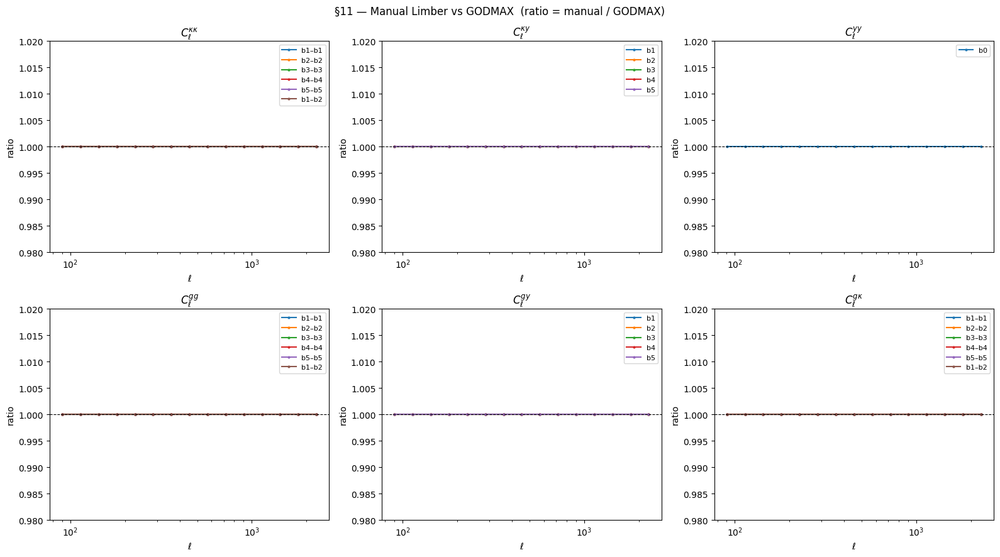

In [9]:
# ── Grid arrays on z_array_for_Cls ──────────────────────────────────────────
z_cls   = np.array(Cls_test.z_array_for_Cls)       # (nz_for_Cls,)
chi_cls = np.array(Cls_test.chi_array_for_Cls)      # (nz_for_Cls,)
dchi_dz = np.array(Cls_test.dchi_dz_array_for_Cls)  # (nz_for_Cls,)
ell_arr = np.array(Cls_test.ell_array)               # (nell,)

# ── Window functions (raw; prefactors applied below) ────────────────────────
Wk_all  = np.array(Cls_test.Wk_mat)                  # (nbins,     nz_for_Cls)
Wg_all  = np.array(Cls_test.Wg_mat)                  # (nbins_lens, nz_for_Cls)
Wy      = np.array(Cls_test.Wy_array)                 # (nz_for_Cls,)
mb      = np.array(Cls_test.mult_shear_bias_array)    # (nbins,) -- usually zeros

# ── Prefactors: compute_prefac in get_Cl_tot (get_Cls.py line 301) ──────────
def fk(jb): return (1.0 + mb[jb]) * Wk_all[jb] / chi_cls**2          # probe 0
def fg(jb): return Wg_all[jb] / (dchi_dz * chi_cls**2)                # probe 2
fy       = Wy / chi_cls**2                                             # probe 3

# ── Cached 3D power spectra on (nell, nz_for_Cls) ───────────────────────────
Pk = {
    'kk': np.array(Cls_test.cached_power_spectra[0, 0]),  # P_mm
    'ky': np.array(Cls_test.cached_power_spectra[0, 3]),  # P_ym
    'yy': np.array(Cls_test.cached_power_spectra[3, 3]),  # P_yy
    'gg': np.array(Cls_test.cached_power_spectra[2, 2]),  # P_gg
    'gy': np.array(Cls_test.cached_power_spectra[2, 3]),  # P_gy
    'gk': np.array(Cls_test.cached_power_spectra[2, 0]),  # P_gm
}

# ── Limber integrator: exact replica of get_Cl_tot's trapezoid ──────────────
def manual_cl(W1, W2, Pk_mat):
    """Cl[ell] = trapz( W1*W2*chi^2*dchi_dz*Pk, dz )  shape: (nell,)"""
    integrand = (W1 * W2 * chi_cls**2 * dchi_dz)[None, :] * Pk_mat  # (nell, nz)
    return np.trapezoid(integrand, z_cls, axis=1)

nbins      = Cls_test.nbins
nbins_lens = Cls_test.nbins_lens

# ── Compute manual Cls for every bin combo ───────────────────────────────────
man = {}
man['kk'] = np.array([[manual_cl(fk(b1), fk(b2), Pk['kk'])
                        for b2 in range(nbins)] for b1 in range(nbins)])          # (nb, nb, nell)
man['ky'] = np.array([manual_cl(fk(b), fy, Pk['ky']) for b in range(nbins)])      # (nb, nell)
man['yy'] = manual_cl(fy, fy, Pk['yy'])                                            # (nell,)
man['gg'] = np.array([[manual_cl(fg(b1), fg(b2), Pk['gg'])
                        for b2 in range(nbins_lens)] for b1 in range(nbins_lens)]) # (nb_l, nb_l, nell)
man['gy'] = np.array([manual_cl(fg(b), fy, Pk['gy']) for b in range(nbins_lens)]) # (nb_l, nell)
man['gk'] = np.array([[manual_cl(fg(b1), fk(b2), Pk['gk'])
                        for b2 in range(nbins)] for b1 in range(nbins_lens)])      # (nb_l, nb, nell)

# ── GODMAX reference arrays ──────────────────────────────────────────────────
# shapes: kk (nell,nb,nb), ky (nell,nb), yy (nell,)
#         gg (nell,nb_l,nb_l), gy (nell,nb_l), gk (nell,nb_l,nb)
ref = {
    'kk': np.array(Cls_test.Cl_kappa_kappa_tot_mat),  # (nell, nb, nb)
    'ky': np.array(Cls_test.Cl_kappa_y_tot_mat),       # (nell, nb)
    'yy': np.array(Cls_test.Cl_y_y_signal_mat),        # (nell,)
    'gg': np.array(Cls_test.Cl_gal_gal_tot_mat),       # (nell, nb_l, nb_l)
    'gy': np.array(Cls_test.Cl_gal_y_tot_mat),         # (nell, nb_l)
    'gk': np.array(Cls_test.Cl_gal_kappa_tot_mat),     # (nell, nb_l, nb)
}
# Transpose manual arrays to (nell, ...) for direct comparison
man_t = {
    'kk': man['kk'].transpose(2, 0, 1),   # (nell, nb, nb)
    'ky': man['ky'].T,                     # (nell, nb)
    'yy': man['yy'],                        # (nell,)
    'gg': man['gg'].transpose(2, 0, 1),    # (nell, nb_l, nb_l)
    'gy': man['gy'].T,                     # (nell, nb_l)
    'gk': man['gk'].transpose(2, 0, 1),   # (nell, nb_l, nb)
}

# ── Relative error diagnostic ────────────────────────────────────────────────
thresh = 1e-20   # ignore near-zero Cls
probe_labels = ['kk', 'ky', 'yy', 'gg', 'gy', 'gk']
probe_titles = {
    'kk': r'$C_\ell^{\kappa\kappa}$',
    'ky': r'$C_\ell^{\kappa y}$',
    'yy': r'$C_\ell^{yy}$',
    'gg': r'$C_\ell^{gg}$',
    'gy': r'$C_\ell^{gy}$',
    'gk': r'$C_\ell^{g\kappa}$',
}

print("{:<6}  {:>16}  {:>16}  {}".format("Probe", "max |rel err|", "mean |rel err|", "note"))
print('-' * 65)
for p in probe_labels:
    m, r = man_t[p].ravel(), ref[p].ravel()
    mask = np.abs(r) > thresh
    if mask.any():
        rel = np.abs(m[mask] - r[mask]) / np.abs(r[mask])
        note = 'WARN: >1e-4' if rel.max() > 1e-4 else 'ok'
        print(f'{p:<6}  {rel.max():>16.3e}  {rel.mean():>16.3e}  {note}')
    else:
        print(f"{p:<6}  N/A (all zero)")

# ── Comparison plots ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('§11 — Manual Limber vs GODMAX  (ratio = manual / GODMAX)', fontsize=12)

for ax, p in zip(axes.ravel(), probe_labels):
    m, r = man_t[p], ref[p]
    # Collapse bin axes: iterate over first extra dim if present
    if m.ndim == 1:
        combos = [(m, r, 'b0')]
    elif m.ndim == 2:
        combos = [(m[:, jb], r[:, jb], f'b{jb+1}') for jb in range(m.shape[1])]
    else:  # (nell, b1, b2) -- plot diagonal + (0,1) only
        combos = [(m[:, jb, jb], r[:, jb, jb], f'b{jb+1}–b{jb+1}')
                   for jb in range(m.shape[1])]
        if m.shape[1] > 1 and m.shape[2] > 0:
            combos.append((m[:, 0, 1], r[:, 0, 1], 'b1–b2'))

    for mc, rc, lbl in combos:
        mask = np.abs(rc) > thresh
        ratio = np.where(mask, mc / np.where(mask, rc, 1.0), np.nan)
        ax.plot(ell_arr, ratio, marker='.', ms=4, label=lbl)

    ax.axhline(1.0, ls='--', color='k', lw=0.8)
    ax.set_xscale('log')
    ax.set_xlabel(r'$\ell$')
    ax.set_ylabel('ratio')
    ax.set_title(probe_titles[p])
    ax.legend(fontsize=8)
    ax.set_ylim(0.98, 1.02)

plt.tight_layout()
plt.savefig(os.path.join(FIGDIR, 'limber_validation_allprobes.png'), dpi=150, bbox_inches='tight')
plt.show()


## Angular Cauchy-Schwarz consistency

For a Gaussian random field, the signal power spectra must satisfy
$$C_{xy}^2(\ell) \leq C_{xx}(\ell)\,C_{yy}(\ell) \quad \forall\,\ell$$
for every pair of fields $(x, y)$.  Violation means the angular power spectra
are internally inconsistent and the Gaussian covariance matrix will not be PSD.

Checked here for the three cross-pairs that involve the tSZ field and
galaxy–lensing cross: $(\kappa y)$, $(gy)$, $(g\kappa)$, per tomographic bin.
All quantities are taken directly from `Cl_result_dict` — no modification applied.

κy  C-S ratios:
  b1: max r=0.3547  at ell=143.2  [ok]
  b2: max r=0.3345  at ell=180.3  [ok]
  b3: max r=0.3591  at ell=227.0  [ok]
  b4: max r=0.3755  at ell=359.7  [ok]
  b5: max r=0.3901  at ell=452.9  [ok]
gy  C-S ratios:
  b1: max r=7.9764  at ell=2269.7  [VIOLATED]
  b2: max r=4.3438  at ell=2269.7  [VIOLATED]
  b3: max r=4.3840  at ell=2269.7  [VIOLATED]
  b4: max r=3.0057  at ell=2269.7  [VIOLATED]
  b5: max r=2.4794  at ell=2269.7  [VIOLATED]
gκ  C-S ratios:
  g1-k1: max r=38.4158  at ell=2269.7  [VIOLATED]
  g1-k2: max r=47.2919  at ell=2269.7  [VIOLATED]
  g1-k3: max r=57.2025  at ell=2269.7  [VIOLATED]
  g1-k4: max r=57.8239  at ell=2269.7  [VIOLATED]
  g1-k5: max r=52.4269  at ell=2269.7  [VIOLATED]
  g2-k1: max r=3.9672  at ell=2269.7  [VIOLATED]
  g2-k2: max r=3.7609  at ell=2269.7  [VIOLATED]
  g2-k3: max r=11.8981  at ell=2269.7  [VIOLATED]
  g2-k4: max r=19.5129  at ell=2269.7  [VIOLATED]
  g2-k5: max r=20.8359  at ell=2269.7  [VIOLATED]
  g3-k1: max r=0.8393  at ell

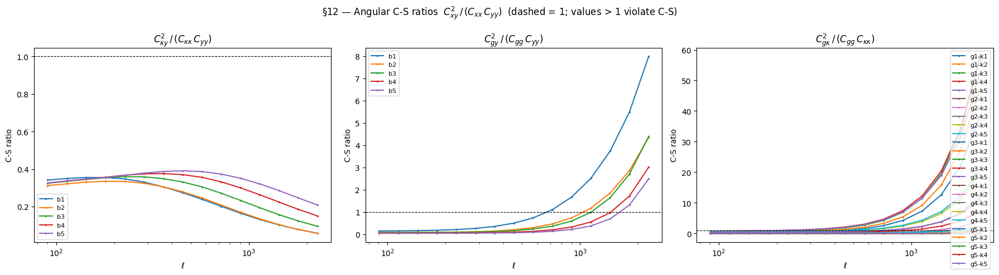

In [10]:
Cyy = ref['yy']          # (nell,)
nbins      = ref['kk'].shape[1]
nbins_lens = ref['gg'].shape[1]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle(
    r'§12 — Angular C-S ratios  $C_{xy}^2\,/\,(C_{xx}\,C_{yy})$'
    '  (dashed = 1; values > 1 violate C-S)',
    fontsize=12
)

# ── (a) κy : C_ky^2 / (C_kk * C_yy) ─────────────────────────────────────────
ax = axes[0]
print('κy  C-S ratios:')
for jb in range(nbins):
    Cky = ref['ky'][:, jb]                   # (nell,)
    Ckk = ref['kk'][:, jb, jb]               # auto-bin
    denom = np.clip(Ckk * Cyy, 1e-60, None)
    ratio = Cky**2 / denom
    ax.plot(ell_arr, ratio, marker='.', ms=3, label=f'b{jb+1}')
    imax = np.nanargmax(ratio)
    flag = 'VIOLATED' if ratio[imax] > 1 else 'ok'
    print(f'  b{jb+1}: max r={ratio[imax]:.4f}  at ell={ell_arr[imax]:.1f}  [{flag}]')
ax.axhline(1.0, ls='--', color='k', lw=0.8)
ax.set(xscale='log', xlabel=r'$\ell$', ylabel='C-S ratio',
       title=r'$C_{\kappa y}^2\,/\,(C_{\kappa\kappa}\,C_{yy})$')
ax.legend(fontsize=8)

# ── (b) gy : C_gy^2 / (C_gg * C_yy) ─────────────────────────────────────────
ax = axes[1]
print('gy  C-S ratios:')
for jb in range(nbins_lens):
    Cgy = ref['gy'][:, jb]
    Cgg = ref['gg'][:, jb, jb]
    denom = np.clip(Cgg * Cyy, 1e-60, None)
    ratio = Cgy**2 / denom
    ax.plot(ell_arr, ratio, marker='.', ms=3, label=f'b{jb+1}')
    imax = np.nanargmax(ratio)
    flag = 'VIOLATED' if ratio[imax] > 1 else 'ok'
    print(f'  b{jb+1}: max r={ratio[imax]:.4f}  at ell={ell_arr[imax]:.1f}  [{flag}]')
ax.axhline(1.0, ls='--', color='k', lw=0.8)
ax.set(xscale='log', xlabel=r'$\ell$', ylabel='C-S ratio',
       title=r'$C_{gy}^2\,/\,(C_{gg}\,C_{yy})$')
ax.legend(fontsize=8)

# ── (c) gκ : C_gk^2 / (C_gg * C_kk) ─────────────────────────────────────────
ax = axes[2]
print('gκ  C-S ratios:')
for jbl in range(nbins_lens):
    for jbs in range(nbins):
        Cgk = ref['gk'][:, jbl, jbs]
        Cgg = ref['gg'][:, jbl, jbl]
        Ckk = ref['kk'][:, jbs, jbs]
        denom = np.clip(Cgg * Ckk, 1e-60, None)
        ratio = Cgk**2 / denom
        ax.plot(ell_arr, ratio, marker='.', ms=3, label=f'g{jbl+1}-k{jbs+1}')
        imax = np.nanargmax(ratio)
        flag = 'VIOLATED' if ratio[imax] > 1 else 'ok'
        print(f'  g{jbl+1}-k{jbs+1}: max r={ratio[imax]:.4f}  at ell={ell_arr[imax]:.1f}  [{flag}]')
ax.axhline(1.0, ls='--', color='k', lw=0.8)
ax.set(xscale='log', xlabel=r'$\ell$', ylabel='C-S ratio',
       title=r'$C_{g\kappa}^2\,/\,(C_{gg}\,C_{\kappa\kappa})$')
ax.legend(fontsize=8)

plt.tight_layout()
fig.savefig(os.path.join(FIGDIR, 'angular_cs_ratios.png'), dpi=150, bbox_inches='tight')
plt.show()


## Baryonic Suppression: Where It Is and Is Not Applied
                                                                                                                                       
  The suppression factor is defined as:
                                                                                                                                                            
  $S(k,z) = \frac{P_{\rm halofit}(k,z)}{P_{\rm NFW,tot}(k,z)} = \frac{P_{\rm halofit}}{P_{\rm 1H,NFW} + P_{\rm 2H,NFW}}$                                    
                                                                                                                                                              
  | Spectrum | Suppression applied? | Rationale / Note |                                                                                                      
  |---|---|---|                                                                                                                                             
  | $P_{mm}$ (matter auto) | **Yes** | $P_{\rm dmb} \times S(k,z)$. If `model_matter='halofit'`, $S\equiv 1$ |
  | $P_{gg}$ (galaxy auto) | **Yes** | $(P_{\rm 1H}+P_{\rm 2H})\times S$ |                                                                                    
  | $P_{gm}$ (galaxy $\times$ matter) | **Yes** | $(P_{\rm 1H}+P_{\rm 2H})\times S$ |                                                                         
  | $P_{ge}$ (galaxy $\times$ electrons) | **Yes** | $(P_{\rm 1H}+P_{\rm 2H})\times S$ |                                                                      
  | $P_{ym}$ (tSZ $\times$ matter) | **No** (default) | Only applied if `tSZ_transition_model='response'`; otherwise `poweradd` |                             
  | $P_{yy}$ (tSZ auto) | **No** | Pure $P_{\rm 1H}+P_{\rm 2H}$; suppression never applied |                                                                  
  | $P_{gy}$ (galaxy $\times$ tSZ) | **No** (default) | Same as $P_{ym}$ — `poweradd` only; `response` model applies $S$ |                                    

----------------------------------------------------------------------------------
  > **Design decision tSZ spectra and suppression.**                                                                                                        
  > The `poweradd` model (default) combines 1H and 2H terms as                                                                                                
  > $P = \left(P_{\rm 1H}^\alpha + P_{\rm 2H}^\alpha\right)^{1/\alpha}$                                                                                    
  > and applies **no** suppression factor $S(k,z)$ to tSZ-containing spectra.                                                                                 
  > The `response` model additionally multiplies by $S(k,z)$.                                                                                                 
  > The physical motivation is that the tSZ signal is already sensitive to baryon                                                                             
  > redistribution through the pressure profile directly; $S(k,z)$ was calibrated                                                                             
  > for the matter field, not for $y$. Applying it on top of the baryonified                                                                                
  > pressure profile would double-count baryonic effects.   

## Is the Pressure Profile Baryonified? And Is $P_\mathrm{sup}$ on $P_{gg}$ Physically Correct?
                                                                                      
  ### The pressure profile derivation chain                                                                                                                   
                                                                                                                                                              
  The tSZ signal is built entirely from the BCMP gas model - there is no NFW component anywhere in the $y$ pipeline:                                          
                                                                                                                                                              
  $$                                                                                                                                                          
  \underbrace{(\theta_\mathrm{ej},\,\theta_\mathrm{co},\,\beta)}_{\text{BCMP gas params}}
  \;\longrightarrow\;                                                                                                                                         
  \rho_\mathrm{gas}(r|M,z)                                                                                                                                    
  \;\longrightarrow\;                                                                                                                                         
  T_\mathrm{gas}(r|M,z) \;\text{[HSE + } f_\mathrm{nt}\text{]}                                                                                                
  \;\longrightarrow\;                                                                                                                                         
  P_e(r|M,z)      
  \;\longrightarrow\;                                                                                                                                         
  y_\mathrm{3D}(r|M,z)
  $$                                                                                                                                                          
                  
  The pressure profile is therefore **fully baryonified by construction**. The gas is redistributed by `theta_ej` and `theta_co`, and the resulting electron  
  pressure is what enters the tSZ kernel. NFW plays no role in the $y$ or $\kappa y$ spectra.
                                                                                                                                                              
  ---             

  ### What $P_\mathrm{sup}$ actually is                                                                                                                       
  
  The suppression factor is defined as                                                                                                                        
                  
  $$
  S(k,z) \;\equiv\; \frac{P_\mathrm{halofit}^\mathrm{DM}(k,z)}{P_\mathrm{NFW,\,tot}(k,z)}
  $$                                                                                                                                                          
  
  where the numerator is the **dark-matter-only** nonlinear power spectrum (Takahashi halofit) and the denominator is the **NFW-only halo model** (1h + 2h, no
   gas).          
                                                                                                                                                              
  This is a **halo model accuracy correction** — it absorbs the well-known $\sim$10–20% inaccuracy of the NFW halo model relative to $N$-body results (missing
   substructure, halo exclusion, pseudo-1h terms, etc.).
                                                                                                                                                              
  > **$P_\mathrm{sup}$ is not a baryonic correction.** It does not encode any physics of gas expulsion, AGN feedback, or adiabatic contraction. Those effects 
  are already in the BCMP profiles.
                                                                                                                                                              
  ---             

  ### Is applying $P_\mathrm{sup}$ to $P_{gg}$ physically correct?                                                                                            
  
  **Arguably no**, for two reasons.                                                                                                                           
                  
  #### 1. Calibration mismatch                                                                                                                                
  
  $S(k,z)$ is calibrated against the **matter** power spectrum. Galaxy clustering traces a biased, HOD-selected population:                                   
                  
  $$                                                                                                                                                          
  P_{gg}(k,z) = b_g^2 \, P_{mm}(k,z) + \frac{1}{\bar{n}_g} \quad \text{(schematically)}
  $$                                                                                                                                                          
  
  The halo model inaccuracies absorbed by $S$ (halo exclusion, pseudo-1h, etc.) enter $P_{mm}$ and $P_{gg}$ differently. Applying the same $S$ to both is an  
  approximation without direct $N$-body justification for biased tracers.
                                                                                                                                                              
  #### 2. The 3D Cauchy–Schwarz violation                                                                                                                     
  
  At 3D level, a valid power spectrum matrix requires                                                                                                         
                  
  $$                                                                                                                                                          
  P_{gy}^2(k,z) \;\leq\; P_{gg}(k,z)\cdot P_{yy}(k,z)
  $$                                                                                                                                                          
  
  In GODMAX the spectra are computed as:                                                                                                                      
                  
  | Spectrum | Suppression applied? |                                                                                                                         
  |----------|----------------------|
  | $P_{mm}$ | $\times\, S(k,z)$ |
  | $P_{gm}$ | $\times\, S(k,z)$ |                                                                                                                            
  | $P_{gg}$ | $\times\, S(k,z)$ |
  | $P_{ym}$ | $\times\, 1$ (none) |                                                                                                                          
  | $P_{gy}$ | $\times\, 1$ (none) |                                                                                                                          
  | $P_{yy}$ | $\times\, 1$ (none) |                                                                                                                          
                                                                                                                                                              
  The cross-spectrum $P_{gy}$ receives no suppression because the pressure kernel is fully baryonified. But $P_{gg}$ does. When $S < 1$ (which is the typical 
  case on small scales), the Cauchy–Schwarz ratio becomes
                                                                                                                                                              
  $$              
  \frac{P_{gy}^2}{P_{gg} \cdot P_{yy}} = \frac{P_{gy}^2}{S \cdot P_{gg}^\mathrm{unsup} \cdot P_{yy}} > 1
  $$                                                                                                                                                          
  
  This might violate the positive-semidefiniteness of the $3\times 3$ cross-spectrum matrix and propagates directly into the Gaussian covariance:                  
                  
  $$                                                                                                                                                          
  \mathrm{Cov}(C_\ell^{gy}, C_\ell^{gy}) \;\propto\; C_\ell^{gg} \cdot C_\ell^{yy} + \left(C_\ell^{gy}\right)^2
  $$                                                                                                                                                          
  
  A Limber-projected violation at the 3D level can produce negative eigenvalues in the angular covariance matrix.                                             
                  
  ---                                                                                                                                                         
                  
  ### Summary

  | Spectrum | $P_\mathrm{sup}$ status | Physical justification |                                                                                             
  |----------|--------------------------|------------------------|
  | $P_{mm}$ | Applied | DM halo model correction — exact calibration target |                                                                                
  | $P_{gm}$, $P_{gg}$ | Applied | Approximate — $S$ not calibrated for biased tracers |                                                                      
  | $P_{ym}$, $P_{gy}$, $P_{yy}$ | Not applied | Pressure is fully baryonified; no NFW → no correction needed |                                               

----------------------------------------------------------------------------------                                                             
  > **Consequence**: applying $S$ to $P_{gg}$ but not to $P_{gy}$ or $P_{yy}$ creates an **asymmetric suppression** that breaks the 3D Cauchy–Schwarz inequality on scales where $S(k,z) < 1$, potentially causing non-positive-semidefinite covariance matrices.                                                 
                                                                                                                                                              
  **Proposed fix options:**
  - **Try A** — Do not apply $P_\mathrm{sup}$ to $P_{gg}$ (treat the galaxy bias as absorbing the halo model inaccuracy).
  - **Try B** — Also apply $S$ to $P_{gy}$ and $P_{gy}$ cross-terms (requires a justification for why the matter-field correction applies to galaxy–$y$       
  correlations).                                                                                      

z=0.01: Pmm_sup in ell=[100,1200] → k=[3.316,39.610]: min=1.068, max=1.399, median=1.099
z=0.39: Pmm_sup in ell=[100,1200] → k=[0.095,1.134]: min=0.883, max=0.914, median=0.889
z=0.84: Pmm_sup in ell=[100,1200] → k=[0.049,0.591]: min=0.899, max=0.968, median=0.934
z=1.22: Pmm_sup in ell=[100,1200] → k=[0.038,0.450]: min=0.951, max=0.980, median=0.963
z=1.60: Pmm_sup in ell=[100,1200] → k=[0.032,0.377]: min=0.980, max=0.991, median=0.985


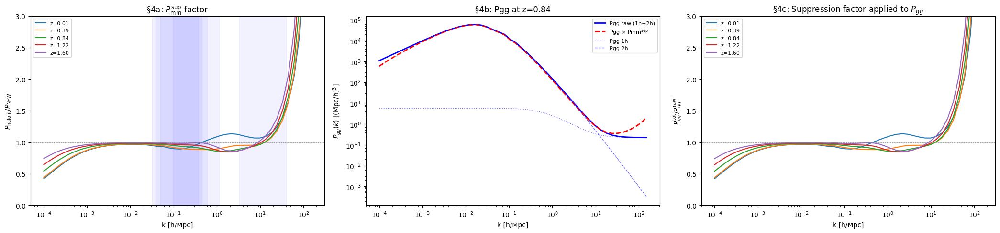

In [17]:
Pmm_sup = np.array(Cls_test.Pmm_sup_tot_mat)  # (nk, nz)
kPk = np.array(Cls_test.kPk_array)

Pgg_1h = np.array(Cls_test.Pgg_1h_kz_mat)   # (nk, nz)
Pgg_2h = np.array(Cls_test.Pgg_2h_kz_mat)   # (nk, nz)
Pgg_raw = Pgg_1h + Pgg_2h                     # before suppression
Pgg_tot = np.array(Cls_test.Pgg_tot_mat)      # after suppression = Pgg_raw * Pmm_sup

fig, axes = plt.subplots(1, 3, figsize=(21, 5))

# Panel 1: Pmm_sup at several z
for jz in z_sel:
    axes[0].plot(kPk, Pmm_sup[:, jz], label=f'z={z_th[jz]:.2f}')
axes[0].axhline(1.0, color='gray', ls='--', lw=0.5)
axes[0].set(xscale='log', xlabel='k [h/Mpc]', ylabel=r'$P_{\rm halofit}/P_{\rm NFW}$',
            title=r'§4a: $P_{\rm mm}^{\rm sup}$ factor', ylim=(0, 3))
axes[0].legend(fontsize=8)

# Mark the k range probed by ell = [100, 1200] at relevant z
chi_arr = np.array(Cls_test.chi_array)
for jz in z_sel:
    k_lo = 100.5 / max(chi_arr[jz], 1.0)
    k_hi = 1200.5 / max(chi_arr[jz], 1.0)
    axes[0].axvspan(k_lo, k_hi, alpha=0.05, color='blue')

# Panel 2: Pgg with and without suppression
jz_mid = z_sel[len(z_sel)//2]
axes[1].loglog(kPk, Pgg_raw[:, jz_mid], 'b-', lw=2, label='Pgg raw (1h+2h)')
axes[1].loglog(kPk, Pgg_tot[:, jz_mid], 'r--', lw=2, label=r'Pgg $\times$ Pmm$^{\rm sup}$')
axes[1].loglog(kPk, Pgg_1h[:, jz_mid], 'b:', lw=1, alpha=0.6, label='Pgg 1h')
axes[1].loglog(kPk, Pgg_2h[:, jz_mid], 'b--', lw=1, alpha=0.6, label='Pgg 2h')
axes[1].set(xlabel='k [h/Mpc]', ylabel=r'$P_{gg}(k)$ [(Mpc/h)$^3$]',
            title=f'§4b: Pgg at z={z_th[jz_mid]:.2f}')
axes[1].legend(fontsize=8)

# Panel 3: ratio Pgg_tot / Pgg_raw = Pmm_sup effect on galaxy power
for jz in z_sel:
    ratio_sup = np.where(Pgg_raw[:, jz] > 1e-30, Pgg_tot[:, jz] / Pgg_raw[:, jz], np.nan)
    axes[2].semilogx(kPk, ratio_sup, label=f'z={z_th[jz]:.2f}')
axes[2].axhline(1.0, color='gray', ls='--', lw=0.5)
axes[2].set(xlabel='k [h/Mpc]', ylabel=r'$P_{gg}^{\rm tot}/P_{gg}^{\rm raw}$',
            title=r'§4c: Suppression factor applied to $P_{gg}$', ylim=(0, 3))
axes[2].legend(fontsize=8)
plt.tight_layout()

# Print Pmm_sup statistics at relevant k range
for jz in z_sel:
    k_lo = 100.5 / max(chi_arr[jz], 1.0)
    k_hi = 1200.5 / max(chi_arr[jz], 1.0)
    k_mask = (kPk >= k_lo) & (kPk <= k_hi)
    if k_mask.any():
        sup_vals = Pmm_sup[k_mask, jz]
        print(f"z={z_th[jz]:.2f}: Pmm_sup in ell=[100,1200] → k=[{k_lo:.3f},{k_hi:.3f}]: "
              f"min={sup_vals.min():.3f}, max={sup_vals.max():.3f}, median={np.median(sup_vals):.3f}")


S_lz shape : (15, 128)  (nell=15, nz_for_Cls=128)
S_lz range : [0.8462, 2.5160],  mean=0.9438
Fix A: mean Cl_gg ratio (fixA / default) = 1.0780  (> 1 because S < 1)
Fix A: get_cov done.

  fixA  —  probes: ['gy', 'gg']
DV shape : (150,)  (10 bin-combos × 15 ell bins)
  [ 0]  gy  bin_1_0
  [ 1]  gy  bin_2_0
  [ 2]  gy  bin_3_0
  [ 3]  gy  bin_4_0
  [ 4]  gy  bin_5_0
  [ 5]  gg  bin_1_1
  [ 6]  gg  bin_2_2
  [ 7]  gg  bin_3_3
  [ 8]  gg  bin_4_4
  [ 9]  gg  bin_5_5

Cov shape       : (150, 150)
Count per probe : {'gy': 5, 'gg': 5}
Min eigenvalue  : -6.453e-27
N negative eigv : 6


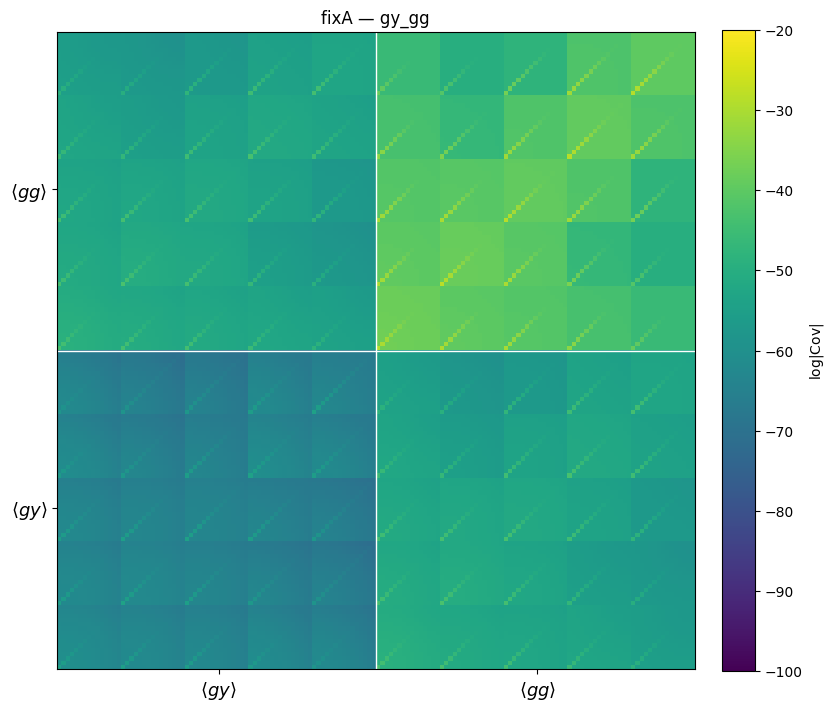

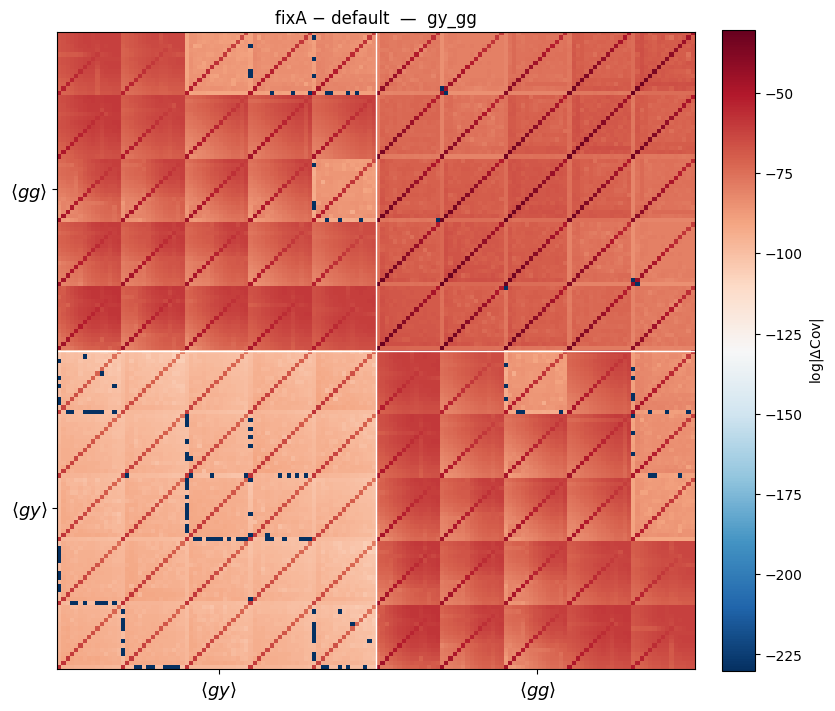


  fixA  —  probes: ['gg']
DV shape : (75,)  (5 bin-combos × 15 ell bins)
  [ 0]  gg  bin_1_1
  [ 1]  gg  bin_2_2
  [ 2]  gg  bin_3_3
  [ 3]  gg  bin_4_4
  [ 4]  gg  bin_5_5

Cov shape       : (75, 75)
Count per probe : {'gg': 5}
Min eigenvalue  : 4.260e-20
N negative eigv : 0


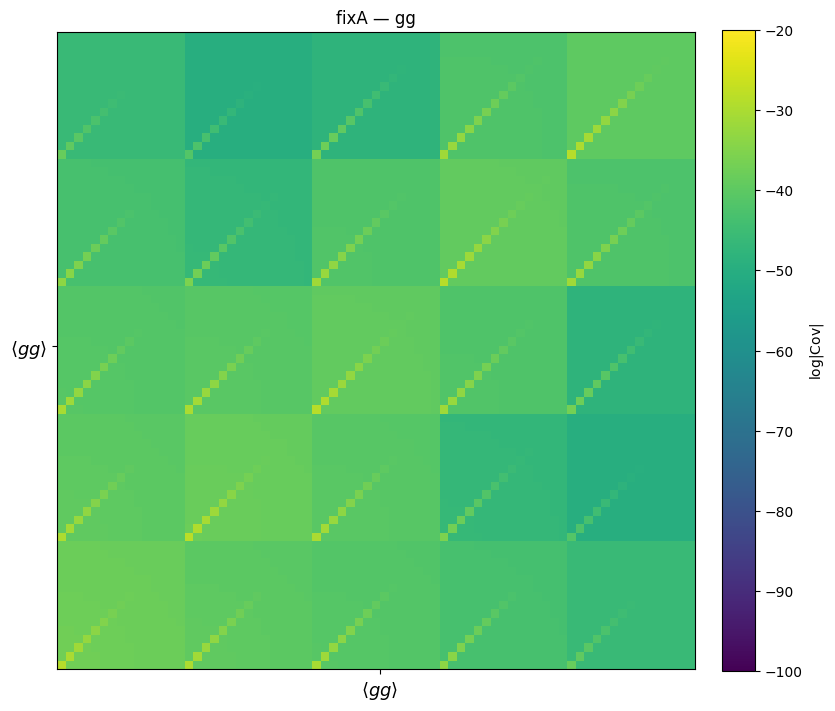

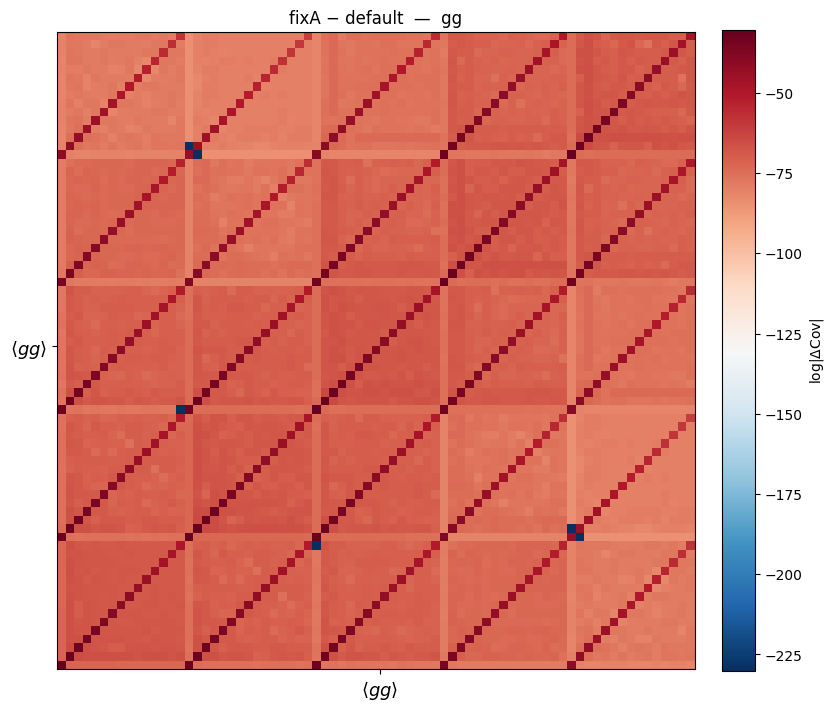

Fix B: mean Cl_gy ratio (fixB / default) = 0.9215  (< 1 because S < 1)
Fix B: mean Cl_yy ratio (fixB / default) = 0.9532  (< 1 because S < 1)
Fix B: get_cov done.

  fixB  —  probes: ['gy', 'gg']
DV shape : (150,)  (10 bin-combos × 15 ell bins)
  [ 0]  gy  bin_1_0
  [ 1]  gy  bin_2_0
  [ 2]  gy  bin_3_0
  [ 3]  gy  bin_4_0
  [ 4]  gy  bin_5_0
  [ 5]  gg  bin_1_1
  [ 6]  gg  bin_2_2
  [ 7]  gg  bin_3_3
  [ 8]  gg  bin_4_4
  [ 9]  gg  bin_5_5

Cov shape       : (150, 150)
Count per probe : {'gy': 5, 'gg': 5}
Min eigenvalue  : -6.768e-27
N negative eigv : 8


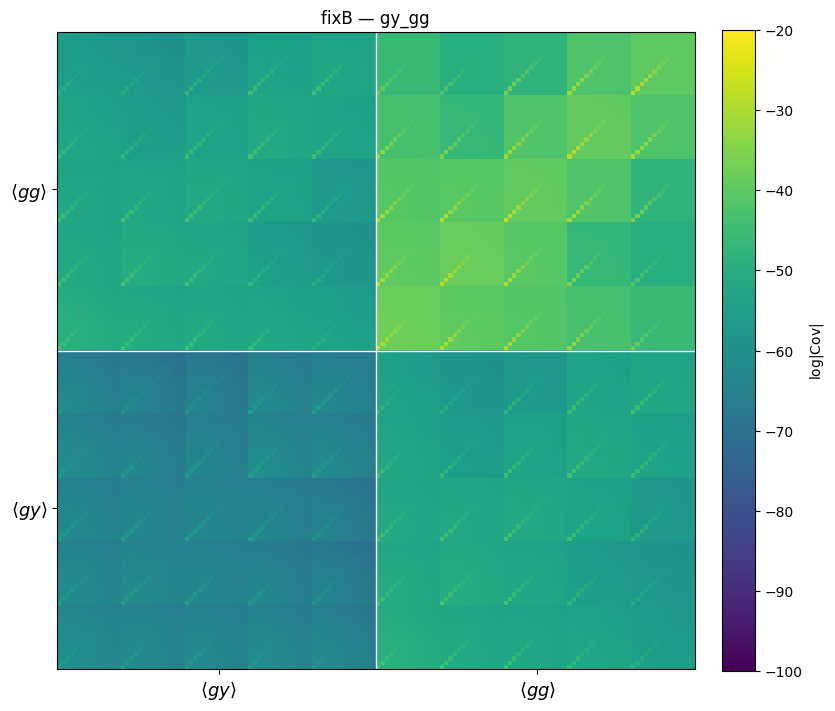

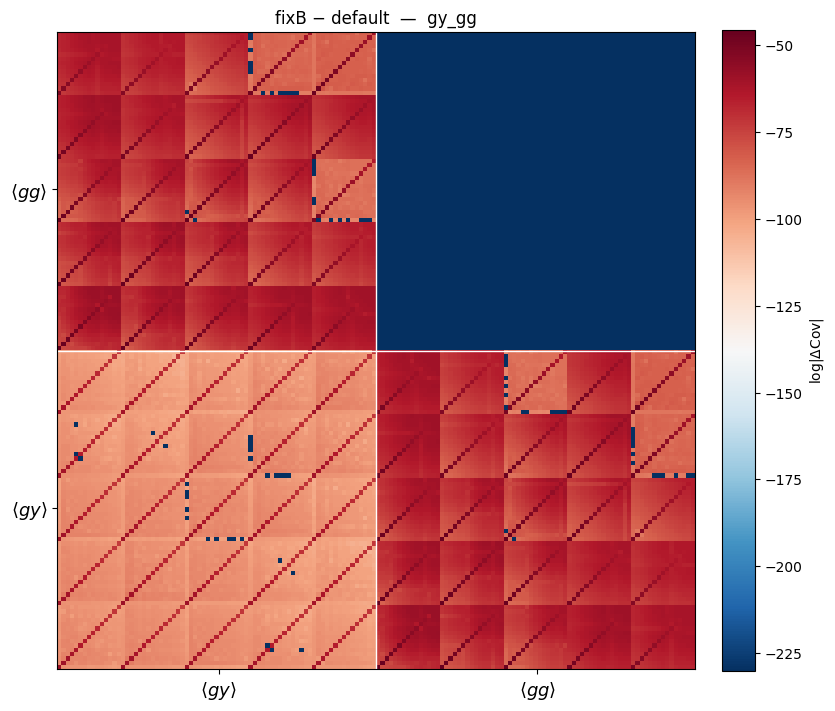


  fixB  —  probes: ['gg']
DV shape : (75,)  (5 bin-combos × 15 ell bins)
  [ 0]  gg  bin_1_1
  [ 1]  gg  bin_2_2
  [ 2]  gg  bin_3_3
  [ 3]  gg  bin_4_4
  [ 4]  gg  bin_5_5

Cov shape       : (75, 75)
Count per probe : {'gg': 5}
Min eigenvalue  : 3.871e-20
N negative eigv : 0


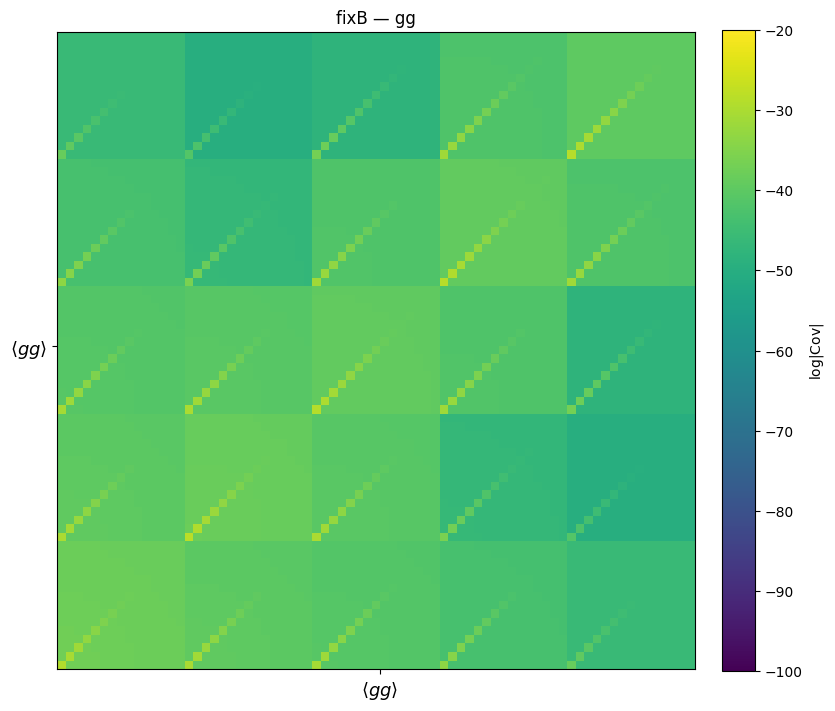

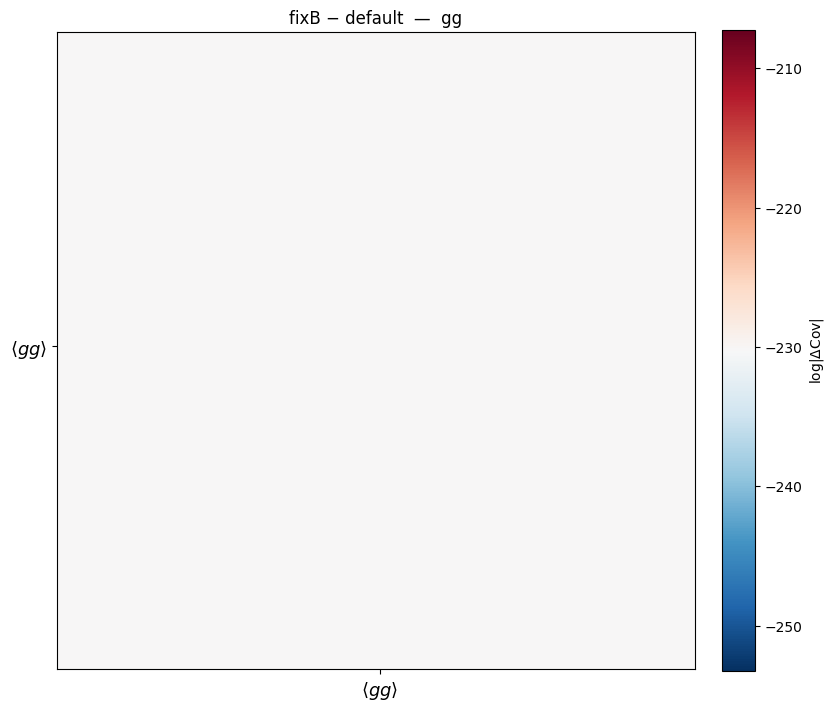

Fix C: mean Cl_gy ratio (fixC / default) = 0.9598  (< 1 because √S < 1)
Fix C: mean Cl_ky ratio (fixC / default) = 0.9642  (< 1 because √S < 1)
Fix C: Cl_yy unchanged  (ratio = 1.0000)
Fix C: get_cov done.

  fixC  —  probes: ['ky', 'gy']
DV shape : (150,)  (10 bin-combos × 15 ell bins)
  [ 0]  ky  bin_1_0
  [ 1]  ky  bin_2_0
  [ 2]  ky  bin_3_0
  [ 3]  ky  bin_4_0
  [ 4]  ky  bin_5_0
  [ 5]  gy  bin_1_0
  [ 6]  gy  bin_2_0
  [ 7]  gy  bin_3_0
  [ 8]  gy  bin_4_0
  [ 9]  gy  bin_5_0

Cov shape       : (150, 150)
Count per probe : {'ky': 5, 'gy': 5}
Min eigenvalue  : -7.546e-30
N negative eigv : 8


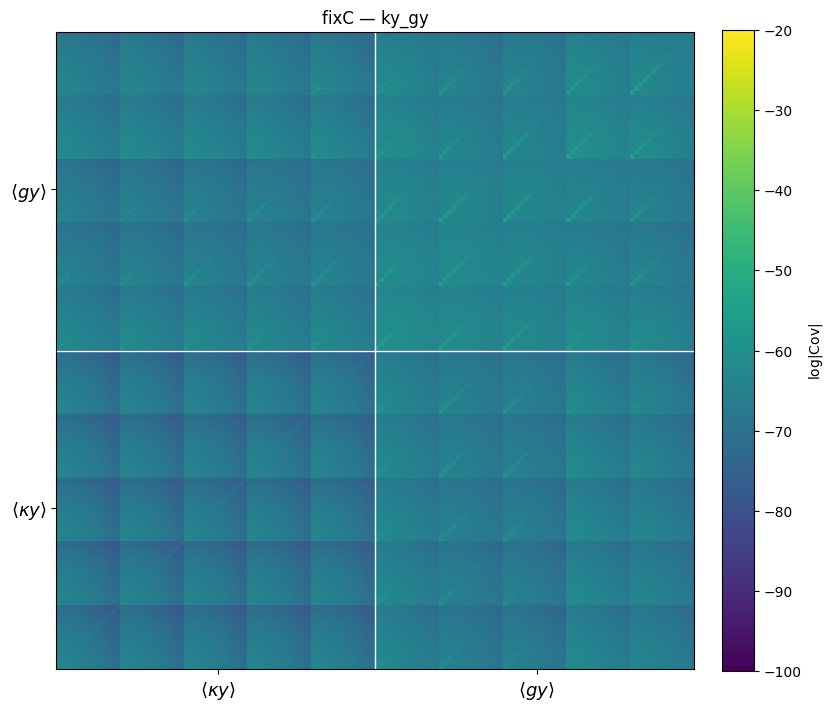

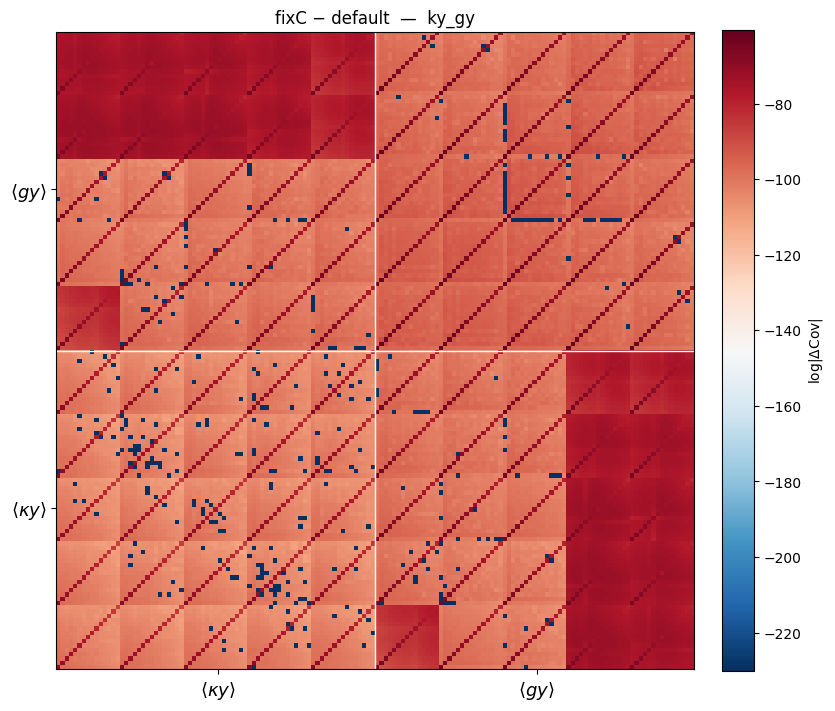


  fixC  —  probes: ['gy', 'gg']
DV shape : (150,)  (10 bin-combos × 15 ell bins)
  [ 0]  gy  bin_1_0
  [ 1]  gy  bin_2_0
  [ 2]  gy  bin_3_0
  [ 3]  gy  bin_4_0
  [ 4]  gy  bin_5_0
  [ 5]  gg  bin_1_1
  [ 6]  gg  bin_2_2
  [ 7]  gg  bin_3_3
  [ 8]  gg  bin_4_4
  [ 9]  gg  bin_5_5

Cov shape       : (150, 150)
Count per probe : {'gy': 5, 'gg': 5}
Min eigenvalue  : -6.777e-27
N negative eigv : 7


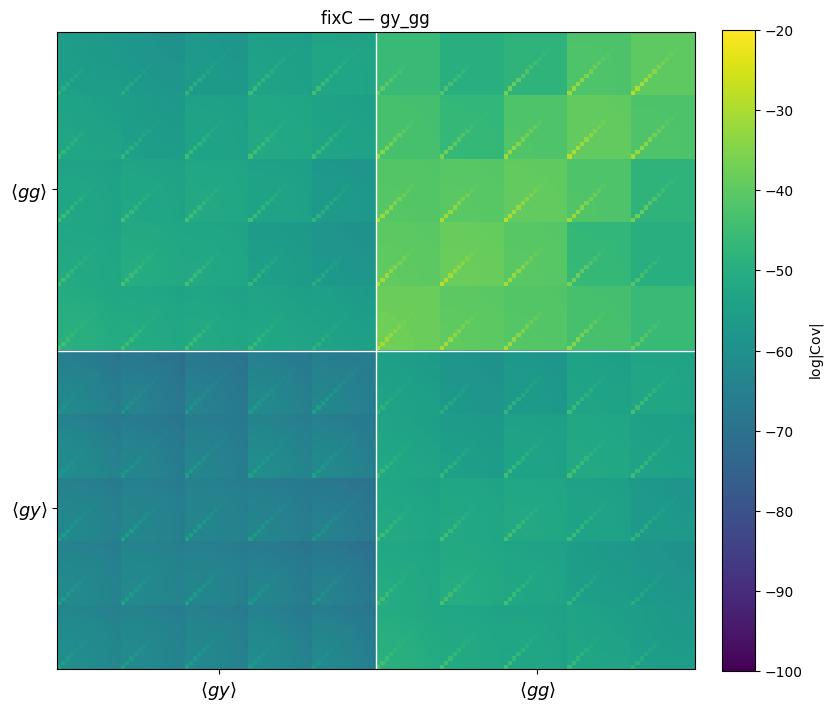

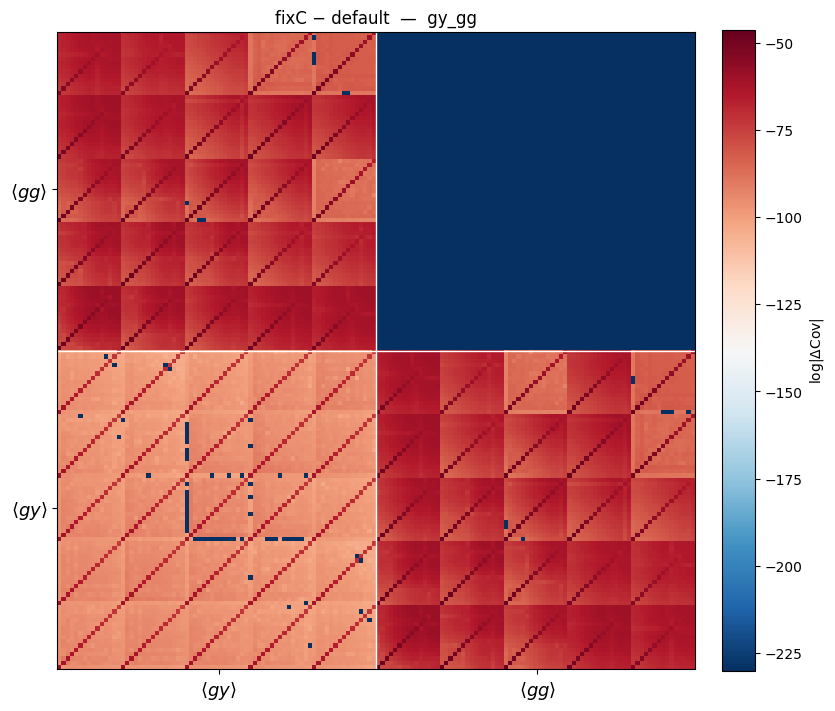


  fixC  —  probes: ['ky', 'kk']
DV shape : (300,)  (20 bin-combos × 15 ell bins)
  [ 0]  ky  bin_1_0
  [ 1]  ky  bin_2_0
  [ 2]  ky  bin_3_0
  [ 3]  ky  bin_4_0
  [ 4]  ky  bin_5_0
  [ 5]  kk  bin_1_1
  [ 6]  kk  bin_1_2
  [ 7]  kk  bin_1_3
  [ 8]  kk  bin_1_4
  [ 9]  kk  bin_1_5
  [10]  kk  bin_2_2
  [11]  kk  bin_2_3
  [12]  kk  bin_2_4
  [13]  kk  bin_2_5
  [14]  kk  bin_3_3
  [15]  kk  bin_3_4
  [16]  kk  bin_3_5
  [17]  kk  bin_4_4
  [18]  kk  bin_4_5
  [19]  kk  bin_5_5

Cov shape       : (300, 300)
Count per probe : {'ky': 5, 'kk': 15}
Min eigenvalue  : 7.944e-33
N negative eigv : 0


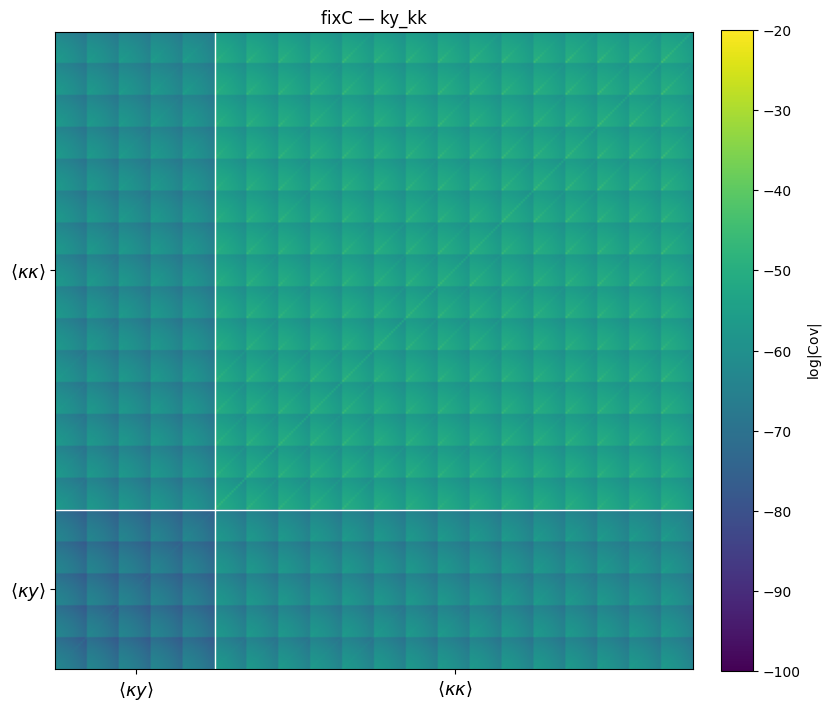

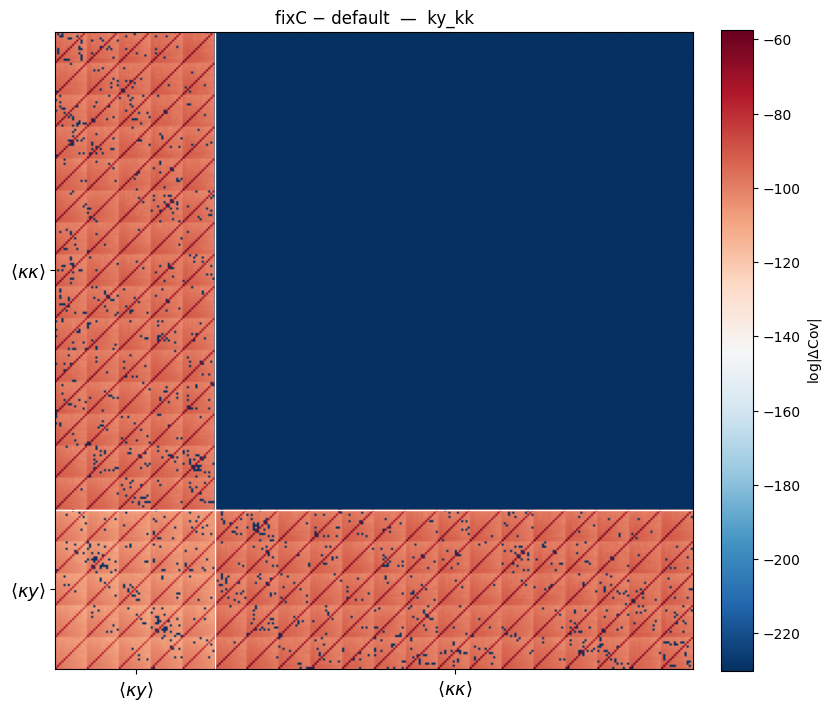


  fixC  —  probes: ['ky', 'gy', 'gg', 'gk']
DV shape : (600,)  (40 bin-combos × 15 ell bins)
  [ 0]  ky  bin_1_0
  [ 1]  ky  bin_2_0
  [ 2]  ky  bin_3_0
  [ 3]  ky  bin_4_0
  [ 4]  ky  bin_5_0
  [ 5]  gy  bin_1_0
  [ 6]  gy  bin_2_0
  [ 7]  gy  bin_3_0
  [ 8]  gy  bin_4_0
  [ 9]  gy  bin_5_0
  [10]  gg  bin_1_1
  [11]  gg  bin_2_2
  [12]  gg  bin_3_3
  [13]  gg  bin_4_4
  [14]  gg  bin_5_5
  [15]  gk  bin_1_1
  [16]  gk  bin_1_2
  [17]  gk  bin_1_3
  [18]  gk  bin_1_4
  [19]  gk  bin_1_5
  [20]  gk  bin_2_1
  [21]  gk  bin_2_2
  [22]  gk  bin_2_3
  [23]  gk  bin_2_4
  [24]  gk  bin_2_5
  [25]  gk  bin_3_1
  [26]  gk  bin_3_2
  [27]  gk  bin_3_3
  [28]  gk  bin_3_4
  [29]  gk  bin_3_5
  [30]  gk  bin_4_1
  [31]  gk  bin_4_2
  [32]  gk  bin_4_3
  [33]  gk  bin_4_4
  [34]  gk  bin_4_5
  [35]  gk  bin_5_1
  [36]  gk  bin_5_2
  [37]  gk  bin_5_3
  [38]  gk  bin_5_4
  [39]  gk  bin_5_5

Cov shape       : (600, 600)
Count per probe : {'ky': 5, 'gy': 5, 'gg': 5, 'gk': 25}
Min eigenvalue  : -1

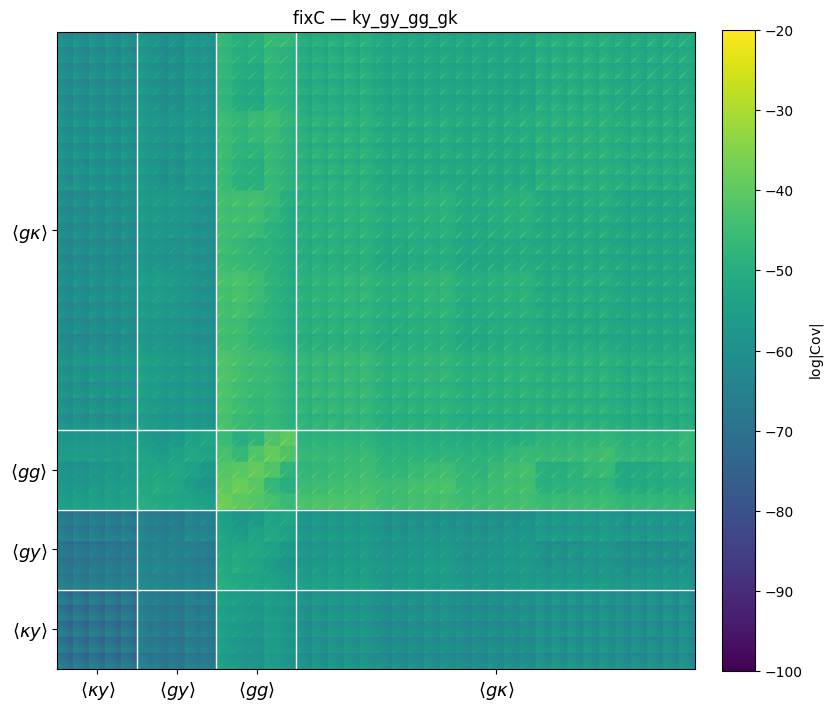

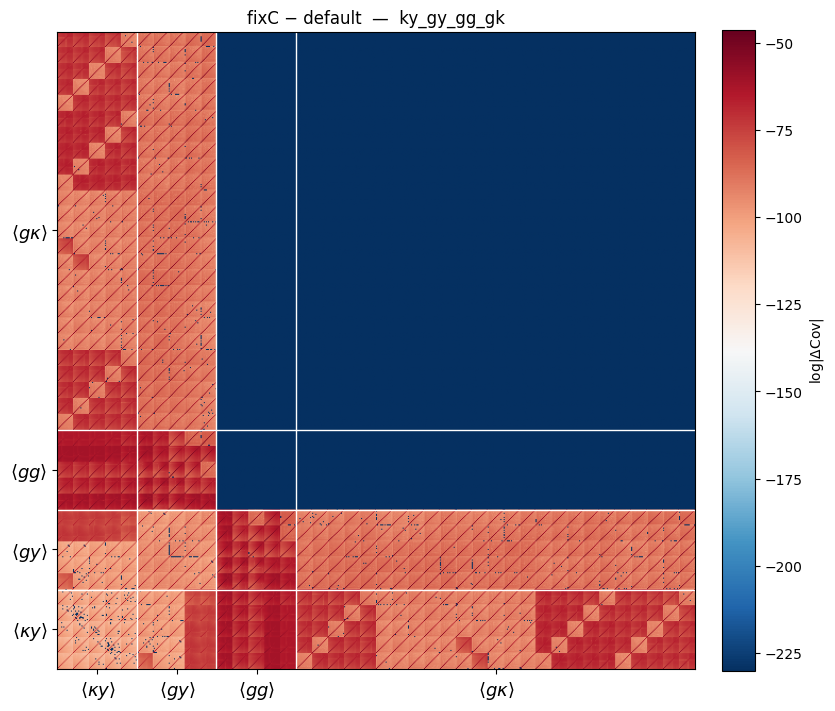

In [38]:
import copy                             
import jax.numpy as jnp
from godmax.base_class import get_vmapped_func_warg                                                                                                         
from godmax.get_covs import get_cov
                                                                                                                                                            
# ── Arrays from the default run ────────────────────────────────────────────────
ell_arr   = np.array(Cls_test.ell_array)           # (nell,)
chi_cls   = np.array(Cls_test.chi_array_for_Cls)   # (nz_for_Cls,)                                                                                          
z_cls_arr = np.array(Cls_test.z_array_for_Cls)     # (nz_for_Cls,)
z_arr     = np.array(Cls_test.z_array)             # (nz,) — 3D P grid                                                                                      
kPk       = np.array(Cls_test.kPk_array)           # (nk,)                                                                                                  
Pmm_sup   = np.array(Cls_test.Pmm_sup_tot_mat)     # (nk, nz)                                                                                               
                                                                                                                                                            
nell_val = len(ell_arr)                                                                                                                                     
nz_cls   = len(z_cls_arr)
log_kPk  = np.log(kPk)                                                                                                                                      
                                            
# Interpolate Pmm_sup from z_array (3D P grid) onto z_array_for_Cls (Limber grid)                                                                           
Pmm_sup_zcls = np.array([               
    np.interp(z_cls_arr, z_arr, Pmm_sup[ik, :])                                                                                                             
    for ik in range(len(kPk))                                                                                                                               
])  # (nk, nz_cls)                                                                                                                                          
                                                                                                                                                            
# Limber k = (ell+0.5)/chi  for every (ell, z_cls) pair
k_lim = (ell_arr[:, None] + 0.5) / np.maximum(chi_cls[None, :], 1.0)  # (nell, nz_cls)                                                                      
                                            
# Evaluate S(k_limber, z) via log-k interpolation at each (ell, z_cls)                                                                                      
S_lz = np.array([
    [np.interp(np.log(k_lim[il, jz]), log_kPk, Pmm_sup_zcls[:, jz])                                                                                         
    for jz in range(nz_cls)]           
    for il in range(nell_val)                                                                                                                               
])  # (nell, nz_cls)                                                                                                                                        
S_lz_jnp = jnp.array(S_lz)              
                                                                                                                                                            
print(f"S_lz shape : {S_lz.shape}  (nell={nell_val}, nz_for_Cls={nz_cls})")                                                                                 
print(f"S_lz range : [{S_lz.min():.4f}, {S_lz.max():.4f}],  mean={S_lz.mean():.4f}")
                                                                                                                                                            

# Cell — helper: DV + Cov + diff plot
                                                                                                                                                            
def _run_dv_cov(cov_obj, probes_arr, label, ref_obj=None):
    """Standard DV + cov block, plus diff vs ref_obj if provided."""                                                                                        
    tag = '_'.join(probes_arr)              
    print(f"\n{'='*62}\n  {label}  —  probes: {probes_arr}\n{'='*62}")
                                                                                                                                                            
    # ── Data vector ────────────────────────────────────────────────                                                                                       
    dv, entries, nell_dv = diag_utils.build_data_vector(                                                                                                    
        cov_obj.Cl_result_dict, probes_arr, key='tot_ellsurvey'                                                                                             
    )                                                                                                                                                       
    print(f"DV shape : {dv.shape}  ({len(entries)} bin-combos × {nell_dv} ell bins)")                                                                       
    for i, (probe, (b1, b2)) in enumerate(entries):                                                                                                         
        print(f"  [{i:2d}]  {probe}  bin_{b1}_{b2}")
                                                                                                                                                            
    # ── Covariance matrix ──────────────────────────────────────────                                                                                       
    cov, _, count_per_probe, nell_c = diag_utils.build_cov_matrix(
        cov_obj.covtot_dict, cov_obj.Cl_result_dict, probes_arr, warn_missing=True                                                                          
    )                                       
    print(f"\nCov shape       : {cov.shape}")                                                                                                               
    print(f"Count per probe : {dict(zip(probes_arr, count_per_probe))}")                                                                                    
    eigvals = np.linalg.eigvalsh(cov)                                                                                                                       
    print(f"Min eigenvalue  : {eigvals.min():.3e}")                                                                                                         
    print(f"N negative eigv : {(eigvals < 0).sum()}")                                                                                                       
                
    # ── Cov plot ───────────────────────────────────────────────────                                                                                       
    fig, ax = plt.subplots(figsize=(9, 9))
    diag_utils.plot_cov_matrix(cov, count_per_probe, probes_arr, nell_c, ax=ax)                                                                             
    ax.set_title(f'{label} — {tag}', fontsize=12)                                                                                                           
    fig.savefig(FIGDIR / f"cov_{label}_{tag}.png", dpi=200, bbox_inches='tight')
    plt.show()                                                                                                                                              
                                                                                                                                                            
    # ── Diff plot vs reference ─────────────────────────────────────                                                                                       
    if ref_obj is not None:                                                                                                                                 
        cov_ref, _, _, _ = diag_utils.build_cov_matrix(                                                                                                     
            ref_obj.covtot_dict, ref_obj.Cl_result_dict, probes_arr, warn_missing=False                                                                     
        )                                   
        diff = cov - cov_ref                                                                                                                                
        bounds = diag_utils.get_probe_boundaries(count_per_probe, nell_c)
                                                                                                                                                            
        fig2, ax2 = plt.subplots(figsize=(9, 9))
        im = ax2.imshow(                                                                                                                                    
            np.log(np.abs(diff) + 1e-100),                                                                                                                  
            origin='lower', cmap='RdBu_r'   
        )                                                                                                                                                   
        for edge in bounds['edges'][1:-1]:
            ax2.axhline(edge - 0.5, color='white', lw=1.0)                                                                                                  
            ax2.axvline(edge - 0.5, color='white', lw=1.0)
        tick_labels = [diag_utils.PROBE_LATEX.get(p, p) for p in probes_arr]                                                                                
        ax2.set_xticks(bounds['centers']); ax2.set_xticklabels(tick_labels, fontsize=13)
        ax2.set_yticks(bounds['centers']); ax2.set_yticklabels(tick_labels, fontsize=13)                                                                    
        ax2.set_xlim(-0.5, cov.shape[1] - 0.5)
        ax2.set_ylim(-0.5, cov.shape[0] - 0.5)                                                                                                              
        plt.colorbar(im, ax=ax2, label=r'$\log|\Delta\mathrm{Cov}|$',
                    fraction=0.046, pad=0.04)                                                                                                              
        ax2.set_title(f'{label} − default  —  {tag}', fontsize=12)                                                                                          
        fig2.savefig(FIGDIR / f"cov_diff_{label}_{tag}.png", dpi=200, bbox_inches='tight')                                                                  
        plt.show()                                                                                                                                          
                
    return cov                                                                                                                                              
                
# Cell — Fix A: patch + get_cov           

# Fix A: Remove Pmm_sup from Pgg                                                                                                                            
# ─────────────────────────────────────────────────────────────────────────────
# cached_power_spectra[2,2] was built from Pgg_tot = Pgg_raw * S.                                                                                           
# Divide by S_lz to recover Pgg_raw on the (nell, nz_for_Cls) Limber grid.
# Only Cl_gal_gal_tot_mat needs recomputing; all other Cls are unchanged.                                                                                   
                                            
cls_fixA = copy.copy(Cls_test)                                                                                                                              
cls_fixA.cached_power_spectra = Cls_test.cached_power_spectra.at[2, 2].set(                                                                                 
    Cls_test.cached_power_spectra[2, 2] / S_lz_jnp                                                                                                          
)                                                                                                                                                           
                                                                                                                                                            
nbins_lens = int(Cls_test.nbins_lens)       
vmapped_gg = get_vmapped_func_warg(cls_fixA.get_Cl_tot, 2, 4)                                                                                               
cls_fixA.Cl_gal_gal_tot_mat = vmapped_gg(
    jnp.arange(nbins_lens), jnp.arange(nbins_lens), 2, 2                                                                                                    
).T  # (nell, nbins_lens, nbins_lens)   
                                                                                                                                                            
ratio_gg = float(                                                                                                                                           
    cls_fixA.Cl_gal_gal_tot_mat.mean() / Cls_test.Cl_gal_gal_tot_mat.mean()
)                                                                                                                                                           
print(f"Fix A: mean Cl_gg ratio (fixA / default) = {ratio_gg:.4f}  (> 1 because S < 1)")
                                                                                                                                                            
cov_fixA = get_cov(                                                                                                                                         
    sim_params_dict, halo_params_dict, analysis_dict, other_params_dict,
    Cl_obj=cls_fixA                                                                                                                                         
)                                       
print("Fix A: get_cov done.")                                                                                                                               
                                                                                                                                                            
# Cell — Fix A: DV + Cov + diff                                                                                                                               
                                                                                                                                                            
for probes_arr in [['gy', 'gg'], ['gg']]:
    _ = _run_dv_cov(cov_fixA, probes_arr, 'fixA', ref_obj=cov_test)                                                                                         
                                            
# Cell — Fix B: patch + get_cov                                                                                                                               
                                                                                                                                                            
# Fix B: Apply Pmm_sup consistently to Pgy and Pyy                                                                                                          
# ─────────────────────────────────────────────────────────────────────────────                                                                             
# The C-S violation might arise because Pgg is suppressed by S but Pgy and Pyy are not:
#   Pgy_raw² > Pgg_raw*S · Pyy_raw  when S < 1
#                                                                                                                                                           
# Applying S to both Pgy and Pyy restores C-S:
#   (Pgy*S)²  ≤  (Pgg*S) · (Pyy*S)  iff  Pgy² ≤ Pgg*Pyy  (natural C-S from physics)                                                                         
#                                                                                                                                                           
# Note: Pky (cached_power_spectra[0,3]) is also updated for consistency                                                                                     
# (similar asymmetric suppression issue exists for the kk/ky/yy sub-block).                                                                                 
# Beam factors are already baked into [2,3] and [3,3]; S multiplies the signal only.                                                                        
                                                                                                                                                            
cls_fixB = copy.copy(Cls_test)                                                                                                                              
                                                                                                                                                            
# Pgy and Pky: multiply by S                                                                                                                                
cls_fixB.cached_power_spectra = (                                                                                                                           
    Cls_test.cached_power_spectra                                                                                                                           
    .at[2, 3].set(Cls_test.cached_power_spectra[2, 3] * S_lz_jnp)                                                                                           
    .at[3, 2].set(Cls_test.cached_power_spectra[2, 3] * S_lz_jnp)  # symmetric
    .at[0, 3].set(Cls_test.cached_power_spectra[0, 3] * S_lz_jnp)                                                                                           
    .at[3, 0].set(Cls_test.cached_power_spectra[0, 3] * S_lz_jnp)  # symmetric
    # Pyy: multiply by S                                                                                                                                    
    .at[3, 3].set(Cls_test.cached_power_spectra[3, 3] * S_lz_jnp)                                                                                           
)                                                                                                                                                           
                                                                                                                                                            
nbins_lens = int(Cls_test.nbins_lens)                                                                                                                       
nbins      = int(Cls_test.nbins)                                                                                                                            
                                                                                                                                                            
# Recompute Cl matrices that depend on probe 3 (y)                                                                                                          
vmapped_gy = get_vmapped_func_warg(cls_fixB.get_Cl_tot, 1, 4)
vmapped_ky = get_vmapped_func_warg(cls_fixB.get_Cl_tot, 1, 4)                                                                                               
                                                                                                                                                            
cls_fixB.Cl_gal_y_tot_mat    = vmapped_gy(jnp.arange(nbins_lens), 0, 2, 3).T  # (nell, nbins_lens)                                                          
cls_fixB.Cl_kappa_y_tot_mat  = vmapped_ky(jnp.arange(nbins),      0, 0, 3).T  # (nell, nbins)                                                               
cls_fixB.Cl_y_y_signal_mat   = cls_fixB.get_Cl_tot(0, 0, 3, 3)                # (nell,)                                                                     
# Preserve the external noise file; only the theory signal changes                                                                                          
cls_fixB.Cl_y_y_tot_mat      = cls_fixB.Cl_y_y_signal_mat + Cls_test.Cl_y_y_noise_mat                                                                       
                                                                                                                                                            
for label, ratio in [                                                                                                                                       
    ('Cl_gy', cls_fixB.Cl_gal_y_tot_mat.mean() / Cls_test.Cl_gal_y_tot_mat.mean()),                                                                         
    ('Cl_yy', cls_fixB.Cl_y_y_signal_mat.mean() / Cls_test.Cl_y_y_signal_mat.mean()),                                                                       
]:                                                                                                                                                          
    print(f"Fix B: mean {label} ratio (fixB / default) = {float(ratio):.4f}  (< 1 because S < 1)")                                                          
                                                                                                                                                            
cov_fixB = get_cov(                                                                                                                                         
    sim_params_dict, halo_params_dict, analysis_dict, other_params_dict,                                                                                    
    Cl_obj=cls_fixB                                                                                                                                         
)                                       
print("Fix B: get_cov done.")                                                                                                                               
                                                                                                                                                            
# Cell — Fix B: DV + Cov + diff                                                                                                                               
                
for probes_arr in [['gy', 'gg'], ['gg']]:
    _ = _run_dv_cov(cov_fixB, probes_arr, 'fixB', ref_obj=cov_test)


# Cell — Fix C: patch + get_cov                                                                                                         
                                                                                                                                        
# Fix C: Apply √S to Pgy and Pky only — leave Pyy unchanged                                                                             
# ─────────────────────────────────────────────────────────────────────────────                                                         
# Derivation: S is defined for the matter auto-spectrum P_mm = P_mm^halo × S.
# This corresponds to a field-level rescaling  ũ_m^eff = √S · ũ_m^NFW,                                                                  
# because the auto-spectrum is quadratic in the profile.
# A cross-spectrum picks up one factor per field:                                                                                       
#   P_gy: NFW (galaxy, √S) × BCMP (y, 1)  →  P_gy × √S                                                                                  
#   P_ky: BCMP (y, 1) × NFW (matter, √S)  →  P_ky × √S                                                                                  
#   P_yy: BCMP × BCMP                      →  unchanged  (already physical)                                                             
# This is a congruence transformation D M D with D = diag(√S, √S, 1),                                                                   
# which preserves positive semi-definiteness by construction.                                                                           
                                                                                                                                        
sqrtS_lz_jnp = jnp.sqrt(S_lz_jnp)   # (nell, nz_for_Cls)                                                                                
                                                                                                                                        
cls_fixC = copy.copy(Cls_test)                                                                                                          
                                                                                                                                        
cls_fixC.cached_power_spectra = (                                                                                                       
    Cls_test.cached_power_spectra                                                                                                       
    .at[2, 3].set(Cls_test.cached_power_spectra[2, 3] * sqrtS_lz_jnp)                                                                 
    .at[3, 2].set(Cls_test.cached_power_spectra[2, 3] * sqrtS_lz_jnp)  # symmetric                                                      
    .at[0, 3].set(Cls_test.cached_power_spectra[0, 3] * sqrtS_lz_jnp)                                                                 
    .at[3, 0].set(Cls_test.cached_power_spectra[0, 3] * sqrtS_lz_jnp)  # symmetric
    # [3, 3] (Pyy) intentionally left unchanged — BCMP already physical                                                                 
)                                                                                                                                       
                                                                                                                                        
nbins_lens = int(Cls_test.nbins_lens)                                                                                                   
nbins      = int(Cls_test.nbins)                                                                                                        
                                                                                                                                        
vmapped_gy = get_vmapped_func_warg(cls_fixC.get_Cl_tot, 1, 4)                                                                           
vmapped_ky = get_vmapped_func_warg(cls_fixC.get_Cl_tot, 1, 4)                                                                         
                                            
cls_fixC.Cl_gal_y_tot_mat   = vmapped_gy(jnp.arange(nbins_lens), 0, 2, 3).T  # (nell, nbins_lens)                                       
cls_fixC.Cl_kappa_y_tot_mat = vmapped_ky(jnp.arange(nbins),      0, 0, 3).T  # (nell, nbins)
# Pyy unchanged: Cl_y_y_signal_mat and Cl_y_y_tot_mat stay as in Cls_test                                                               
                                                                                                                                        
for label, new_mat, ref_mat in [                                                                                                        
    ('Cl_gy', cls_fixC.Cl_gal_y_tot_mat,   Cls_test.Cl_gal_y_tot_mat),                                                                  
    ('Cl_ky', cls_fixC.Cl_kappa_y_tot_mat, Cls_test.Cl_kappa_y_tot_mat),                                                                
]:                                          
    print(f"Fix C: mean {label} ratio (fixC / default) = {float(new_mat.mean() / ref_mat.mean()):.4f}  (< 1 because √S < 1)")           
print(f"Fix C: Cl_yy unchanged  (ratio = 1.0000)")                                                                                      
                                                                                                                                        
cov_fixC = get_cov(                                                                                                                     
    sim_params_dict, halo_params_dict, analysis_dict, other_params_dict,                                                                
    Cl_obj=cls_fixC                                                                                                                     
)                                                                                                                                       
print("Fix C: get_cov done.")                                                                                                           
                                                                                                                                        
# Cell — Fix C: DV + Cov + diff             
                                                                                                                                        
for probes_arr in [['ky', 'gy'], ['gy', 'gg'], ['ky', 'kk'], ['ky', 'gy', 'gg', 'gk']]:                                               
    _ = _run_dv_cov(cov_fixC, probes_arr, 'fixC', ref_obj=cov_test) 
                

Covariance negative eigenvalue summary
label          min_eigval    n_neg        max_neg
default        -6.813e-27        7     -6.859e-30
fixA           -6.453e-27        6     -6.128e-30
fixB           -6.768e-27        8     -1.927e-30

Worst eigenvector decomposition (default):
  gy bin_1_0  power=0.8947
  gy bin_2_0  power=0.0807
  gy bin_3_0  power=0.0159
  gy bin_4_0  power=0.0077
  gy bin_5_0  power=0.0010
  gg bin_1_1  power=0.0000
  gg bin_2_2  power=0.0000
  gg bin_3_3  power=0.0000
  gg bin_4_4  power=0.0000
  gg bin_5_5  power=0.0000

  Peak ell for dominant entry: ell=717.7


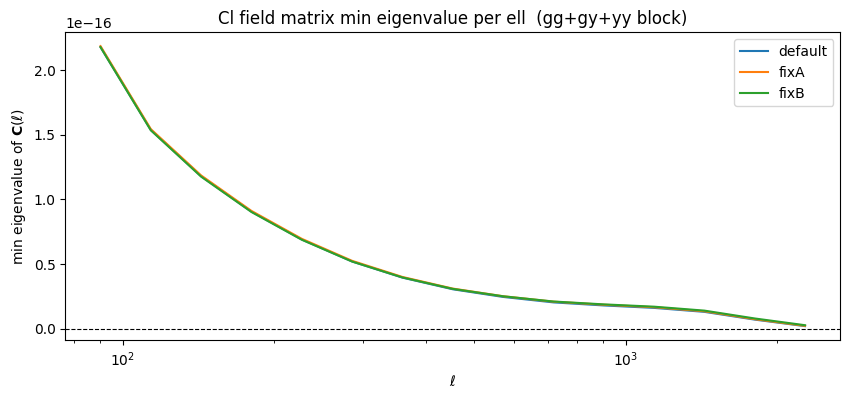

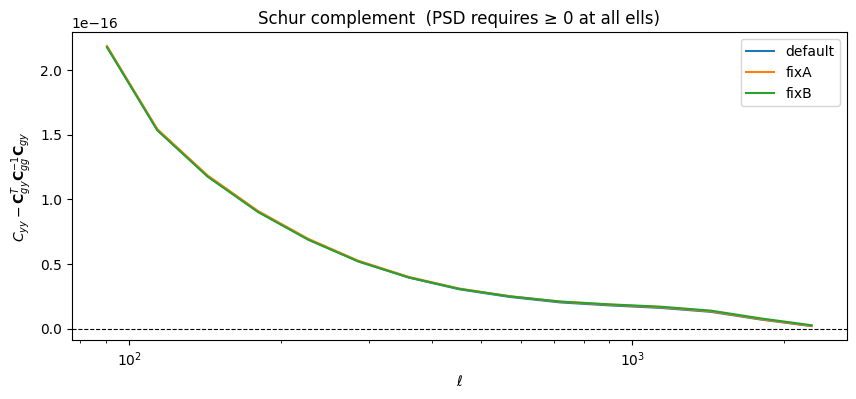

In [20]:
# ── 1. Summary: magnitude of negative eigenvalues across variants ──────────────
print("Covariance negative eigenvalue summary")                                                                                                             
print(f"{'label':<10} {'min_eigval':>14} {'n_neg':>8} {'max_neg':>14}")
for label, cov_obj in [('default', cov_test), ('fixA', cov_fixA), ('fixB', cov_fixB)]:                                                                      
    cov_m, entries, cnt, nell_c = diag_utils.build_cov_matrix(
        cov_obj.covtot_dict, cov_obj.Cl_result_dict, ['gy', 'gg'], warn_missing=False                                                                       
    )
    ev = np.linalg.eigvalsh(cov_m)                                                                                                                          
    neg = ev[ev < 0]                                                                                                                                        
    print(f"{label:<10} {ev.min():>14.3e} {len(neg):>8} {neg.max() if len(neg) else 0.:>14.3e}")
                                                                                                                                                            
# ── 2. Identify the worst eigenvector ─────────────────────────────────────────                                                                            
print("\nWorst eigenvector decomposition (default):")                                                                                                       
cov_m, entries, cnt, nell_c = diag_utils.build_cov_matrix(                                                                                                  
    cov_test.covtot_dict, cov_test.Cl_result_dict, ['gy', 'gg'], warn_missing=False                                                                         
)
eigvals_all, eigvecs_all = np.linalg.eigh(cov_m)                                                                                                            
idx_worst = np.argmin(eigvals_all)                                                                                                                          
v_worst   = eigvecs_all[:, idx_worst]
n_entries = len(entries)                                                                                                                                    
entry_power = np.array([np.sum(v_worst[i*nell_c:(i+1)*nell_c]**2) for i in range(n_entries)])
for i in np.argsort(entry_power)[::-1]:                                                                                                                     
    probe, (b1, b2) = entries[i]
    print(f"  {probe} bin_{b1}_{b2}  power={entry_power[i]:.4f}")                                                                                           

# Which ell within the dominant entry?                                                                                                                      
dom = np.argmax(entry_power)
ell_power = v_worst[dom*nell_c:(dom+1)*nell_c]**2                                                                                                           
ell_survey = np.array(cov_test.Cl_result_dict['l_array_survey'])                                                                                            
print(f"\n  Peak ell for dominant entry: ell={ell_survey[np.argmax(ell_power)]:.1f}")                                                                       
                                                                                                                                                            
# ── 3. Per-ell Cl field matrix PSD check ──────────────────────────────────────                                                                            
nbins_lens = int(cov_test.nbins_lens)                                                                                                                       
                                                                                                                                                            
fig, ax = plt.subplots(figsize=(10, 4))                                                                                                                     
for label, cov_obj in [('default', cov_test), ('fixA', cov_fixA), ('fixB', cov_fixB)]:                                                                      
    min_ev_ell = []                                                                                                                                         
    for il in range(len(ell_survey)):
        dim = nbins_lens + 1                                                                                                                                
        Cf = np.zeros((dim, dim))
        for jb1 in range(nbins_lens):                                                                                                                       
            for jb2 in range(nbins_lens):
                Cf[jb1, jb2] = float(                                                                                                                       
                    cov_obj.Cl_result_dict['gg'][f'bin_{jb1+1}_{jb2+1}']['tot_plus_noise_ellsurvey'][il]
                )                                                                                                                                           
        for jb1 in range(nbins_lens):
            v = float(cov_obj.Cl_result_dict['gy'][f'bin_{jb1+1}_0']['tot_ellsurvey'][il])                                                                  
            Cf[jb1, nbins_lens] = v                                                                                                                         
            Cf[nbins_lens, jb1] = v
        Cf[nbins_lens, nbins_lens] = float(                                                                                                                 
            cov_obj.Cl_result_dict['yy']['bin_0_0']['tot_plus_noise_ellsurvey'][il]                                                                         
        )
        min_ev_ell.append(np.linalg.eigvalsh(Cf).min())                                                                                                     
    min_ev_ell = np.array(min_ev_ell)                                                                                                                       
    ax.semilogx(ell_survey, min_ev_ell, label=label)
                                                                                                                                                            
ax.axhline(0, color='k', lw=0.8, ls='--')                                                                                                                   
ax.set(xlabel=r'$\ell$', ylabel=r'min eigenvalue of $\mathbf{C}(\ell)$',
        title='Cl field matrix min eigenvalue per ell  (gg+gy+yy block)')                                                                                    
ax.legend()                                                                                                                                                 
fig.savefig(FIGDIR / 'diag_field_matrix_eigval.png', dpi=200, bbox_inches='tight')                                                                          
plt.show()                                                                                                                                                  

# ── 4. Per-ell Schur complement: C_yy - C_gy^T C_gg^{-1} C_gy ────────────────                                                                             
fig2, ax2 = plt.subplots(figsize=(10, 4))
for label, cov_obj in [('default', cov_test), ('fixA', cov_fixA), ('fixB', cov_fixB)]:                                                                      
    schur_ell = []                                                                                                                                          
    for il in range(len(ell_survey)):
        Cgg = np.array([                                                                                                                                    
            [float(cov_obj.Cl_result_dict['gg'][f'bin_{jb1+1}_{jb2+1}']['tot_plus_noise_ellsurvey'][il])                                                    
            for jb2 in range(nbins_lens)]                                                                                                                  
            for jb1 in range(nbins_lens)                                                                                                                    
        ])                                                                                                                                                  
        Cgy = np.array([
            float(cov_obj.Cl_result_dict['gy'][f'bin_{jb1+1}_0']['tot_ellsurvey'][il])
            for jb1 in range(nbins_lens)                                                                                                                    
        ])
        Cyy = float(cov_obj.Cl_result_dict['yy']['bin_0_0']['tot_plus_noise_ellsurvey'][il])                                                                
        try:                                                                                                                                                
            schur = Cyy - Cgy @ np.linalg.solve(Cgg, Cgy)
        except np.linalg.LinAlgError:                                                                                                                       
            schur = np.nan
        schur_ell.append(schur)                                                                                                                             
    ax2.semilogx(ell_survey, schur_ell, label=label)
                                                                                                                                                            
ax2.axhline(0, color='k', lw=0.8, ls='--')                                                                                                                  
ax2.set(xlabel=r'$\ell$', ylabel=r'$C_{yy} - \mathbf{C}_{gy}^T \mathbf{C}_{gg}^{-1} \mathbf{C}_{gy}$',
        title='Schur complement  (PSD requires ≥ 0 at all ells)')                                                                                           
ax2.legend()                                                                                                                                                
fig2.savefig(FIGDIR / 'diag_schur_complement.png', dpi=200, bbox_inches='tight')                                                                            
plt.show()   

Knox formula vs cov_test.covG_dict — diagonal relative errors
probe pair    bin combo                  max_rel_err   mean_rel_err  status
----------------------------------------------------------------------------
ky_ky         bin_1_0_1_0                  2.112e-16      7.404e-17  OK
ky_ky         bin_1_0_2_0                  1.976e-16      7.252e-17  OK
ky_ky         bin_1_0_3_0                  2.024e-16      5.092e-17  OK
ky_ky         bin_1_0_4_0                  2.186e-16      3.760e-17  OK
ky_ky         bin_1_0_5_0                  1.612e-16      2.673e-17  OK
ky_ky         bin_2_0_1_0                  1.976e-16      7.252e-17  OK
ky_ky         bin_2_0_2_0                  2.049e-16      5.818e-17  OK
ky_ky         bin_2_0_3_0                  2.130e-16      3.239e-17  OK
ky_ky         bin_2_0_4_0                  1.527e-16      5.515e-17  OK
ky_ky         bin_2_0_5_0                  1.583e-16      1.804e-17  OK
ky_ky         bin_3_0_1_0                  2.024e-16      5.092e-

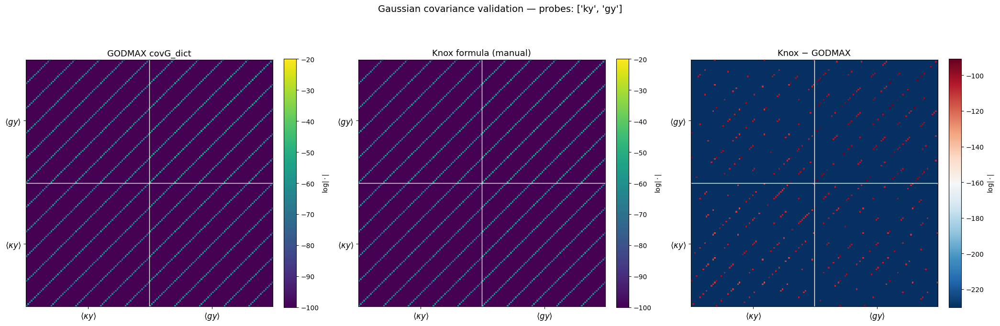

In [24]:
# ══════════════════════════════════════════════════════════════════════════════
# Knox formula validation: manual vs cov_test.covG_dict
# ══════════════════════════════════════════════════════════════════════════════

# ── 0. Helpers ────────────────────────────────────────────────────────────────

def _cl_tot_noise(Cl_result_dict, probe, ba, bb):
    """
    Return Cl^{tot+N}_{probe, ba, bb} as (nell,) array.
    Tries: (probe,ba,bb), (probe,bb,ba),
           (rev_probe,bb,ba), (rev_probe,ba,bb).
    Reversed-probe + reversed-bins is tried BEFORE reversed-probe + same-bins
    so that e.g. Cl_kg(b1,b3) → Cl_gk(b3,b1), not Cl_gk(b1,b3).
    Returns zeros if not found.
    """
    ell = np.array(Cl_result_dict["l_array_survey"])
    for p, a, b in [(probe, ba, bb), (probe, bb, ba),
                    (probe[::-1], bb, ba),   # reversed bins FIRST for reversed probe
                    (probe[::-1], ba, bb)]:
        if p not in Cl_result_dict:
            continue
        bkey = f"bin_{a}_{b}"
        entry = Cl_result_dict[p].get(bkey, {})
        if "tot_plus_noise_ellsurvey" in entry:
            return np.array(entry["tot_plus_noise_ellsurvey"])
    return np.zeros_like(ell, dtype=float)


def _cl_noise_only(Cl_result_dict, probe, ba, bb):
    """
    Return Nl_{probe, ba, bb} = Cl_tot_noise - Cl_signal as (nell,) array.
    Same lookup ordering as _cl_tot_noise.  Returns zeros if not found.
    """
    ell = np.array(Cl_result_dict["l_array_survey"])
    for p, a, b in [(probe, ba, bb), (probe, bb, ba),
                    (probe[::-1], bb, ba),
                    (probe[::-1], ba, bb)]:
        if p not in Cl_result_dict:
            continue
        bkey = f"bin_{a}_{b}"
        entry = Cl_result_dict[p].get(bkey, {})
        if "tot_plus_noise_ellsurvey" in entry and "tot_ellsurvey" in entry:
            return (np.array(entry["tot_plus_noise_ellsurvey"])
                    - np.array(entry["tot_ellsurvey"]))
    return np.zeros_like(ell, dtype=float)


def knox_diag(Cl_result_dict, stat1, stat2, b1, b2, b3, b4, fsky_dict):
    """
    Knox-formula Gaussian covariance diagonal (nell,) for a single block.

    Cov_G(Cl^{AB}_{b1b2}_ℓ, Cl^{CD}_{b3b4}_ℓ) =
        [C̃^{AC}_{b1b3} · C̃^{BD}_{b2b4} + C̃^{AD}_{b1b4} · C̃^{BC}_{b2b3}
         + Nl_BB (kk×kk only)]
        / [fsky · (2ℓ+1) · Δℓ]

    where A,B = stat1; C,D = stat2; C̃ = tot+noise.
    Nl_BB matches the GODMAX get_cov_G B-mode shape-noise correction:
        Nl_BB = δ_{b1b3}δ_{b2b4} Nl^{AC}·Nl^{BD}
              + δ_{b1b4}δ_{b2b3} Nl^{AD}·Nl^{BC}
    """
    A, B = stat1[0], stat1[1]
    C, D = stat2[0], stat2[1]

    ell  = np.array(Cl_result_dict["l_array_survey"])
    dl   = np.array(Cl_result_dict["dl_array_survey"])
    fsky = np.sqrt(fsky_dict.get(A+B, fsky_dict.get(B+A, 0.1)) *
                   fsky_dict.get(C+D, fsky_dict.get(D+C, 0.1)))

    Cl_AC = _cl_tot_noise(Cl_result_dict, A+C, b1, b3)
    Cl_BD = _cl_tot_noise(Cl_result_dict, B+D, b2, b4)
    Cl_AD = _cl_tot_noise(Cl_result_dict, A+D, b1, b4)
    Cl_BC = _cl_tot_noise(Cl_result_dict, B+C, b2, b3)

    numerator = Cl_AC * Cl_BD + Cl_AD * Cl_BC

    # B-mode shape-noise correction (mirrors GODMAX get_cov_G iskk branch)
    if stat1 == "kk" and stat2 == "kk":
        Nl_AC = _cl_noise_only(Cl_result_dict, A+C, b1, b3)
        Nl_BD = _cl_noise_only(Cl_result_dict, B+D, b2, b4)
        Nl_AD = _cl_noise_only(Cl_result_dict, A+D, b1, b4)
        Nl_BC = _cl_noise_only(Cl_result_dict, B+C, b2, b3)
        Nl_BB = (int(b1 == b3) * int(b2 == b4) * Nl_AC * Nl_BD
               + int(b1 == b4) * int(b2 == b3) * Nl_AD * Nl_BC)
        numerator = numerator + Nl_BB

    return numerator / (fsky * (2*ell + 1) * dl)


def build_knox_cov_matrix(Cl_result_dict, probes_arr, fsky_dict, bin_selection=None):
    """
    Build the full Gaussian covariance matrix for probes_arr from scratch
    using the Knox formula — no covtot_dict required.

    Returns (cov, entries, count_per_probe, nell) — same signature as
    diag_utils.build_cov_matrix.
    """
    entries, count_per_probe = diag_utils.get_data_vector_entries(
        Cl_result_dict, probes_arr, bin_selection
    )
    nell = len(Cl_result_dict["l_array_survey"])
    n    = len(entries)
    cov  = np.zeros((n * nell, n * nell))

    for jp1, (stat1, (b1, b2)) in enumerate(entries):
        for jp2, (stat2, (b3, b4)) in enumerate(entries):
            d = knox_diag(Cl_result_dict, stat1, stat2, b1, b2, b3, b4, fsky_dict)
            cov[jp1*nell:(jp1+1)*nell, jp2*nell:(jp2+1)*nell] = np.diag(d)

    upper = np.triu(cov)
    cov   = upper + upper.T - np.diag(np.diag(cov))
    return cov, entries, count_per_probe, nell


# ── 1. Block-level comparison: Knox diagonal vs covG_dict diagonal ────────────
print("Knox formula vs cov_test.covG_dict — diagonal relative errors")
print(f"{'probe pair':<12}  {'bin combo':<24}  {'max_rel_err':>12}  {'mean_rel_err':>13}  {'status'}")
print("-" * 76)

all_ok = True
for stat12_key, blocks in cov_test.covG_dict.items():
    stat1, stat2 = stat12_key.split("_")
    bin_keys = sorted(k for k in blocks if k.startswith("bin_"))
    for bkey in bin_keys:
        b1, b2, b3, b4 = [int(x) for x in bkey.split("_")[1:]]

        # GODMAX Gaussian diagonal
        godmax_diag = np.diag(np.array(blocks[bkey]))          # (nell,)

        # Knox formula diagonal (independent implementation)
        knox_d = knox_diag(
            cov_test.Cl_result_dict, stat1, stat2, b1, b2, b3, b4, cov_test.fsky_dict
        )

        denom    = np.maximum(np.abs(godmax_diag), 1e-100)
        rel_err  = np.abs(knox_d - godmax_diag) / denom
        status   = "OK" if rel_err.max() < 1e-10 else "MISMATCH"
        if status != "OK":
            all_ok = False

        print(f"{stat12_key:<12}  {bkey:<24}  {rel_err.max():>12.3e}  "
              f"{rel_err.mean():>13.3e}  {status}")

print()
print(f"Overall: {'ALL BLOCKS AGREE to floating-point precision' if all_ok else 'MISMATCHES FOUND'}")


# ── 2. Assembled matrix comparison for a probe list ───────────────────────────
probes_arr = ["ky", "gy"]       # ← change to any probe list

# GODMAX Gaussian-only (from covG_dict)
cov_G_godmax, entries_g, cnt_g, nell_g = diag_utils.build_cov_matrix(
    cov_test.covG_dict, cov_test.Cl_result_dict, probes_arr, warn_missing=False
)

# Independent Knox assembly
cov_G_knox, entries_k, cnt_k, nell_k = build_knox_cov_matrix(
    cov_test.Cl_result_dict, probes_arr, cov_test.fsky_dict
)

diff      = cov_G_knox - cov_G_godmax
rel_diff  = np.abs(diff) / np.maximum(np.abs(cov_G_godmax), 1e-100)

print(f"\nAssembled Gaussian cov  —  probes: {probes_arr}")
print(f"  Shape                 : {cov_G_godmax.shape}")
print(f"  Max |ΔCov|/|Cov_G|   : {rel_diff.max():.3e}")
print(f"  Mean |ΔCov|/|Cov_G|  : {rel_diff.mean():.3e}")
print(f"  Max |ΔCov|            : {np.abs(diff).max():.3e}")

ev_godmax = np.linalg.eigvalsh(cov_G_godmax)
ev_knox   = np.linalg.eigvalsh(cov_G_knox)

print(f"  Min eigval GODMAX     : {ev_godmax.min():.3e}")
print(f"  Max eigval GODMAX     : {ev_godmax.max():.3e}")
print(f"  Min eigval Knox       : {ev_knox.min():.3e}")
print(f"  Max eigval Knox       : {ev_knox.max():.3e}")

# Full eigenvalue table
print(f"\nAll eigenvalues — GODMAX covG_dict vs Knox   (probes: {probes_arr})")
print(f"{'idx':>5}  {'GODMAX':>18}  {'Knox':>18}  {'rel_diff':>12}")
print("-" * 60)
for i, (eg, ek) in enumerate(zip(ev_godmax, ev_knox)):
    rdiff = abs(eg - ek) / max(abs(eg), abs(ek), 1e-100)
    flag  = "  *** NEG" if (eg < 0 or ek < 0) else ""
    print(f"{i:>5}  {eg:>18.6e}  {ek:>18.6e}  {rdiff:>12.3e}{flag}")

print()
print(f"GODMAX  min={ev_godmax.min():.3e}  max={ev_godmax.max():.3e}  "
      f"n_neg={(ev_godmax < 0).sum()}")
print(f"Knox    min={ev_knox.min():.3e}  max={ev_knox.max():.3e}  "
      f"n_neg={(ev_knox < 0).sum()}")
cnum_g = ev_godmax.max() / max(abs(ev_godmax.min()), 1e-100)
cnum_k = ev_knox.max()   / max(abs(ev_knox.min()),   1e-100)
print(f"Condition number GODMAX : {cnum_g:.3e}")
print(f"Condition number Knox   : {cnum_k:.3e}")


# ── 3. Plot: GODMAX G-cov  |  Knox G-cov  |  diff ────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

for ax, mat, title in zip(
    axes,
    [cov_G_godmax,  cov_G_knox,    diff],
    ["GODMAX covG_dict", "Knox formula (manual)", "Knox − GODMAX"]
):
    bounds = diag_utils.get_probe_boundaries(cnt_g, nell_g)
    im = ax.imshow(
        np.log(np.abs(mat) + 1e-100),
        origin="lower",
        cmap="RdBu_r" if "Knox −" in title else "viridis",
        vmin=(None if "Knox −" in title else -100),
        vmax=(None if "Knox −" in title else -20),
    )
    for edge in bounds["edges"][1:-1]:
        ax.axhline(edge - 0.5, color="white", lw=1.0)
        ax.axvline(edge - 0.5, color="white", lw=1.0)
    tick_labels = [diag_utils.PROBE_LATEX.get(p, p) for p in probes_arr]
    ax.set_xticks(bounds["centers"]); ax.set_xticklabels(tick_labels, fontsize=12)
    ax.set_yticks(bounds["centers"]); ax.set_yticklabels(tick_labels, fontsize=12)
    ax.set_xlim(-0.5, mat.shape[1] - 0.5)
    ax.set_ylim(-0.5, mat.shape[0] - 0.5)
    plt.colorbar(im, ax=ax, label=r"$\log|\cdot|$", fraction=0.046, pad=0.04)
    ax.set_title(title, fontsize=13)

fig.suptitle(
    f"Gaussian covariance validation — probes: {probes_arr}",
    fontsize=14, y=1.01
)
fig.tight_layout()
fig.savefig(FIGDIR / f"cov_G_knox_validation_{'_'.join(probes_arr)}.png",
            dpi=200, bbox_inches="tight")
plt.show()



Assembled Gaussian cov  —  probes: ['gy', 'gg']
  Shape                 : (150, 150)
  Max |ΔCov|/|Cov_G|   : 2.198e-16
  Mean |ΔCov|/|Cov_G|  : 2.956e-18
  Max |ΔCov|            : 5.049e-29
  Min eigval GODMAX     : -1.528e-29
  Max eigval GODMAX     : 5.216e-13
  Min eigval Knox       : -3.221e-29
  Max eigval Knox       : 5.216e-13

All eigenvalues — GODMAX covG_dict vs Knox   (probes: ['gy', 'gg'])
  idx              GODMAX                Knox      rel_diff
------------------------------------------------------------
    0       -1.528033e-29       -3.220552e-29     5.255e-01  *** NEG
    1       -5.445045e-30       -1.729160e-29     6.851e-01  *** NEG
    2        2.768185e-31       -1.092640e-30     1.253e+00  *** NEG
    3        5.107288e-31        1.784427e-31     6.506e-01
    4        6.411966e-31        5.088186e-31     2.065e-01
    5        1.159957e-30        6.315635e-31     4.555e-01
    6        2.171665e-30        1.167033e-30     4.626e-01
    7        2.445827e-30

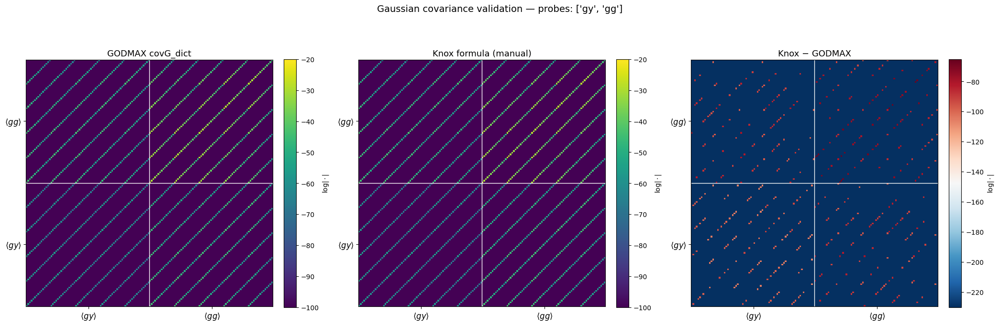

In [25]:
# ── 2. Assembled matrix comparison for a probe list ───────────────────────────
probes_arr = ["gy", "gg"]       # ← change to any probe list

# GODMAX Gaussian-only (from covG_dict)
cov_G_godmax, entries_g, cnt_g, nell_g = diag_utils.build_cov_matrix(
    cov_test.covG_dict, cov_test.Cl_result_dict, probes_arr, warn_missing=False
)

# Independent Knox assembly
cov_G_knox, entries_k, cnt_k, nell_k = build_knox_cov_matrix(
    cov_test.Cl_result_dict, probes_arr, cov_test.fsky_dict
)

diff      = cov_G_knox - cov_G_godmax
rel_diff  = np.abs(diff) / np.maximum(np.abs(cov_G_godmax), 1e-100)

print(f"\nAssembled Gaussian cov  —  probes: {probes_arr}")
print(f"  Shape                 : {cov_G_godmax.shape}")
print(f"  Max |ΔCov|/|Cov_G|   : {rel_diff.max():.3e}")
print(f"  Mean |ΔCov|/|Cov_G|  : {rel_diff.mean():.3e}")
print(f"  Max |ΔCov|            : {np.abs(diff).max():.3e}")

ev_godmax = np.linalg.eigvalsh(cov_G_godmax)
ev_knox   = np.linalg.eigvalsh(cov_G_knox)

print(f"  Min eigval GODMAX     : {ev_godmax.min():.3e}")
print(f"  Max eigval GODMAX     : {ev_godmax.max():.3e}")
print(f"  Min eigval Knox       : {ev_knox.min():.3e}")
print(f"  Max eigval Knox       : {ev_knox.max():.3e}")

# Full eigenvalue table
print(f"\nAll eigenvalues — GODMAX covG_dict vs Knox   (probes: {probes_arr})")
print(f"{'idx':>5}  {'GODMAX':>18}  {'Knox':>18}  {'rel_diff':>12}")
print("-" * 60)
for i, (eg, ek) in enumerate(zip(ev_godmax, ev_knox)):
    rdiff = abs(eg - ek) / max(abs(eg), abs(ek), 1e-100)
    flag  = "  *** NEG" if (eg < 0 or ek < 0) else ""
    print(f"{i:>5}  {eg:>18.6e}  {ek:>18.6e}  {rdiff:>12.3e}{flag}")

print()
print(f"GODMAX  min={ev_godmax.min():.3e}  max={ev_godmax.max():.3e}  "
      f"n_neg={(ev_godmax < 0).sum()}")
print(f"Knox    min={ev_knox.min():.3e}  max={ev_knox.max():.3e}  "
      f"n_neg={(ev_knox < 0).sum()}")
cnum_g = ev_godmax.max() / max(abs(ev_godmax.min()), 1e-100)
cnum_k = ev_knox.max()   / max(abs(ev_knox.min()),   1e-100)
print(f"Condition number GODMAX : {cnum_g:.3e}")
print(f"Condition number Knox   : {cnum_k:.3e}")


# ── 3. Plot: GODMAX G-cov  |  Knox G-cov  |  diff ────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

for ax, mat, title in zip(
    axes,
    [cov_G_godmax,  cov_G_knox,    diff],
    ["GODMAX covG_dict", "Knox formula (manual)", "Knox − GODMAX"]
):
    bounds = diag_utils.get_probe_boundaries(cnt_g, nell_g)
    im = ax.imshow(
        np.log(np.abs(mat) + 1e-100),
        origin="lower",
        cmap="RdBu_r" if "Knox −" in title else "viridis",
        vmin=(None if "Knox −" in title else -100),
        vmax=(None if "Knox −" in title else -20),
    )
    for edge in bounds["edges"][1:-1]:
        ax.axhline(edge - 0.5, color="white", lw=1.0)
        ax.axvline(edge - 0.5, color="white", lw=1.0)
    tick_labels = [diag_utils.PROBE_LATEX.get(p, p) for p in probes_arr]
    ax.set_xticks(bounds["centers"]); ax.set_xticklabels(tick_labels, fontsize=12)
    ax.set_yticks(bounds["centers"]); ax.set_yticklabels(tick_labels, fontsize=12)
    ax.set_xlim(-0.5, mat.shape[1] - 0.5)
    ax.set_ylim(-0.5, mat.shape[0] - 0.5)
    plt.colorbar(im, ax=ax, label=r"$\log|\cdot|$", fraction=0.046, pad=0.04)
    ax.set_title(title, fontsize=13)

fig.suptitle(
    f"Gaussian covariance validation — probes: {probes_arr}",
    fontsize=14, y=1.01
)
fig.tight_layout()
fig.savefig(FIGDIR / f"cov_G_knox_validation_{'_'.join(probes_arr)}.png",
            dpi=200, bbox_inches="tight")
plt.show()


## Testing if clipping actually physically changes the covariance by a huge factor

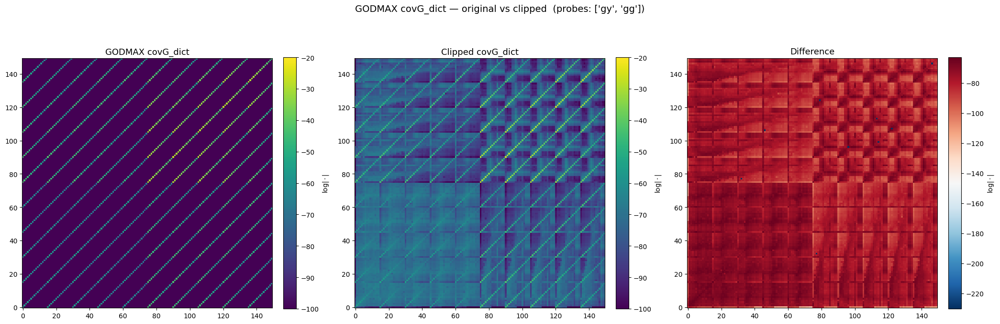

In [27]:
eigvals, eigvecs = np.linalg.eigh(cov_G_godmax)

if np.any(eigvals < 0):
    n_neg = np.sum(eigvals < 0)
    frac = np.abs(eigvals[eigvals < 0]).max() / eigvals.max()
    print(
        f"WARNING: GODMAX covG_dict has {n_neg} negative eigenvalues "
        f"(max |neg| / max eigval = {frac:.3e})"
    )
    eigvals = np.maximum(eigvals, 0.0)

covtot_clipped = eigvecs @ np.diag(eigvals) @ eigvecs.T
diff = covtot_clipped - cov_G_godmax

# plot the covariance matrices
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

mats = [cov_G_godmax, covtot_clipped, diff]
titles = ["GODMAX covG_dict", "Clipped covG_dict", "Difference"]

for ax, mat, title in zip(axes, mats, titles):
    im = ax.imshow(
        np.log(np.abs(mat) + 1e-100),
        origin="lower",
        cmap="RdBu_r" if "Difference" in title else "viridis",
        vmin=(None if "Difference" in title else -100),
        vmax=(None if "Difference" in title else -20),
    )
    plt.colorbar(im, ax=ax, label=r"$\log|\cdot|$", fraction=0.046, pad=0.04)
    ax.set_title(title, fontsize=13)

fig.suptitle(
    f"GODMAX covG_dict — original vs clipped  (probes: {probes_arr})",
    fontsize=14, y=1.01
)
fig.tight_layout()
fig.savefig(
    FIGDIR / f"cov_G_godmax_clipped_comparison_{'_'.join(probes_arr)}.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

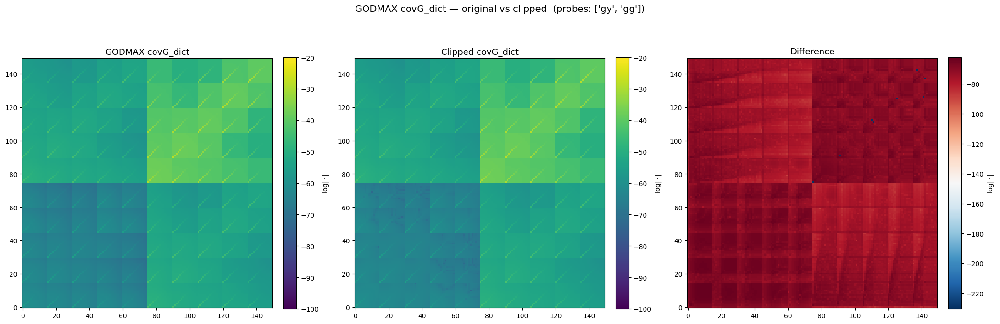

In [28]:
probes_arr = ['gy','gg']          
                                                                                                                                                            
# ── Data vector ───────────────────────────────────────────────────────────────                                                                            
dv, entries, nell = diag_utils.build_data_vector(                                                                                                           
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    key='tot_ellsurvey',       # 'tot_plus_noise_ellsurvey' for signal+noise                                                                                
)                                                                                                                                                           

cov, entries, count_per_probe, nell = diag_utils.build_cov_matrix(                                                                                          
    cov_test.covtot_dict,                                                                                                                                   
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    warn_missing=True,                                                                                                                                      
) 

eigvals, eigvecs = np.linalg.eigh(cov)

if np.any(eigvals < 0):
    n_neg = np.sum(eigvals < 0)
    frac = np.abs(eigvals[eigvals < 0]).max() / eigvals.max()
    print(
        f"WARNING: GODMAX covG_dict has {n_neg} negative eigenvalues "
        f"(max |neg| / max eigval = {frac:.3e})"
    )
    eigvals = np.maximum(eigvals, 0.0)

covtot_clipped = eigvecs @ np.diag(eigvals) @ eigvecs.T
diff = covtot_clipped - cov

# plot the covariance matrices
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

mats = [cov, covtot_clipped, diff]
titles = ["GODMAX covG_dict", "Clipped covG_dict", "Difference"]

for ax, mat, title in zip(axes, mats, titles):
    im = ax.imshow(
        np.log(np.abs(mat) + 1e-100),
        origin="lower",
        cmap="RdBu_r" if "Difference" in title else "viridis",
        vmin=(None if "Difference" in title else -100),
        vmax=(None if "Difference" in title else -20),
    )
    plt.colorbar(im, ax=ax, label=r"$\log|\cdot|$", fraction=0.046, pad=0.04)
    ax.set_title(title, fontsize=13)

fig.suptitle(
    f"GODMAX covG_dict — original vs clipped  (probes: {probes_arr})",
    fontsize=14, y=1.01
)
fig.tight_layout()
fig.savefig(
    FIGDIR / f"cov_tot_clipped_comparison_{'_'.join(probes_arr)}.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()


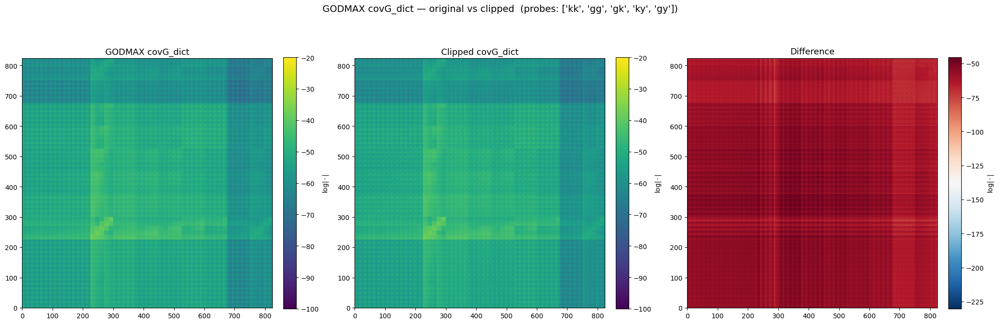

In [33]:
probes_arr = ['gy','gg', 'ky','kk','gk','yy']
probes_arr = ['kk','gg','gk','ky','gy']          
                                                                                                                                                            
# ── Data vector ───────────────────────────────────────────────────────────────                                                                            
dv, entries, nell = diag_utils.build_data_vector(                                                                                                           
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    key='tot_ellsurvey',       # 'tot_plus_noise_ellsurvey' for signal+noise                                                                                
)                                                                                                                                                           

cov, entries, count_per_probe, nell = diag_utils.build_cov_matrix(                                                                                          
    cov_test.covtot_dict,                                                                                                                                   
    cov_test.Cl_result_dict,                                                                                                                                
    probes_arr,                                                                                                                                             
    warn_missing=True,                                                                                                                                      
) 

eigvals, eigvecs = np.linalg.eigh(cov)

if np.any(eigvals < 0):
    n_neg = np.sum(eigvals < 0)
    frac = np.abs(eigvals[eigvals < 0]).max() / eigvals.max()
    print(
        f"WARNING: GODMAX covG_dict has {n_neg} negative eigenvalues "
        f"(max |neg| / max eigval = {frac:.3e})"
    )
    eigvals = np.maximum(eigvals, 0.0)

covtot_clipped = eigvecs @ np.diag(eigvals) @ eigvecs.T
diff = covtot_clipped - cov

# plot the covariance matrices
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

mats = [cov, covtot_clipped, diff]
titles = ["GODMAX covG_dict", "Clipped covG_dict", "Difference"]

for ax, mat, title in zip(axes, mats, titles):
    im = ax.imshow(
        np.log(np.abs(mat) + 1e-100),
        origin="lower",
        cmap="RdBu_r" if "Difference" in title else "viridis",
        vmin=(None if "Difference" in title else -100),
        vmax=(None if "Difference" in title else -20),
    )
    plt.colorbar(im, ax=ax, label=r"$\log|\cdot|$", fraction=0.046, pad=0.04)
    ax.set_title(title, fontsize=13)

fig.suptitle(
    f"GODMAX covG_dict — original vs clipped  (probes: {probes_arr})",
    fontsize=14, y=1.01
)
fig.tight_layout()
fig.savefig(
    FIGDIR / f"cov_tot_clipped_comparison_{'_'.join(probes_arr)}.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()


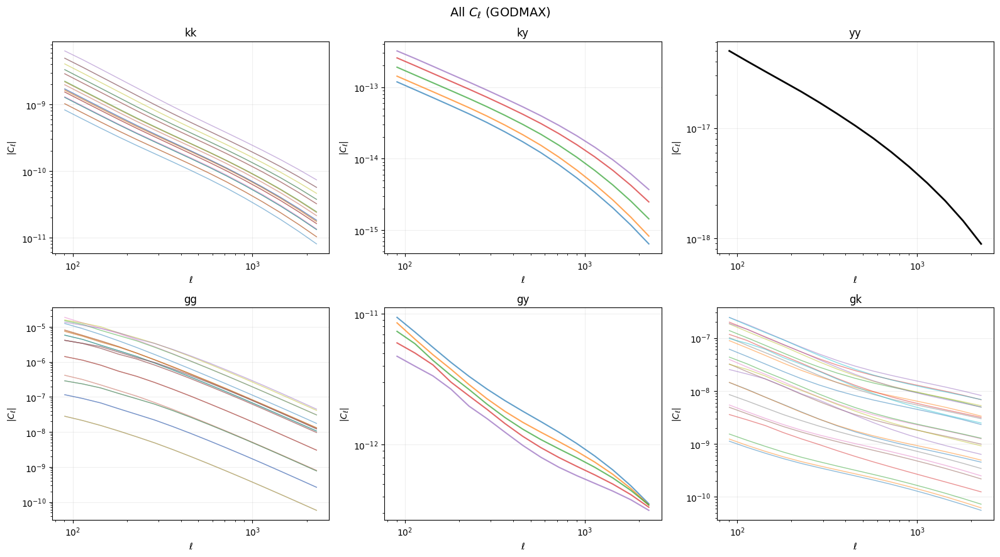

In [37]:
ell = np.array(Cls_test.ell_array) 

Cls_dict = {
    'kk': np.array(Cls_test.Cl_kappa_kappa_tot_mat),   # (nell, nb, nb)
    'ky': np.array(Cls_test.Cl_kappa_y_tot_mat),       # (nell, nb)
    'yy': np.array(Cls_test.Cl_y_y_signal_mat),        # (nell,)
    'gg': np.array(Cls_test.Cl_gal_gal_tot_mat),       # (nell, nb_l, nb_l)
    'gy': np.array(Cls_test.Cl_gal_y_tot_mat),         # (nell, nb_l)
    'gk': np.array(Cls_test.Cl_gal_kappa_tot_mat),     # (nell, nb_l, nb)
}

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes = axes.flatten()

for ax, (probe, Cl) in zip(axes, Cls_dict.items()):

    # ---- case 1: auto (matrix) ----
    if Cl.ndim == 3:
        nb1, nb2 = Cl.shape[1], Cl.shape[2]

        for i in range(nb1):
            for j in range(nb2):
                ax.plot(
                    ell,
                    np.abs(Cl[:, i, j]),
                    lw=1,
                    alpha=0.5,
                )

    # ---- case 2: cross (vector) ----
    elif Cl.ndim == 2:
        nb = Cl.shape[1]
        for i in range(nb):
            ax.plot(
                ell,
                np.abs(Cl[:, i]),
                lw=1.5,
                alpha=0.7,
            )

    # ---- case 3: scalar ----
    elif Cl.ndim == 1:
        ax.plot(
            ell,
            np.abs(Cl),
            lw=2,
            color='black',
        )

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(probe, fontsize=12)
    ax.set_xlabel(r'$\ell$')
    ax.set_ylabel(r'$|C_\ell|$')
    ax.grid(alpha=0.2)

fig.suptitle("All $C_\\ell$ (GODMAX)", fontsize=14)
fig.tight_layout()
#fix the path of fig saving
fig.savefig(FIGDIR / "all_cls_overview.png", dpi=200, bbox_inches="tight")
# fig.savefig(FIGDIR + "all_cls_overview.png", dpi=200, bbox_inches="tight")
plt.show()

## testing other cov regularisation

## Regularisation strategies implemented

| Strategy | Implemented as | Mathematical form in eigenvalue space | Main idea / effect |
|---|---|---|---|
| original | `eigvals_raw.copy()` | $\lambda_i^{\mathrm{reg}} = \lambda_i$ | No regularisation; baseline raw covariance |
| clip neg→0 | `np.maximum(eigvals_raw, 0.0)` | $\lambda_i^{\mathrm{reg}} = \max(\lambda_i, 0)$ | Removes negative modes; enforces positive semidefiniteness, but can leave zero modes and make the matrix singular |
| clip $\varepsilon=10^{-10}$ | `np.maximum(eigvals_raw, eps_floor * lam_max)` | $\lambda_i^{\mathrm{reg}} = \max(\lambda_i, \varepsilon \lambda_{\max})$ | Floors all eigenvalues to a tiny positive threshold; avoids exact singularity |
| diag shift | `eigvals_raw + np.abs(lam_min)` | $\lambda_i^{\mathrm{reg}} = \lambda_i + |\lambda_{\min}|$ | Uniform diagonal shift large enough to bring the most negative eigenvalue to zero |
| diag shift ×1.1 | `eigvals_raw + 1.1 * np.abs(lam_min)` | $\lambda_i^{\mathrm{reg}} = \lambda_i + 1.1\,|\lambda_{\min}|$ | Slightly stronger version of diagonal shift; adds a safety margin beyond the PSD boundary |
| cond cap $10^{12}$ | `np.maximum(eigvals_raw, lam_max / kappa_cap)` | $\lambda_i^{\mathrm{reg}} = \max(\lambda_i, \lambda_{\max}/\kappa_{\mathrm{cap}})$ | Controls the condition number by imposing a minimum eigenvalue consistent with a target maximum condition number |
| noise floor $\varepsilon=1\%$ | `eigvals_raw + 0.01 * sigma2_mean` | $\lambda_i^{\mathrm{reg}} = \lambda_i + 0.01\,\langle \sigma^2 \rangle$ | Adds an isotropic noise floor equal to 1% of the mean diagonal variance |
| noise floor $\varepsilon=5\%$ | `eigvals_raw + 0.05 * sigma2_mean` | $\lambda_i^{\mathrm{reg}} = \lambda_i + 0.05\,\langle \sigma^2 \rangle$ | Stronger isotropic noise floor; more stabilising but more distortive |
| LW shrink $\alpha=0.01$ | `(1.0 - 0.01) * eigvals_raw + 0.01 * mu_lw` | $\lambda_i^{\mathrm{reg}} = (1-\alpha)\lambda_i + \alpha \mu_{\mathrm{LW}}$ with $\alpha=0.01$ | Ledoit–Wolf-style shrinkage toward an identity target with average eigenvalue $\mu_{\mathrm{LW}}$ |
| LW shrink $\alpha=0.05$ | `(1.0 - 0.05) * eigvals_raw + 0.05 * mu_lw` | $\lambda_i^{\mathrm{reg}} = (1-\alpha)\lambda_i + \alpha \mu_{\mathrm{LW}}$ with $\alpha=0.05$ | Stronger shrinkage toward the identity target |


----------------------------------------------

### Definitions

- $\lambda_i$: eigenvalues of the raw covariance matrix
- $\lambda_{\min}$: minimum eigenvalue of the raw covariance
- $\lambda_{\max}$: maximum eigenvalue of the raw covariance
- $\langle \sigma^2 \rangle = \mathrm{mean}(\mathrm{diag}(C))$: mean diagonal variance
- $\kappa_{\mathrm{cap}}$: imposed maximum condition number
- $\mu_{\mathrm{LW}} = \mathrm{Tr}(C)/n$: average eigenvalue, i.e. the Ledoit–Wolf identity target

----------------------------------------------------

$C_{\mathrm{reg}} = V \,\mathrm{diag}(\lambda_i^{\mathrm{reg}})\, V^T$

---------------------------------------------------

## Quality checks performed

| Check | Where implemented | Quantity computed | Mathematical form | What it tells you |
|---|---|---|---|---|
| Minimum eigenvalue | `compare_regularizations` | Smallest eigenvalue after regularisation | $\lambda_{\min}^{\mathrm{reg}} = \min_i \lambda_i^{\mathrm{reg}}$ | Whether the covariance is still indefinite or has been pushed into PSD territory |
| Maximum eigenvalue | `compare_regularizations` | Largest eigenvalue after regularisation | $\lambda_{\max}^{\mathrm{reg}} = \max_i \lambda_i^{\mathrm{reg}}$ | Overall scale of the covariance spectrum |
| Number of negative eigenvalues | `compare_regularizations`, `plot_regularisation_sweep` | Count of negative modes | $N_{\mathrm{neg}} = \sum_i \mathbf{1}(\lambda_i^{\mathrm{reg}} < 0)$ | Whether the covariance is indefinite; PSD requires this to be zero |
| Condition number | `compare_regularizations`, `plot_regularisation_sweep` | Spectral condition number | $\kappa = \lambda_{\max}^{\mathrm{reg}} / \lambda_{\min}^{\mathrm{reg}}$ for $\lambda_{\min}^{\mathrm{reg}} > 0$ | Numerical stability of inversion; large values indicate ill-conditioning |
| Relative covariance perturbation | `compare_regularizations` | Frobenius-norm change relative to raw covariance | $\| \Delta C \|_F / \| C \|_F$, with $\Delta C = C_{\mathrm{reg}} - C_{\mathrm{raw}}$ | How strongly the regularisation changes the covariance matrix |
| Log-determinant shift | `assess_cov_quality` | Shift in log determinant relative to raw covariance | $\Delta \ln|C| = \sum_i \ln \lambda_i^{\mathrm{reg}} - \sum_i \ln \lambda_i^{\mathrm{raw},+}$ | Change in Gaussian likelihood normalisation |
| Inverse residual | `assess_cov_quality` | Accuracy of the constructed inverse | $\| C_{\mathrm{reg}} C_{\mathrm{reg}}^{-1} - I \|_F / n$ | Whether the inverse is numerically consistent with the covariance |
| Data S/N ratio | `assess_cov_quality` | Relative signal-to-noise under regularised inverse | $\dfrac{d^T C_{\mathrm{reg}}^{-1} d}{d^T C_{\mathrm{raw}}^{-1} d}$ | How the weighting of the data vector changes under regularisation |
| Mock $\chi^2$ median | `assess_cov_quality`, `plot_regularisation_sweep` | Median mock chi-square per degree of freedom | $\mathrm{median}(\chi^2_{\mathrm{mock}})/n$, with $\chi^2 = x^T C_{\mathrm{reg}}^{-1} x$ | Whether the regularised covariance gives approximately unbiased chi-square behaviour |
| Mock $\chi^2$ 95th percentile | `assess_cov_quality` | Upper-tail chi-square per degree of freedom | $\chi^2_{95\%}/n$ | Whether the tails are too compressed or too broad relative to the expected $\chi^2$ distribution |
| Correlation-structure difference | `compare_regularizations`, `assess_cov_quality` | Difference in correlation matrix relative to raw covariance | $\| \mathrm{corr}(C_{\mathrm{reg}}) - \mathrm{corr}(C_{\mathrm{raw}}) \|_F / n$ | Whether regularisation changes only amplitudes or also the correlation structure |
| PSD threshold in noise-floor sweep | `plot_regularisation_sweep` | Smallest $\varepsilon$ such that no negative eigenvalues remain | First $\varepsilon$ such that $N_{\mathrm{neg}} = 0$ | Minimum isotropic floor needed for PSD |
| “Unbiased” $\chi^2$ threshold in sweep | `plot_regularisation_sweep` | Smallest $\varepsilon$ such that mock median $\chi^2/n$ matches target | First $\varepsilon$ such that $\chi^2_{\mathrm{med}}/n \leq 1.005 \times \chi^2_{\mathrm{target}}/n$ | Smallest noise floor giving approximately acceptable inference calibration |

------------------------------------------------------------

### Definitions

- $C_{\mathrm{raw}}$: raw covariance matrix
- $C_{\mathrm{reg}}$: regularised covariance matrix
- $\lambda_i$: eigenvalues of $C_{\mathrm{raw}}$
- $\lambda_i^{\mathrm{reg}}$: eigenvalues after regularisation
- $\lambda_{\min}, \lambda_{\max}$: minimum and maximum eigenvalues
- $\| \cdot \|_F$: Frobenius norm
- $d$: data vector
- $\mathrm{corr}(C)$: correlation matrix associated with covariance $C$
- $n$: dimension of the data vector / covariance
- $\mu_{\mathrm{LW}} = \mathrm{Tr}(C)/n$: average eigenvalue used as the Ledoit–Wolf target
- $\langle \sigma^2 \rangle = \mathrm{mean}(\mathrm{diag}(C))$: mean diagonal variance



  probes : ['gy', 'gg']
  shape  : (150, 150)   nell=15
  λ_min=-6.783e-27  λ_max=5.216e-13  n_neg=7
  mean diag = 1.598e-14   LW target μ = 1.598e-14

Strategy                         λ_min         λ_max          cond   n_neg    ||ΔC||/||C||
--------------------------------------------------------------------------------------------
original                    -6.783e-27     5.216e-13             ∞       7       2.635e-15
clip neg→0                   0.000e+00     5.216e-13             ∞       0       9.004e-15
clip ε=1e-10                 5.216e-23     5.216e-13      1.00e+10       0       5.671e-10
diag shift                   0.000e+00     5.216e-13             ∞       0       1.050e-13
diag shift ×1.1              6.783e-28     5.216e-13      7.69e+14       0       1.154e-13
cond cap 1e+12               5.216e-25     5.216e-13      1.00e+12       0       5.041e-12
noise floor ε=1%             1.598e-16     5.218e-13      3.27e+03       0       2.469e-03
noise floor ε=5%          

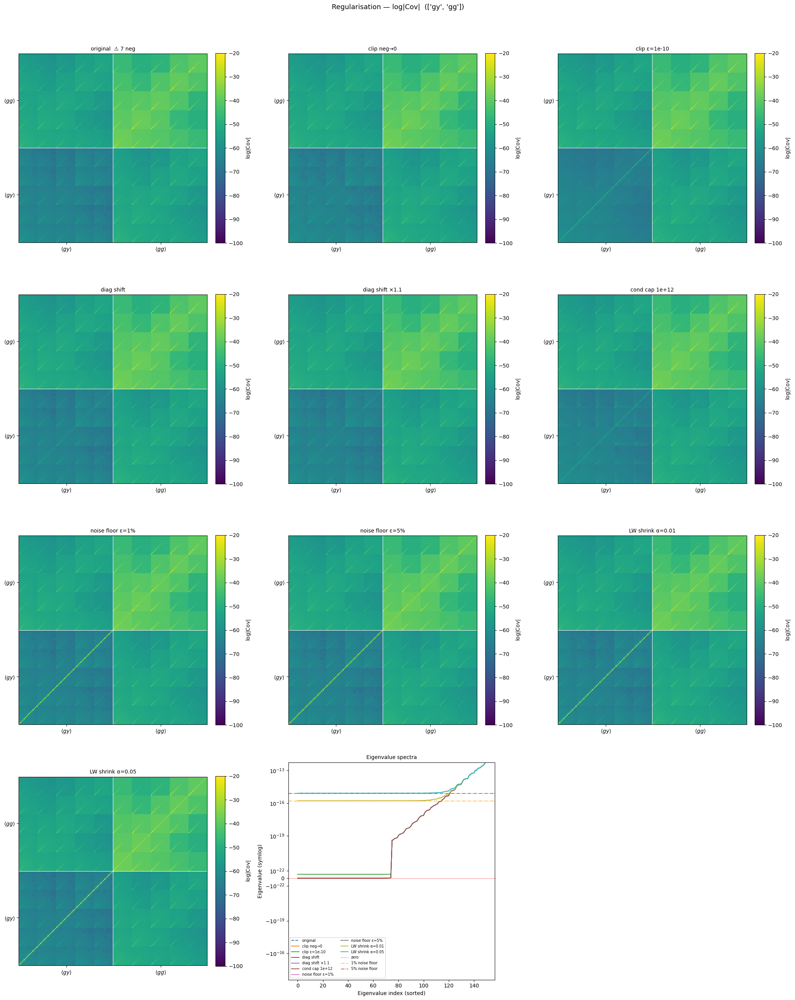

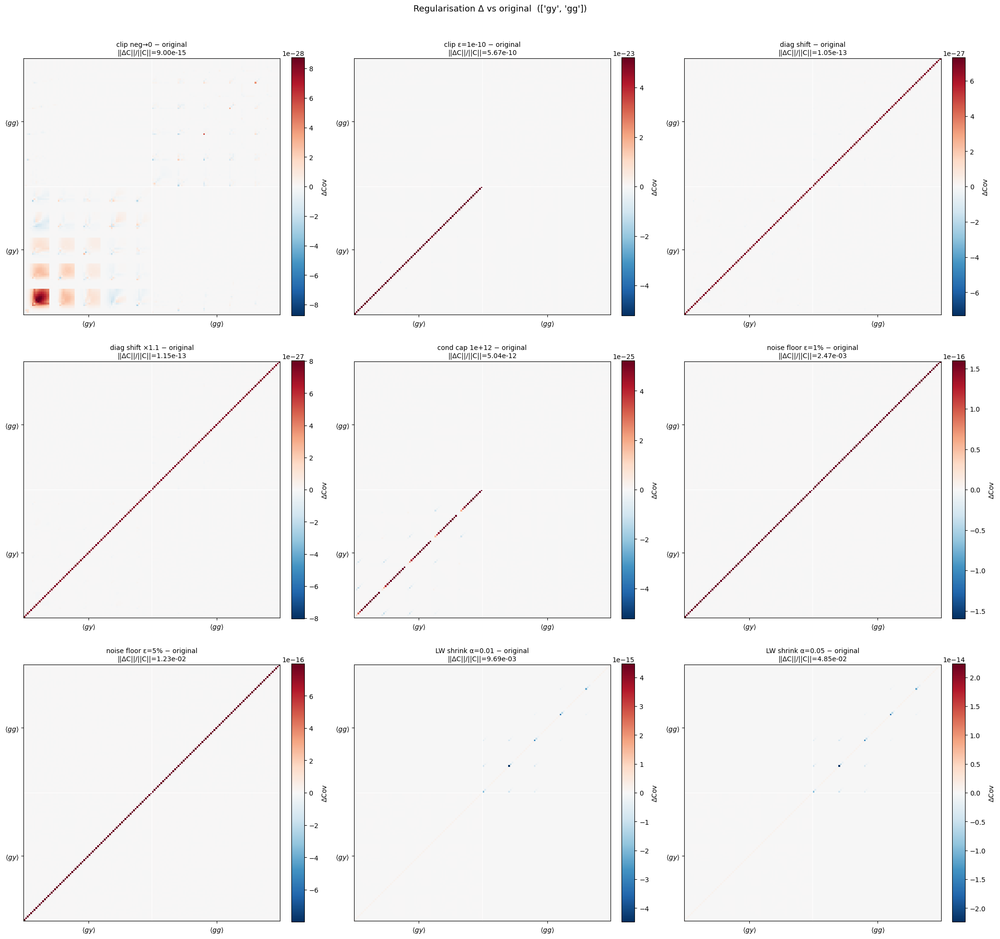

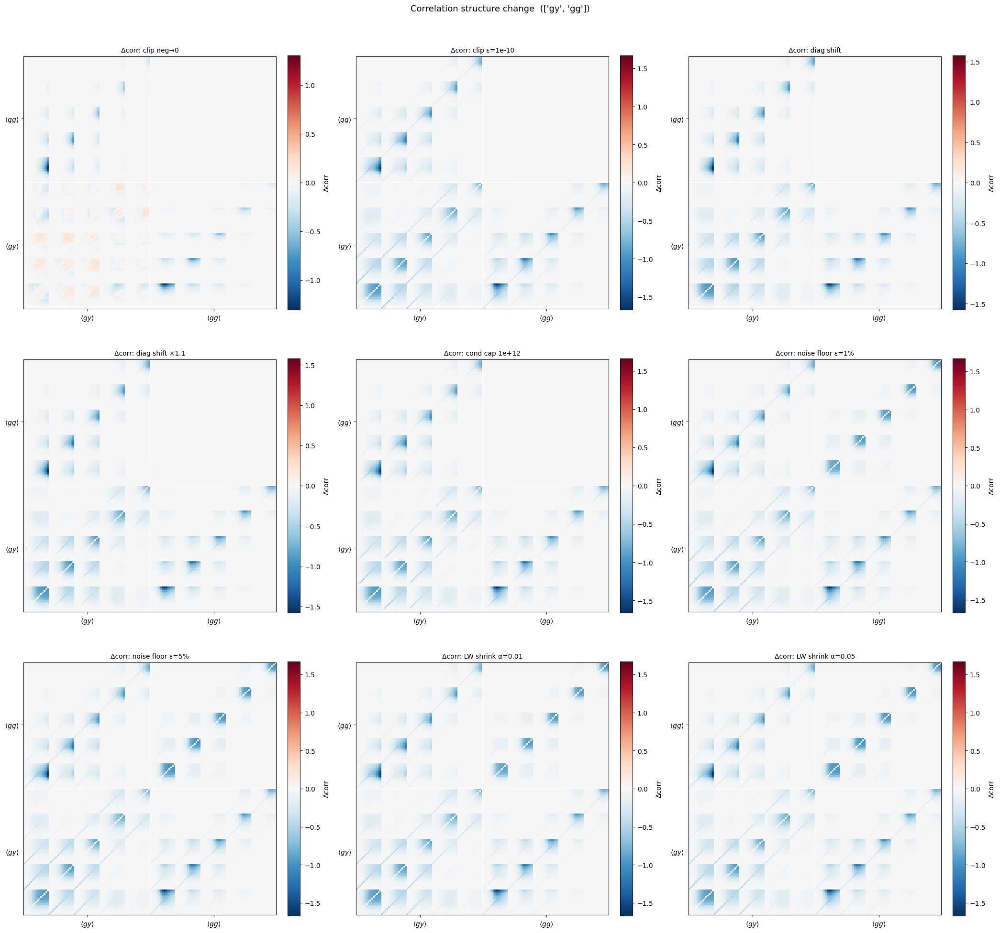


  Inference quality — probes: ['gy', 'gg']   ndof=150
  χ²(150) reference: median/ndof=0.9956  95th/ndof=1.1972
Strategy                     Δln|C|    inv_res   S/N ratio    χ²_med/n     χ²_95/n    Δcorr/n
-------------------------------------------------------------------------------------------------
original                       0.00  4.338e-02      1.0000      1.1532      1.3845  4.5333e-02
clip neg→0                     0.00  4.089e-02      1.0000      1.1532      1.3845  5.9299e-02
clip ε=1e-10                 320.09  5.817e-08      0.8272      0.4933      0.6429  1.4058e-01
diag shift                  -189.59  6.672e-03      0.9747      0.9964      1.1924  1.2620e-01
diag shift ×1.1             -247.85  5.805e-03      0.9706      0.9689      1.1593  1.2678e-01
cond cap 1e+12               -15.76  5.480e-06      0.8318      0.5921      0.7491  1.3840e-01
noise floor ε=1%            1614.60  1.913e-14      0.2140      0.2358      0.3322  1.6042e-01
noise floor ε=5%            18

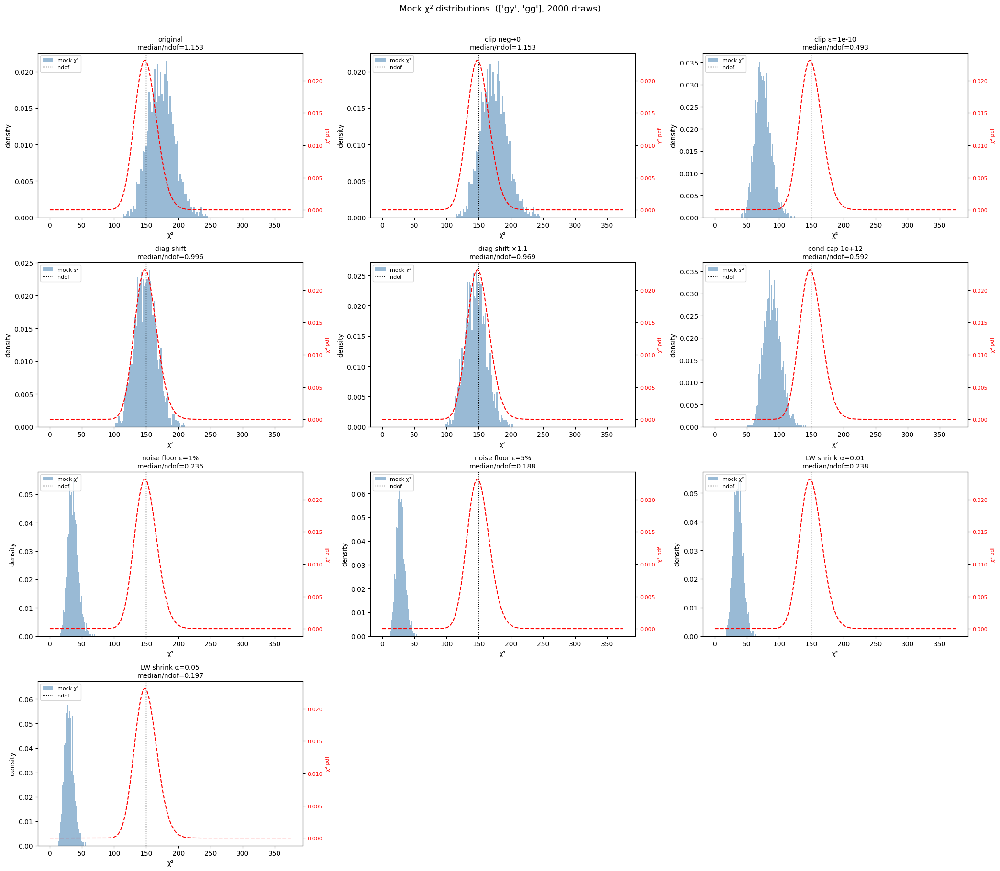

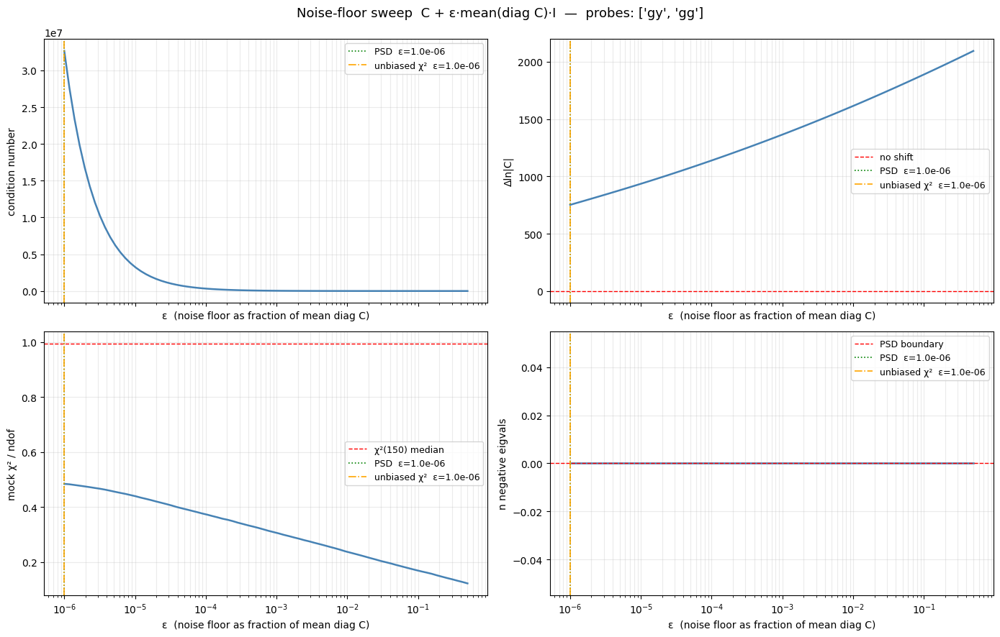


  PSD threshold  : ε = 1.00e-06  →  λ = 1.598e-20
  Unbiased χ²   : ε = 1.00e-06  →  λ = 1.598e-20
  Saved → /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots/cov_reg_sweep_gy_gg.png

  probes : ['ky', 'gy']
  shape  : (150, 150)   nell=15
  λ_min=-7.495e-30  λ_max=5.536e-24  n_neg=8
  mean diag = 1.361e-25   LW target μ = 1.361e-25

Strategy                         λ_min         λ_max          cond   n_neg    ||ΔC||/||C||
--------------------------------------------------------------------------------------------
original                    -7.495e-30     5.536e-24             ∞       8       1.689e-15
clip neg→0                   0.000e+00     5.536e-24             ∞       0       1.012e-06
clip ε=1e-10                 5.536e-34     5.536e-24      1.00e+10       0       1.012e-06
diag shift                   0.000e+00     5.536e-24             ∞       0       1.238e-05
diag shift ×1.1              7.495e-31     5.536e-24      7.39e+06       0       1.362e-05


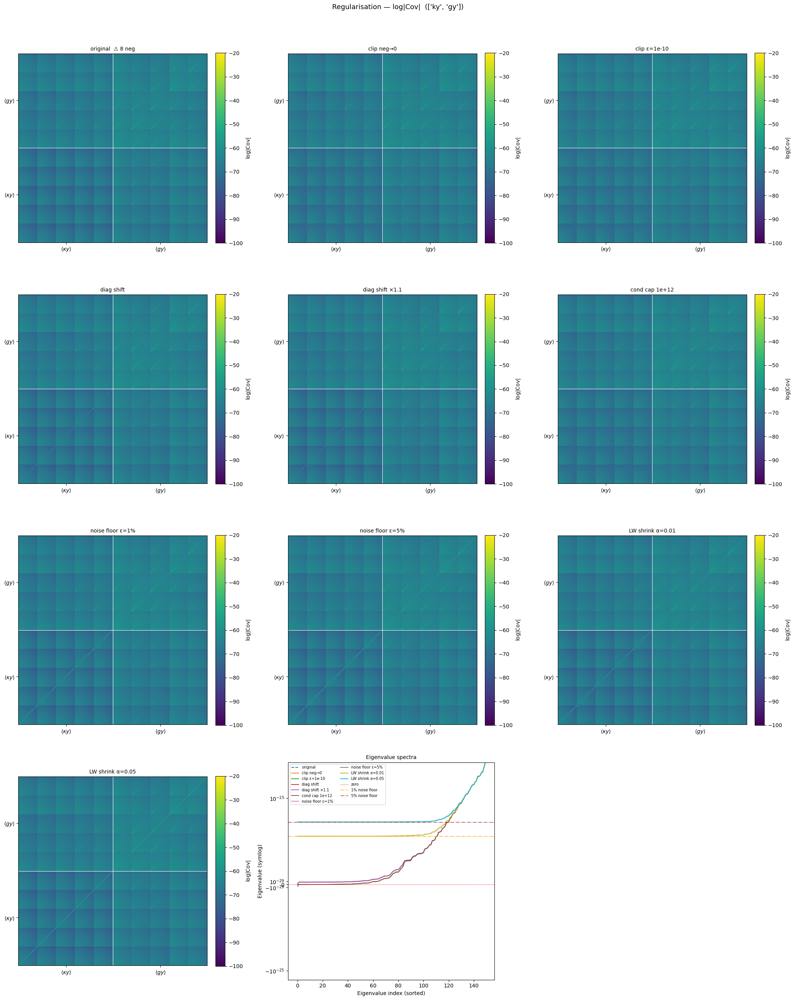

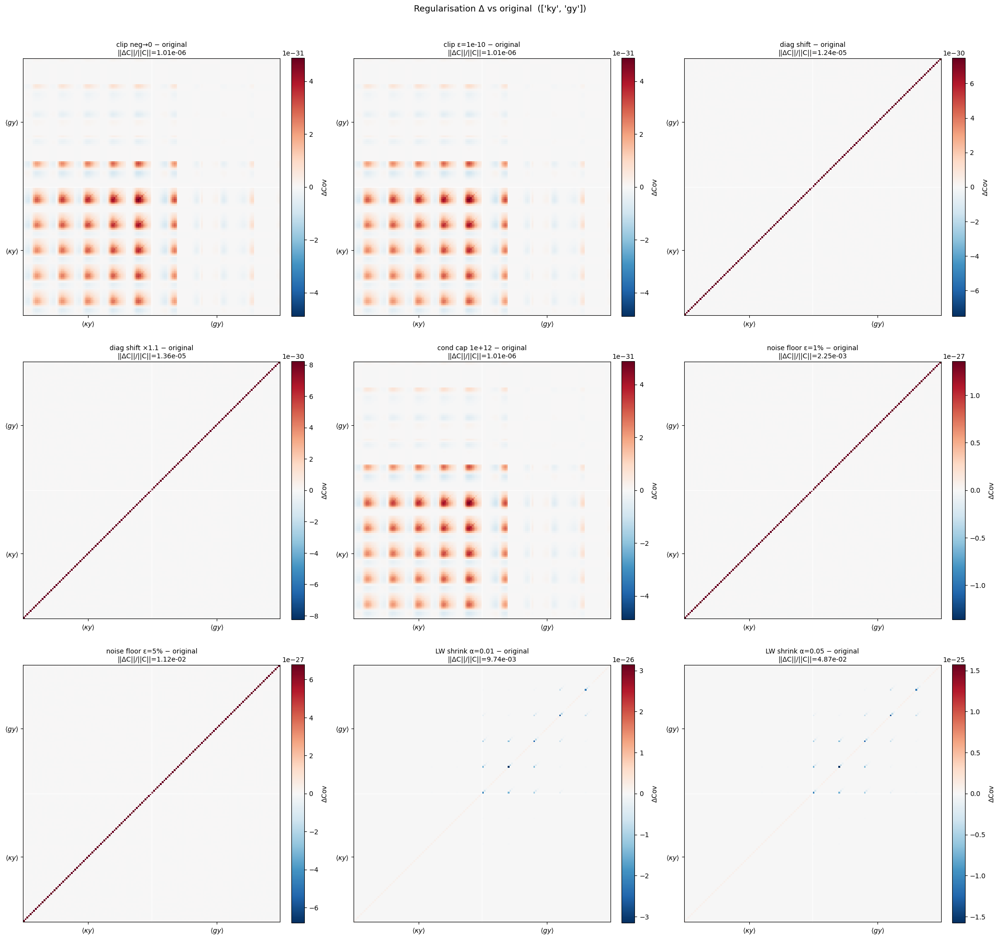

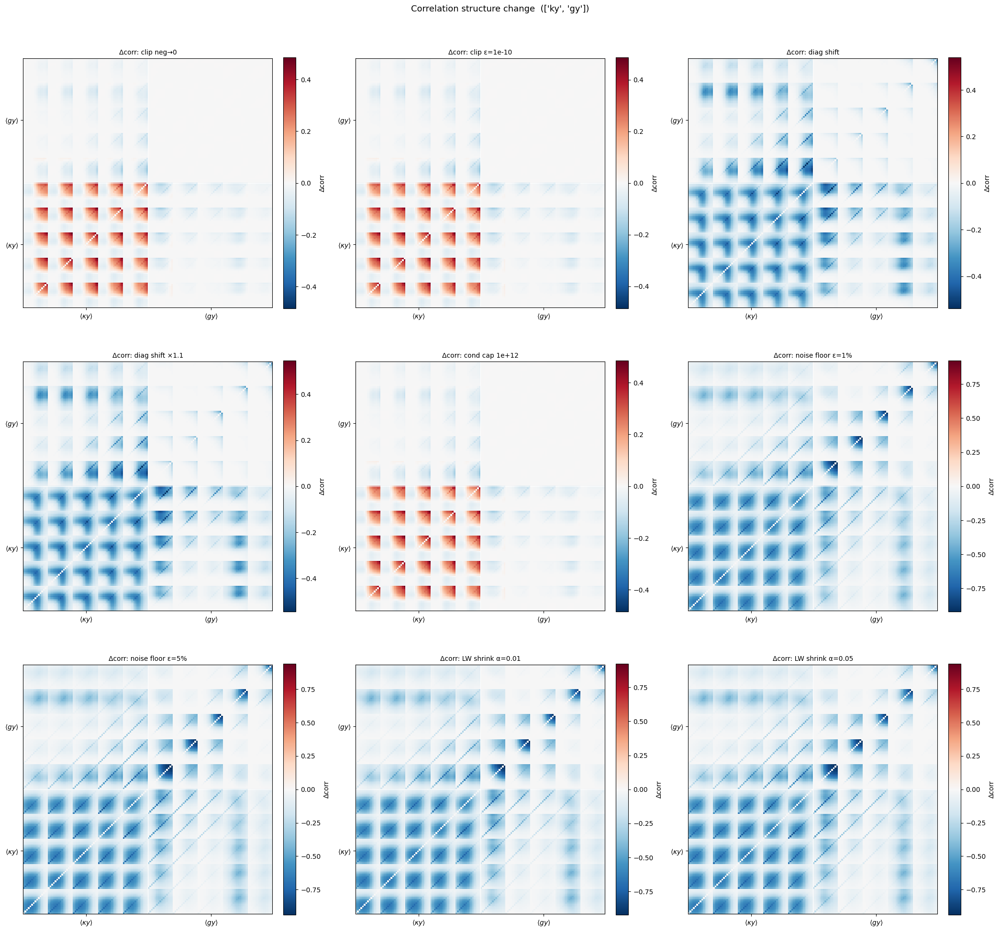


  Inference quality — probes: ['ky', 'gy']   ndof=150
  χ²(150) reference: median/ndof=0.9956  95th/ndof=1.1972
Strategy                     Δln|C|    inv_res   S/N ratio    χ²_med/n     χ²_95/n    Δcorr/n
-------------------------------------------------------------------------------------------------
original                       0.00  9.030e+05      1.0000  5752745.3023  12802495.4368  1.5091e-10
clip neg→0                     0.00  1.886e-02      1.0000  5752745.3023  12802495.4368  6.1941e-02
clip ε=1e-10                -612.61  5.916e-09      0.0001    615.6394   1317.8830  6.1832e-02
diag shift                  -303.16  6.667e-03      0.8922   4608.7804  35765.9348  1.2638e-01
diag shift ×1.1             -366.81  2.478e-12      0.0000      0.9598      1.1461  1.2858e-01
cond cap 1e+12              -649.45  5.906e-07      0.0100  57595.5478  128064.3976  6.1940e-02
noise floor ε=1%              82.86  1.916e-14      0.0000      0.2698      0.3672  2.2186e-01
noise floor ε=5%   

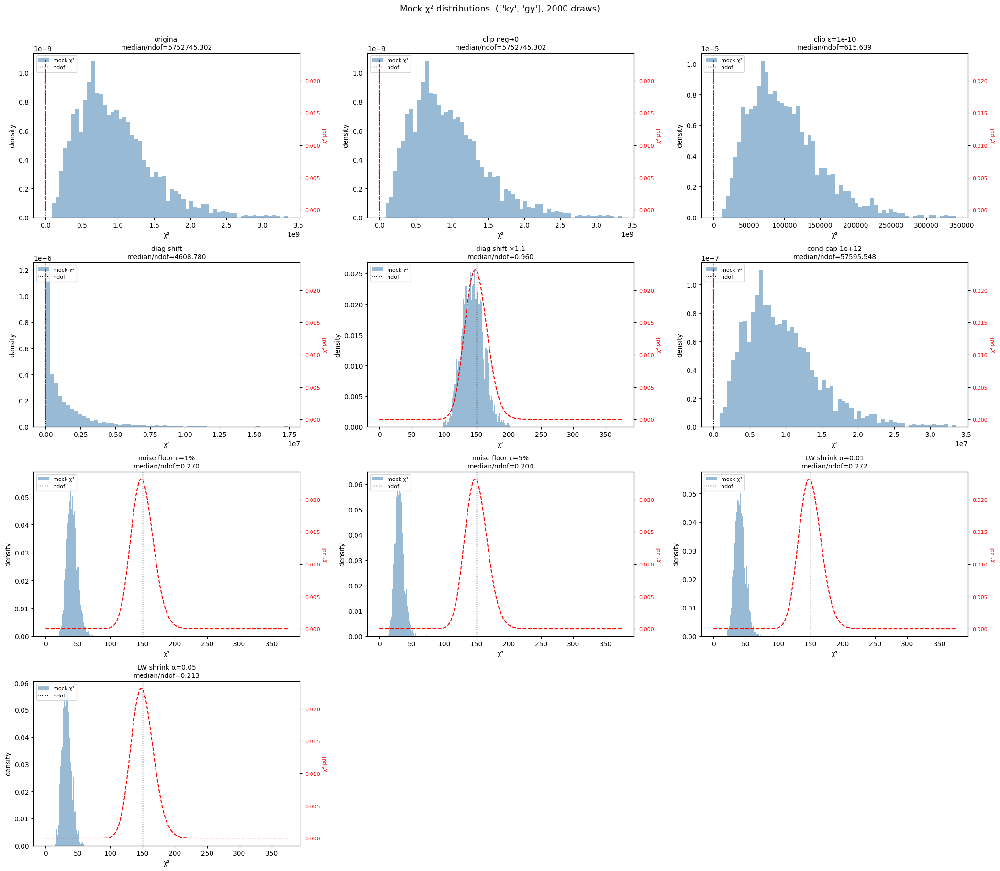

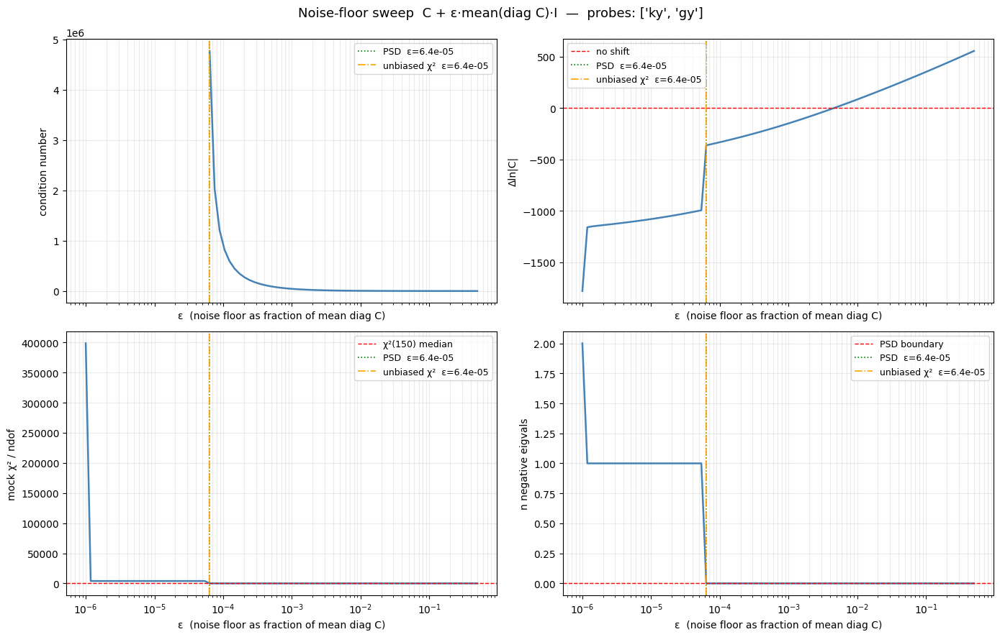


  PSD threshold  : ε = 6.36e-05  →  λ = 8.655e-30
  Unbiased χ²   : ε = 6.36e-05  →  λ = 8.655e-30
  Saved → /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots/cov_reg_sweep_ky_gy.png

  probes : ['ky', 'kk']
  shape  : (300, 300)   nell=15
  λ_min=7.945e-33  λ_max=2.010e-19  n_neg=0
  mean diag = 1.887e-21   LW target μ = 1.887e-21

Strategy                         λ_min         λ_max          cond   n_neg    ||ΔC||/||C||
--------------------------------------------------------------------------------------------
original                     7.945e-33     2.010e-19      2.53e+13       0       3.912e-15
clip neg→0                   7.945e-33     2.010e-19      2.53e+13       0       3.912e-15
clip ε=1e-10                 2.010e-29     2.010e-19      1.00e+10       0       6.091e-10
diag shift                   1.589e-32     2.010e-19      1.26e+13       0       6.193e-13
diag shift ×1.1              1.669e-32     2.010e-19      1.20e+13       0       6.813e-13
c

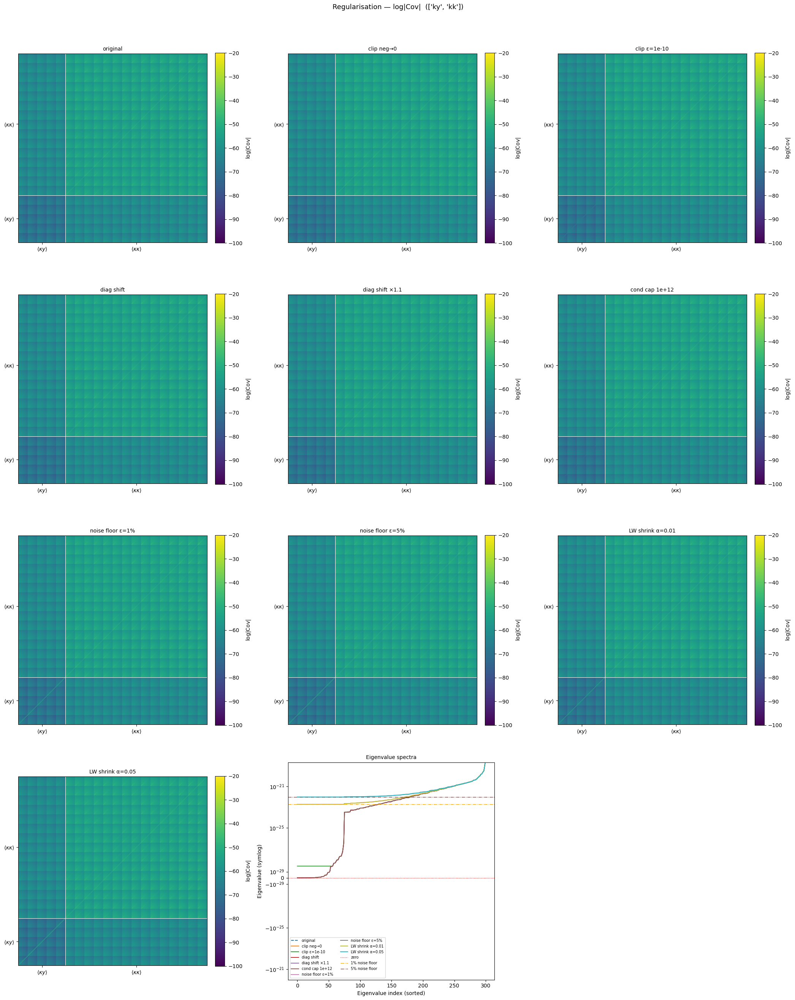

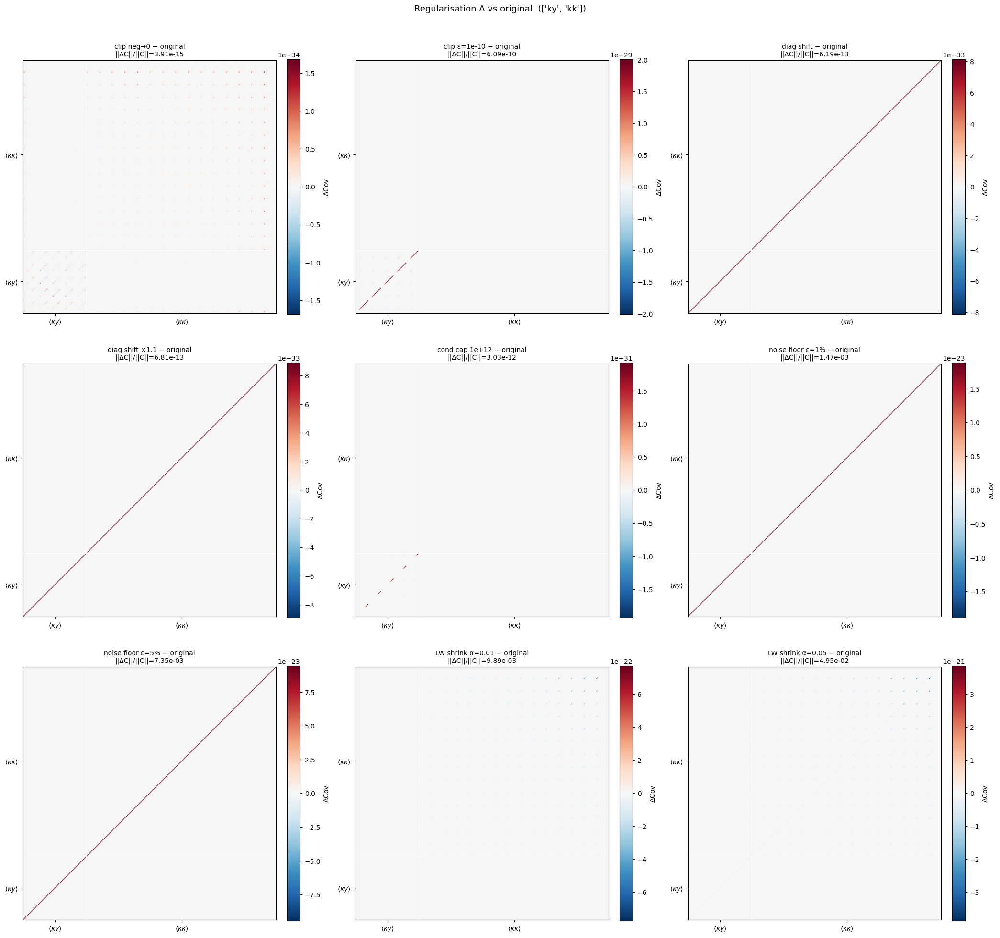

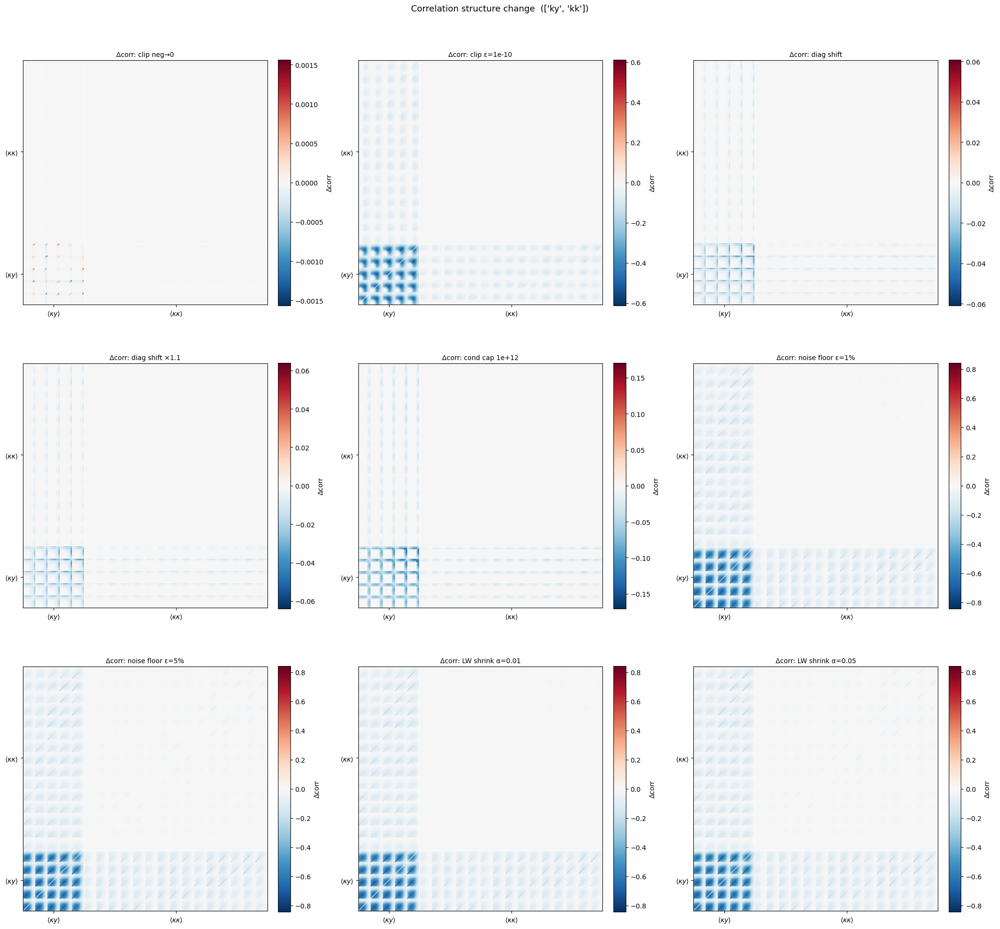


  Inference quality — probes: ['ky', 'kk']   ndof=300
  χ²(300) reference: median/ndof=0.9978  95th/ndof=1.1380
Strategy                     Δln|C|    inv_res   S/N ratio    χ²_med/n     χ²_95/n    Δcorr/n
-------------------------------------------------------------------------------------------------
original                       0.00  8.655e-06      1.0000      1.0014      1.1401  2.5954e-05
clip neg→0                     0.00  8.655e-06      1.0000      1.0014      1.1401  2.5954e-05
clip ε=1e-10                 216.14  1.342e-08      0.9510      0.8358      0.9682  6.0735e-02
diag shift                     5.92  4.482e-06      0.9947      0.9841      1.1228  2.9444e-03
diag shift ×1.1                6.40  4.283e-06      0.9943      0.9831      1.1216  3.1444e-03
cond cap 1e+12                33.70  5.872e-07      0.9854      0.9525      1.0878  1.1801e-02
noise floor ε=1%            1308.73  2.511e-14      0.6759      0.5491      0.6469  9.9718e-02
noise floor ε=5%            15

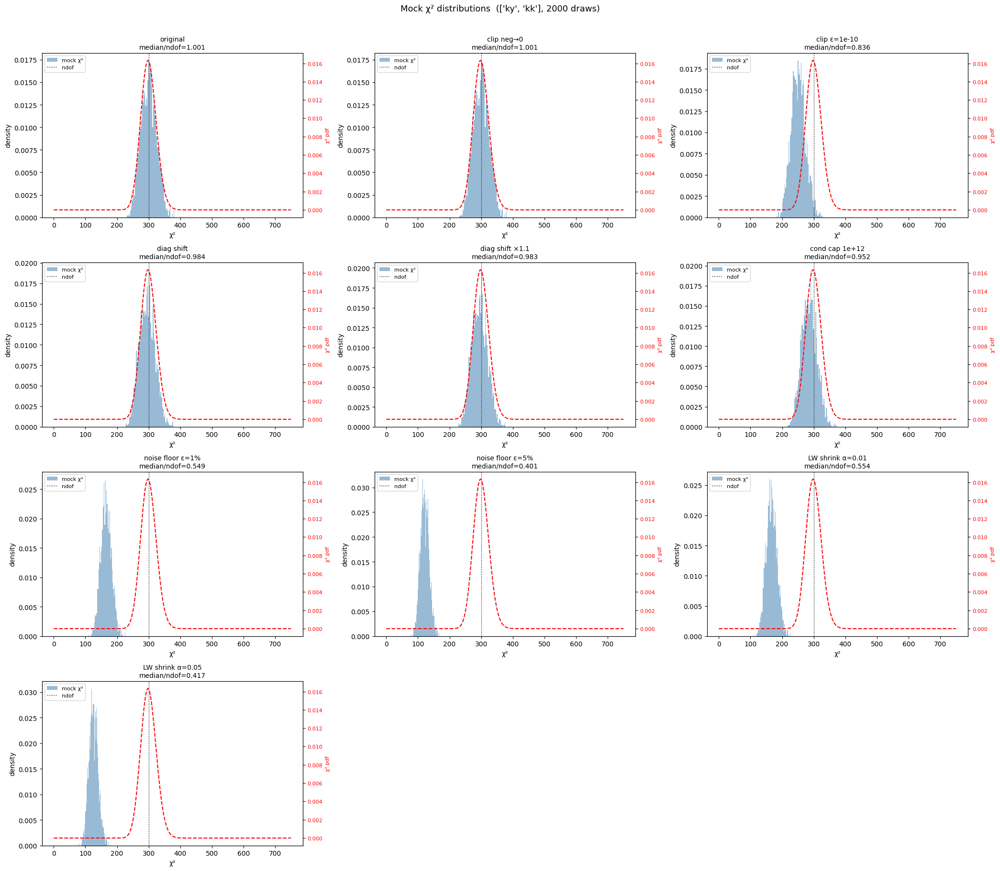

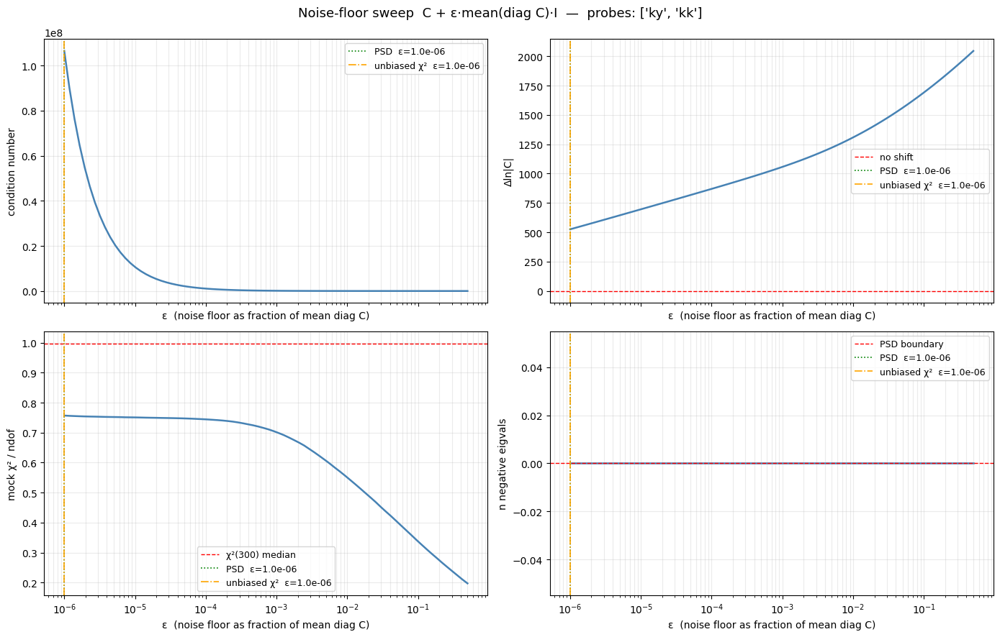


  PSD threshold  : ε = 1.00e-06  →  λ = 1.887e-27
  Unbiased χ²   : ε = 1.00e-06  →  λ = 1.887e-27
  Saved → /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots/cov_reg_sweep_ky_kk.png

  probes : ['ky', 'gy', 'gg', 'gk']
  shape  : (600, 600)   nell=15
  λ_min=-1.782e-19  λ_max=5.219e-13  n_neg=32
  mean diag = 3.998e-15   LW target μ = 3.998e-15

Strategy                         λ_min         λ_max          cond   n_neg    ||ΔC||/||C||
--------------------------------------------------------------------------------------------
original                    -1.782e-19     5.219e-13             ∞      32       2.260e-15
clip neg→0                   0.000e+00     5.219e-13             ∞       0       2.256e-07
clip ε=1e-10                 5.219e-23     5.219e-13      1.00e+10       0       2.257e-07
diag shift                   0.000e+00     5.219e-13             ∞       0       5.504e-06
diag shift ×1.1              1.782e-20     5.219e-13      2.93e+07       0    

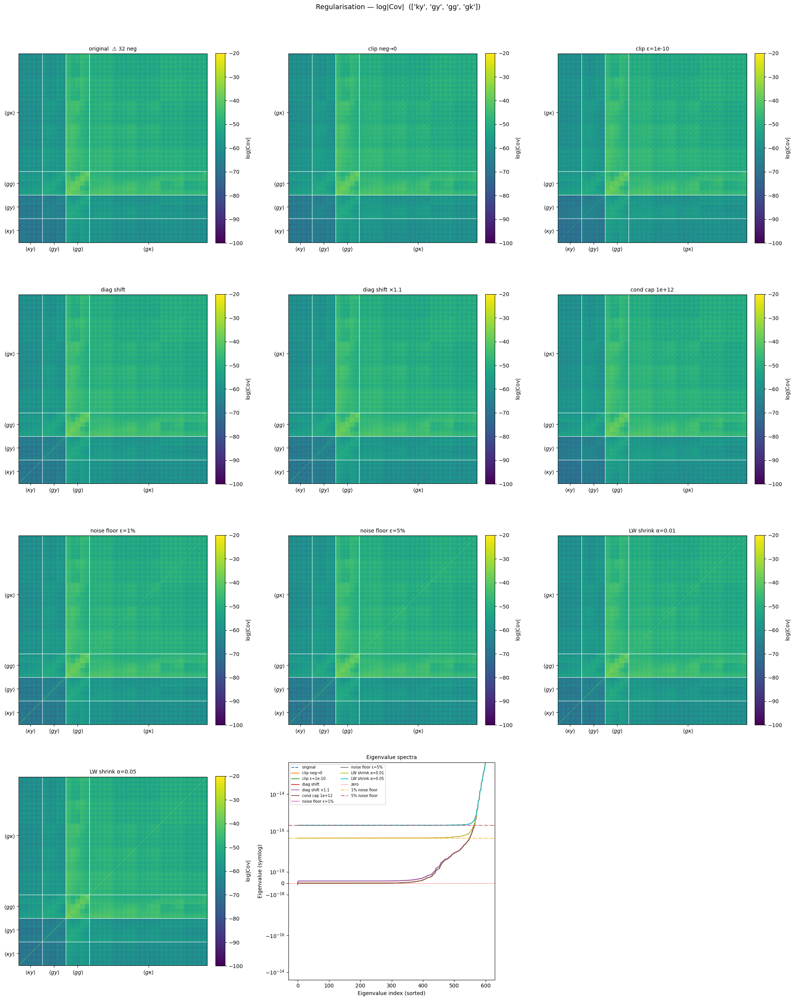

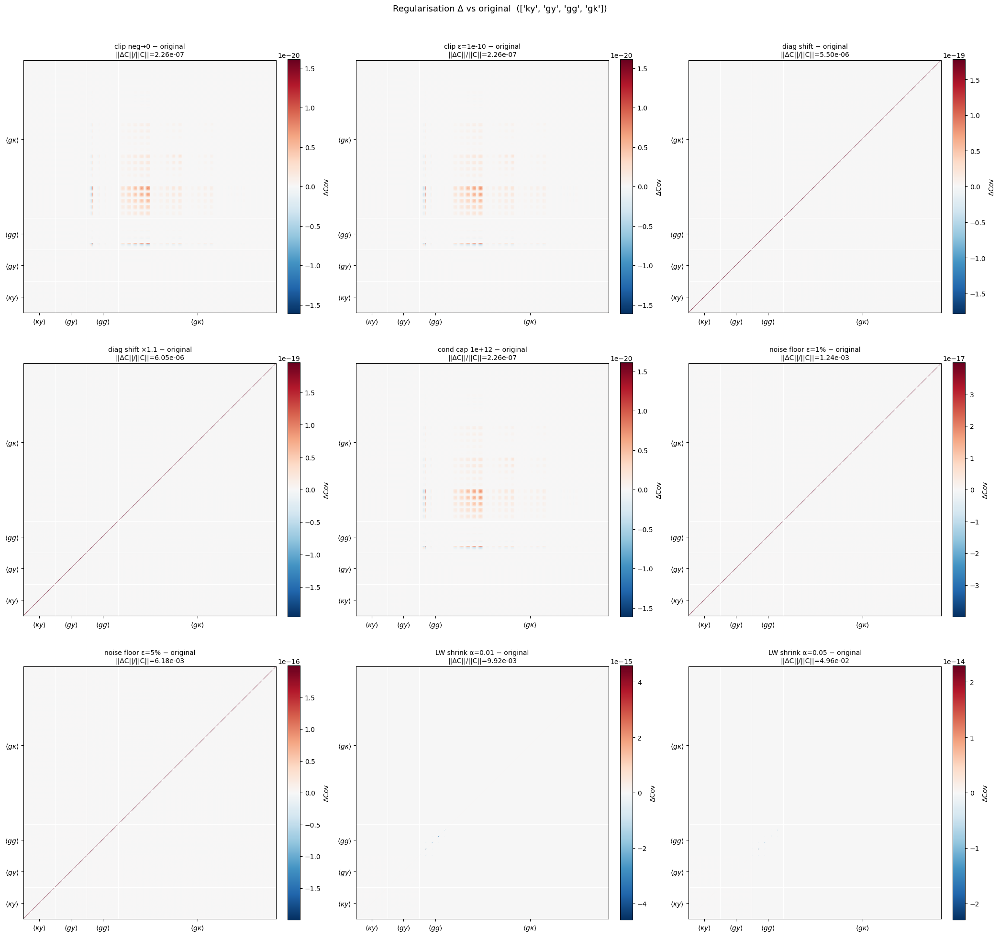

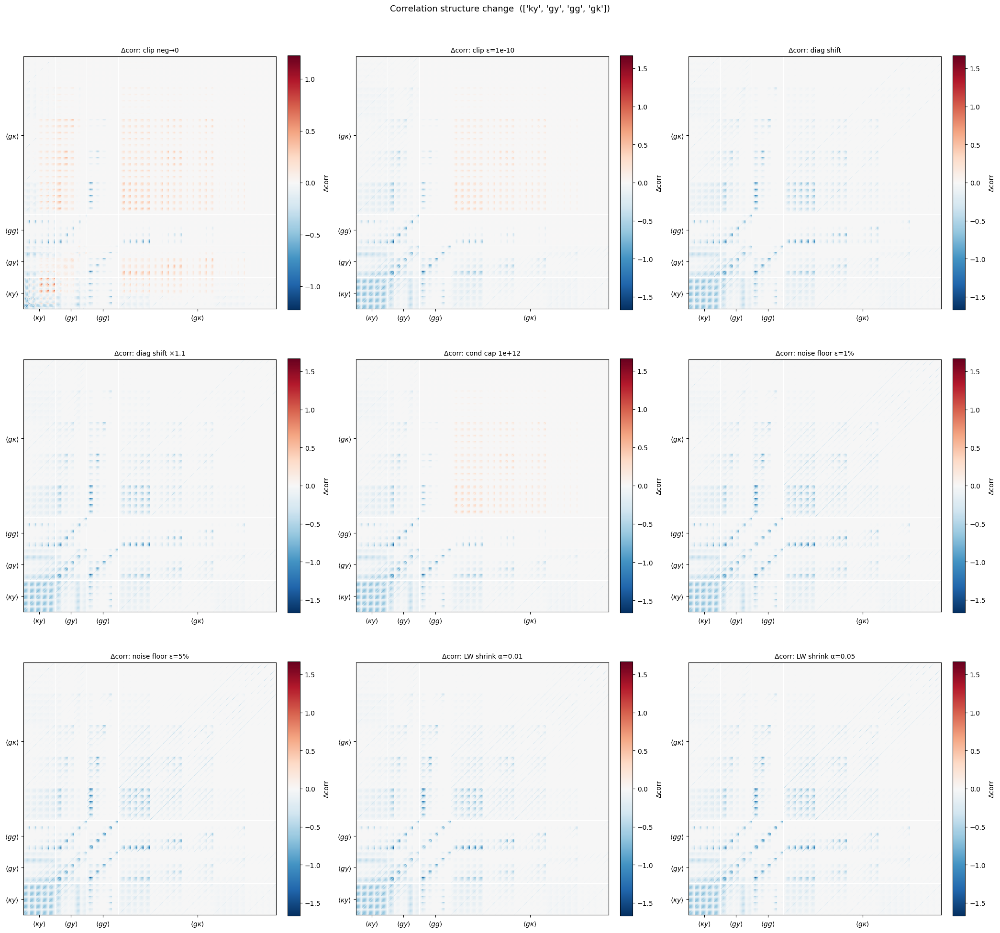


  Inference quality — probes: ['ky', 'gy', 'gg', 'gk']   ndof=600
  χ²(600) reference: median/ndof=0.9989  95th/ndof=1.0968
Strategy                     Δln|C|    inv_res   S/N ratio    χ²_med/n     χ²_95/n    Δcorr/n
-------------------------------------------------------------------------------------------------


/home/vtinnane/micromamba/envs/tSZxEuclid-godmax/lib/python3.11/site-packages/numpy/linalg/_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)


original                       0.00  5.713e+04      1.0000  7568208.7874  9183177.1080        inf
clip neg→0                     0.00  1.821e-02      1.0000  7568208.7874  9183177.1080  4.9465e-02
clip ε=1e-10                 -14.17  1.404e-08      0.0001    994.3936   1165.3164  8.0469e-02
diag shift                  2229.90  1.667e-03      0.0938    262.5157   2236.0132  8.8774e-02
diag shift ×1.1             2221.41  3.741e-12      0.0000      0.9440      1.0394  8.8886e-02
cond cap 1e+12              -737.44  1.404e-06      0.0100  87671.5599  104912.2501  7.9477e-02
noise floor ε=1%            4727.15  1.843e-14      0.0000      0.1059      0.1346  9.4967e-02
noise floor ε=5%            5612.17  3.727e-15      0.0000      0.0683      0.0927  9.6979e-02
LW shrink α=0.01            4726.53  1.825e-14      0.0000      0.1067      0.1356  9.4982e-02
LW shrink α=0.05            5610.09  3.543e-15      0.0000      0.0710      0.0967  9.7025e-02


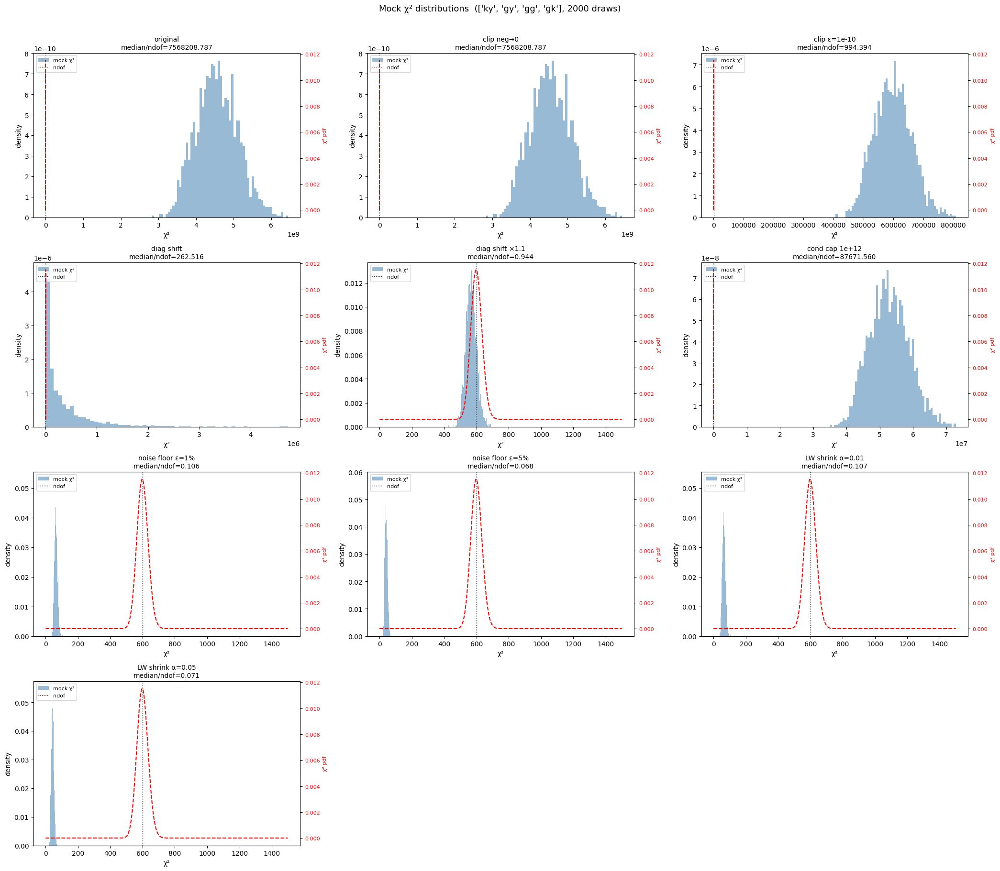

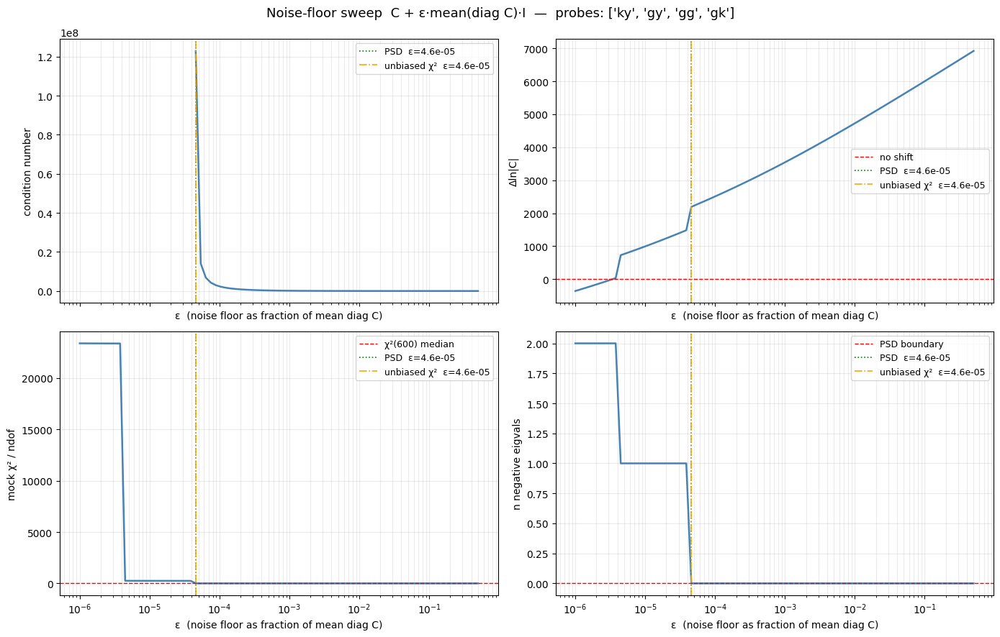


  PSD threshold  : ε = 4.56e-05  →  λ = 1.824e-19
  Unbiased χ²   : ε = 4.56e-05  →  λ = 1.824e-19
  Saved → /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots/cov_reg_sweep_ky_gy_gg_gk.png


In [42]:
import copy
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2 as chi2dist


# ══════════════════════════════════════════════════════════════════════════════
#  compare_regularizations
# ══════════════════════════════════════════════════════════════════════════════

def compare_regularizations(probes_arr, cov_obj=None, figdir=FIGDIR):
    """
    Build the total covariance for probes_arr, apply ten regularisation
    strategies, print a stats table, and produce three figures:
    Fig 1 — log|Cov| for each strategy + eigenvalue spectrum
    Fig 2 — linear diff vs original for each non-original strategy
    Fig 3 — correlation-structure diff vs original
    """
    if cov_obj is None:
        cov_obj = cov_test
    tag = '_'.join(probes_arr)

    # ── Build raw covariance ───────────────────────────────────────────────────
    cov_raw, entries, count_per_probe, nell = diag_utils.build_cov_matrix(
        cov_obj.covtot_dict, cov_obj.Cl_result_dict,
        probes_arr, warn_missing=False,
    )
    eigvals_raw, eigvecs = np.linalg.eigh(cov_raw)
    lam_max       = eigvals_raw.max()
    lam_min       = eigvals_raw.min()
    n_neg         = int((eigvals_raw < 0).sum())
    frob_C        = np.linalg.norm(cov_raw, 'fro')
    ndof          = cov_raw.shape[0]
    sigma2_mean   = np.mean(np.diag(cov_raw))   # scale for noise-floor strategies
    mu_lw         = np.trace(cov_raw) / ndof     # Ledoit-Wolf target eigenvalue

    print(f"\n{'='*68}")
    print(f"  probes : {probes_arr}")
    print(f"  shape  : {cov_raw.shape}   nell={nell}")
    print(f"  λ_min={lam_min:.3e}  λ_max={lam_max:.3e}  n_neg={n_neg}")
    print(f"  mean diag = {sigma2_mean:.3e}   LW target μ = {mu_lw:.3e}")
    print(f"{'='*68}")

    eps_floor = 1e-10
    kappa_cap = 1e12

    # ── Define strategies ──────────────────────────────────────────────────────
    strategies = {
        'original'              : eigvals_raw.copy(),
        'clip neg→0'            : np.maximum(eigvals_raw, 0.0),
        f'clip ε={eps_floor:.0e}': np.maximum(eigvals_raw, eps_floor * lam_max),
        'diag shift'            : eigvals_raw + np.abs(lam_min),
        'diag shift ×1.1'       : eigvals_raw + 1.1 * np.abs(lam_min),
        f'cond cap {kappa_cap:.0e}': np.maximum(eigvals_raw, lam_max / kappa_cap),
        # physically motivated: fractional noise floor
        'noise floor ε=1%'      : eigvals_raw + 0.01 * sigma2_mean,
        'noise floor ε=5%'      : eigvals_raw + 0.05 * sigma2_mean,
        # Ledoit-Wolf shrinkage toward (Tr/n)·I
        'LW shrink α=0.01'      : (1.0 - 0.01) * eigvals_raw + 0.01 * mu_lw,
        'LW shrink α=0.05'      : (1.0 - 0.05) * eigvals_raw + 0.05 * mu_lw,
    }

    reg_mats = {name: eigvecs @ np.diag(lams) @ eigvecs.T
                for name, lams in strategies.items()}

    # ── Stats table ────────────────────────────────────────────────────────────
    print(f"\n{'Strategy':<24}  {'λ_min':>12}  {'λ_max':>12}  {'cond':>12}"
        f"  {'n_neg':>6}  {'||ΔC||/||C||':>14}")
    print('-' * 92)
    for name, lams in strategies.items():
        lmin_r   = lams.min()
        lmax_r   = lams.max()
        n_neg_r  = int((lams < 0).sum())
        cond_r   = lmax_r / max(abs(lmin_r), 1e-300) if lmin_r > 0 else np.inf
        frob_rel = np.linalg.norm(reg_mats[name] - cov_raw, 'fro') / frob_C
        cond_str = f"{cond_r:.2e}" if np.isfinite(cond_r) else "           ∞"
        print(f"{name:<24}  {lmin_r:>12.3e}  {lmax_r:>12.3e}  {cond_str:>12}"
            f"  {n_neg_r:>6}  {frob_rel:>14.3e}")

    # ── Shared plot helpers ────────────────────────────────────────────────────
    bounds      = diag_utils.get_probe_boundaries(count_per_probe, nell)
    tick_labels = [diag_utils.PROBE_LATEX.get(p, p) for p in probes_arr]

    def _decorate(ax, mat, cmap, vmin, vmax, title, cblabel):
        im = ax.imshow(mat, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
        for edge in bounds['edges'][1:-1]:
            ax.axhline(edge - 0.5, color='white', lw=0.8)
            ax.axvline(edge - 0.5, color='white', lw=0.8)
        ax.set_xticks(bounds['centers'])
        ax.set_xticklabels(tick_labels, fontsize=10)
        ax.set_yticks(bounds['centers'])
        ax.set_yticklabels(tick_labels, fontsize=10)
        ax.set_xlim(-0.5, mat.shape[1] - 0.5)
        ax.set_ylim(-0.5, mat.shape[0] - 0.5)
        plt.colorbar(im, ax=ax, label=cblabel, fraction=0.046, pad=0.04)
        ax.set_title(title, fontsize=10)

    n_strat = len(strategies)
    n_cols  = 3
    n_rows  = int(np.ceil((n_strat + 1) / n_cols))   # +1 for eigenvalue panel

    # ── Figure 1: log|Cov| + eigenvalue spectrum ──────────────────────────────
    fig1, axes1 = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 6.5*n_rows))
    axes1 = np.array(axes1).flatten()

    for ax, (name, cov_reg) in zip(axes1, reg_mats.items()):
        n_neg_r = int((strategies[name] < 0).sum())
        neg_str = f'  ⚠ {n_neg_r} neg' if n_neg_r > 0 else ''
        _decorate(ax,
                np.log(np.abs(cov_reg) + 1e-100),
                'viridis', -100, -20,
                f'{name}{neg_str}',
                r'$\log|\mathrm{Cov}|$')

    ax_eig = axes1[n_strat]
    for name, lams in strategies.items():
        ax_eig.plot(lams, lw=1.4,
                    linestyle='--' if name == 'original' else '-',
                    label=name)
    ax_eig.axhline(0, color='red', lw=1.0, ls=':', label='zero')
    ax_eig.axhline( 0.01 * sigma2_mean, color='orange', lw=1.0, ls='-.',
                    label='1% noise floor')
    ax_eig.axhline( 0.05 * sigma2_mean, color='brown',  lw=1.0, ls='-.',
                    label='5% noise floor')
    linthresh = max(np.abs(lam_min) * 10, sigma2_mean * 1e-8)
    ax_eig.set_yscale('symlog', linthresh=linthresh)
    ax_eig.set_xlabel('Eigenvalue index (sorted)')
    ax_eig.set_ylabel('Eigenvalue (symlog)')
    ax_eig.set_title('Eigenvalue spectra', fontsize=10)
    ax_eig.legend(fontsize=7, ncol=2)

    for ax in axes1[n_strat + 1:]:
        ax.set_visible(False)

    fig1.suptitle(f"Regularisation — log|Cov|  ({probes_arr})",
                fontsize=13, y=1.01)
    fig1.tight_layout()
    fig1.savefig(figdir / f"cov_reg_logcov_{'_'.join(probes_arr)}.png",
                dpi=200, bbox_inches='tight')
    plt.show()                          

    # ── Figure 2: linear diff vs original ─────────────────────────────────────                                                        
    non_orig  = [(n, m) for n, m in reg_mats.items() if n != 'original']
    n_diff    = len(non_orig)                                                                                                           
    n_rows2   = int(np.ceil(n_diff / n_cols))                                                                                         
    fig2, axes2 = plt.subplots(n_rows2, n_cols, figsize=(7*n_cols, 6.5*n_rows2))
    axes2 = np.array(axes2).flatten()                                                                                                   
                                                                                                                                        
    for ax, (name, cov_reg) in zip(axes2, non_orig):                                                                                    
        diff     = cov_reg - cov_raw                                                                                                    
        lim      = np.abs(diff).max()                                                                                                 
        frob_rel = np.linalg.norm(diff, 'fro') / frob_C                                                                                 
        _decorate(ax, diff, 'RdBu_r', -lim, lim,                                                                                      
                f'{name} − original\n||ΔC||/||C||={frob_rel:.2e}',                                                                    
                r'$\Delta\mathrm{Cov}$')                                                                                            
                                                                                                                                        
    for ax in axes2[n_diff:]:                                                                                                           
        ax.set_visible(False)                                                                                                           
                                                                                                                                        
    fig2.suptitle(f"Regularisation Δ vs original  ({probes_arr})",                                                                      
                fontsize=13, y=1.01)                                                                                                
    fig2.tight_layout()
    fig2.savefig(figdir / f"cov_reg_diff_{'_'.join(probes_arr)}.png",                                                                   
                dpi=200, bbox_inches='tight')
    plt.show()                                                                                                                          
                                                                                                                                        
    # ── Figure 3: correlation structure diff ──────────────────────────────────
    def _to_corr(C):                                                                                                                    
        d = np.sqrt(np.maximum(np.diag(C), 1e-300))                                                                                     
        return C / np.outer(d, d)           
                                                                                                                                        
    corr_raw  = _to_corr(cov_raw)                                                                                                       
    fig3, axes3 = plt.subplots(n_rows2, n_cols, figsize=(7*n_cols, 6.5*n_rows2))                                                        
    axes3 = np.array(axes3).flatten()                                                                                                   
                                                                                                                                        
    for ax, (name, cov_reg) in zip(axes3, non_orig):                                                                                  
        try:                                                                                                                            
            dcorr = _to_corr(cov_reg) - corr_raw
            lim   = np.abs(dcorr).max()                                                                                                 
            _decorate(ax, dcorr, 'RdBu_r', -lim, lim,                                                                                 
                    f'Δcorr: {name}', 'Δcorr')                                                                                        
        except Exception:                                                                                                             
            ax.set_title(f'{name}\n(singular)', fontsize=10)                                                                            
                                            
    for ax in axes3[n_diff:]:                                                                                                           
        ax.set_visible(False)                                                                                                         
                                                                                                                                        
    fig3.suptitle(f"Correlation structure change  ({probes_arr})",                                                                      
                fontsize=13, y=1.01)                                                                                                  
    fig3.tight_layout()                                                                                                                 
    fig3.savefig(figdir / f"cov_reg_corr_{'_'.join(probes_arr)}.png",                                                                 
                dpi=200, bbox_inches='tight')
    plt.show()
                                                                                                                                        
    return reg_mats, strategies, cov_raw    
                                                                                                                                        
                                                                                                                                    
# ══════════════════════════════════════════════════════════════════════════════                                                        
#  assess_cov_quality
# ══════════════════════════════════════════════════════════════════════════════                                                        
                                                                                                                                    
def assess_cov_quality(reg_mats, strategies, cov_raw, probes_arr,
                        cov_obj=None, n_mock=2000, figdir=FIGDIR):
    """                                                                                                                                 
    Five inference-quality metrics for each regularised covariance:
    1. log-determinant shift   — likelihood normalisation error                                                                       
    2. inverse residual        — ||C C⁻¹ − I||_F / n                                                                                  
    3. data S/N ratio          — d^T C_reg^{-1} d  /  d^T C_raw^{-1} d
    4. mock chi2 median/ndof   — should equal 1.0 if C_reg ≈ C_true                                                                   
    5. correlation Frobenius   — ||corr(C_reg) − corr(C_raw)||_F / n                                                                  
    """                                                                                                                                 
    if cov_obj is None:                                                                                                                 
        cov_obj = cov_test                                                                                                              
                                                                                                                                        
    ndof = cov_raw.shape[0]                                                                                                             
                                                                                                                                        
    # ── Reference quantities ───────────────────────────────────────────────────                                                       
    eigvals_raw, eigvecs_raw = np.linalg.eigh(cov_raw)
    pos_raw = eigvals_raw[eigvals_raw > 0]                                                                                              
    ld_raw  = np.sum(np.log(pos_raw))                                                                                                 
                                            
    # Safe Cholesky for mock generation (shift just enough if needed)                                                                   
    shift_raw = max(-eigvals_raw.min() * 1.01, 0.0)
    L_raw     = np.linalg.cholesky(cov_raw + np.eye(ndof) * shift_raw)                                                                  
    rng       = np.random.default_rng(42)                                                                                               
    mocks     = (L_raw @ rng.standard_normal((ndof, n_mock))).T  # (n_mock, ndof)                                                       
                                                                                                                                        
    # Safe inverse of raw covariance for S/N reference                                                                                  
    Cinv_raw = eigvecs_raw @ np.diag(                                                                                                   
        1.0 / np.maximum(eigvals_raw, eigvals_raw.max() * 1e-14)                                                                        
    ) @ eigvecs_raw.T                                                                                                                   
                                                                                                                                        
    dv, _, _ = diag_utils.build_data_vector(                                                                                            
        cov_obj.Cl_result_dict, probes_arr, key='tot_ellsurvey'                                                                         
    )                                                                                                                                   
    sn_ref = float(dv @ Cinv_raw @ dv) if len(dv) == ndof else None                                                                     
                                                                                                                                    
    def _to_corr(C):                                                                                                                    
        d = np.sqrt(np.maximum(np.diag(C), 1e-300))                                                                                   
        return C / np.outer(d, d)                                                                                                       
    corr_raw = _to_corr(cov_raw)                                                                                                      
                                                                                                                                        
    chi2_ref_med  = chi2dist.median(ndof) / ndof                                                                                        
    chi2_ref_95   = chi2dist.ppf(0.95, ndof) / ndof
                                                                                                                                        
    # ── Summary table ──────────────────────────────────────────────────────────                                                       
    print(f"\n{'='*68}")                
    print(f"  Inference quality — probes: {probes_arr}   ndof={ndof}")                                                                  
    print(f"  χ²({ndof}) reference: median/ndof={chi2_ref_med:.4f}  "                                                                   
        f"95th/ndof={chi2_ref_95:.4f}")   
    print(f"{'='*68}")                                                                                                                  
    print(f"{'Strategy':<24}  {'Δln|C|':>9}  {'inv_res':>9}  "                                                                          
        f"{'S/N ratio':>10}  {'χ²_med/n':>10}  {'χ²_95/n':>10}  "                                                                     
        f"{'Δcorr/n':>9}")                                                                                                            
    print('-' * 97)                                                                                                                     
                                                                                                                                        
    chi2_all = {}                                                                                                                       
    for name, cov_reg in reg_mats.items():                                                                                              
        lams = strategies[name]                                                                                                         
                                                                                                                                        
        # 1. log-det shift              
        pos_r = lams[lams > 0]                                                                                                          
        dld   = np.sum(np.log(pos_r)) - ld_raw if len(pos_r) else np.nan                                                                
                                            
        # 2. inverse residual                                                                                                           
        try:                                                                                                                            
            Cinv_reg = eigvecs_raw @ np.diag(                                                                                           
                1.0 / np.maximum(lams, lams.max() * 1e-14)                                                                              
            ) @ eigvecs_raw.T                                                                                                           
            inv_res  = np.linalg.norm(cov_reg @ Cinv_reg - np.eye(ndof), 'fro') / ndof                                                
        except Exception:                   
            Cinv_reg = None                                                                                                             
            inv_res  = np.nan
                                                                                                                                        
        # 3. S/N ratio                                                                                                                
        if Cinv_reg is not None and sn_ref is not None and sn_ref > 0:                                                                  
            sn_ratio = float(dv @ Cinv_reg @ dv) / sn_ref                                                                             
        else:                                                                                                                           
            sn_ratio = np.nan           
                                                                                                                                        
        # 4. mock chi2                                                                                                                  
        if Cinv_reg is not None:
            chi2s         = np.einsum('mi,ij,mj->m', mocks, Cinv_reg, mocks)                                                            
            chi2_all[name] = chi2s                                                                                                    
            chi2_med       = np.median(chi2s) / ndof
            chi2_95        = np.percentile(chi2s, 95) / ndof                                                                            
        else:                                                                                                                           
            chi2_all[name] = np.full(n_mock, np.nan)                                                                                    
            chi2_med = chi2_95 = np.nan                                                                                                 
                                                                                                                                    
        # 5. correlation structure                                                                                                      
        try:                                                                                                                            
            dcorr = np.linalg.norm(_to_corr(cov_reg) - corr_raw, 'fro') / ndof
        except Exception:                                                                                                               
            dcorr = np.nan                                                                                                            
                                                                                                                                        
        print(f"{name:<24}  {dld:>9.2f}  {inv_res:>9.3e}  "                                                                             
            f"{sn_ratio:>10.4f}  {chi2_med:>10.4f}  {chi2_95:>10.4f}  "
            f"{dcorr:>9.4e}")                                                                                                         
                                                                                                                                        
    # ── Figure: mock chi2 distributions ───────────────────────────────────────
    n_strat = len(reg_mats)                                                                                                             
    n_cols  = 3                                                                                                                         
    n_rows  = int(np.ceil(n_strat / n_cols))                                                                                            
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 4.5*n_rows))                                                            
    axes = np.array(axes).flatten()                                                                                                     
                                                                                                                                    
    x_ref   = np.linspace(0, 2.5 * ndof, 600)                                                                                           
    pdf_ref = chi2dist.pdf(x_ref, df=ndof)
                                                                                                                                        
    for ax, (name, chi2s) in zip(axes, chi2_all.items()):                                                                               
        if np.all(np.isnan(chi2s)):
            ax.text(0.5, 0.5, 'not invertible', ha='center', va='center',                                                               
                    transform=ax.transAxes, fontsize=11)                                                                              
            ax.set_title(name, fontsize=10)                                                                                             
            continue                                                                                                                    
        ax.hist(chi2s, bins=60, density=True, alpha=0.55, color='steelblue',
                label='mock χ²')                                                                                                        
        ax_r = ax.twinx()                                                                                                             
        ax_r.plot(x_ref, pdf_ref, 'r--', lw=1.5, label=f'χ²({ndof})')                                                                   
        ax_r.set_ylabel('χ² pdf', color='red', fontsize=8)                                                                            
        ax_r.tick_params(axis='y', labelcolor='red', labelsize=8)                                                                       
        ax.axvline(ndof, color='k', lw=1.0, ls=':', label='ndof')                                                                       
        ax.set_xlabel('χ²')                                                                                                             
        ax.set_ylabel('density')                                                                                                        
        med = np.nanmedian(chi2s)                                                                                                       
        ax.set_title(f'{name}\nmedian/ndof={med/ndof:.3f}', fontsize=10)                                                                
        ax.legend(fontsize=8, loc='upper left')                                                                                         
                                                                                                                                        
    for ax in axes[n_strat:]:                                                                                                         
        ax.set_visible(False)                                                                                                           
                                                                                                                                    
    fig.suptitle(f"Mock χ² distributions  ({probes_arr}, {n_mock} draws)",                                                              
                fontsize=13, y=1.01)                                                                                                 
    fig.tight_layout()                                                                                                                  
    fig.savefig(figdir / f"cov_quality_chi2_{'_'.join(probes_arr)}.png",                                                                
                dpi=200, bbox_inches='tight')
    plt.show()                                                                                                                          
                                                                                                                                    
                                                                                                                                        
# ══════════════════════════════════════════════════════════════════════════════
#  plot_regularisation_sweep                                                                                                            
# ══════════════════════════════════════════════════════════════════════════════                                                        

def plot_regularisation_sweep(cov_raw, probes_arr, n_mock=1000, figdir=FIGDIR):                                                         
    """                                                                                                                               
    Sweep λ = ε · mean(diag C) continuously from 1e-6 to 0.5.
    Four panels: condition number, Δln|C|, mock χ²/ndof, n_neg eigenvalues.                                                             
    Use to read off the smallest physically meaningful ε.
    """                                                                                                                                 
    ndof        = cov_raw.shape[0]                                                                                                      
    eigvals, eigvecs = np.linalg.eigh(cov_raw)                                                                                          
    sigma2_mean = np.mean(np.diag(cov_raw))                                                                                             
                                                                                                                                        
    pos_raw = eigvals[eigvals > 0]                                                                                                      
    ld_raw  = np.sum(np.log(pos_raw))                                                                                                   
                                            
    shift_raw = max(-eigvals.min() * 1.01, 0.0)                                                                                         
    L_raw     = np.linalg.cholesky(cov_raw + np.eye(ndof) * shift_raw)                                                                
    rng       = np.random.default_rng(42)                                                                                               
    mocks     = (L_raw @ rng.standard_normal((ndof, n_mock))).T
                                                                                                                                        
    eps_arr  = np.logspace(-6, np.log10(0.5), 80)                                                                                       
    cond_arr = np.zeros(len(eps_arr))   
    dld_arr  = np.zeros(len(eps_arr))                                                                                                   
    chi2_arr = np.zeros(len(eps_arr))                                                                                                   
    neg_arr  = np.zeros(len(eps_arr), dtype=int)
                                                                                                                                        
    for i, eps in enumerate(eps_arr):                                                                                                 
        lams_r    = eigvals + eps * sigma2_mean                                                                                         
        neg_arr[i] = int((lams_r < 0).sum())                                                                                          
        lmax_r     = lams_r.max()                                                                                                       
        lmin_r     = lams_r.min()                                                                                                     
        cond_arr[i] = lmax_r / max(abs(lmin_r), 1e-300) if lmin_r > 0 else np.inf                                                       
        ld_r        = np.sum(np.log(np.maximum(lams_r, 1e-300)))                                                                        
        dld_arr[i]  = ld_r - ld_raw                                                                                                     
        Cinv_r      = eigvecs @ np.diag(1.0 / np.maximum(lams_r, lmax_r * 1e-14)) @ eigvecs.T                                           
        chi2s       = np.einsum('mi,ij,mj->m', mocks, Cinv_r, mocks)                                                                  
        chi2_arr[i] = np.median(chi2s) / ndof                                                                                           
                                                                                                                                        
    chi2_target = chi2dist.median(ndof) / ndof                                                                                          
                                                                                                                                        
    # threshold ε values                                                                                                                
    eps_psd = eps_arr[neg_arr == 0][0]    if (neg_arr == 0).any()             else np.nan                                             
    cross   = np.where(chi2_arr <= chi2_target * 1.005)[0]                                                                              
    eps_unb = eps_arr[cross[0]]           if len(cross) > 0                   else np.nan                                               
                                            
    fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True)                                                                        
                                                                                                                                        
    panels = [                                                                                                                          
        (axes[0,0], cond_arr,  'condition number',  None,         None),                                                                
        (axes[0,1], dld_arr,   'Δln|C|',            0,            'no shift'),                                                          
        (axes[1,0], chi2_arr,  'mock χ² / ndof',    chi2_target,  f'χ²({ndof}) median'),                                              
        (axes[1,1], neg_arr,   'n negative eigvals', 0,           'PSD boundary'),
    ]                                                                                                                                   
                                                                                                                                        
    for ax, y, ylabel, ref, rlabel in panels:                                                                                           
        ax.semilogx(eps_arr, y, lw=1.8, color='steelblue')                                                                              
        if ref is not None:                                                                                                             
            ax.axhline(ref, color='red', lw=1.0, ls='--', label=rlabel)                                                                 
        if not np.isnan(eps_psd):                                                                                                     
            ax.axvline(eps_psd, color='green', lw=1.2, ls=':',                                                                          
                        label=f'PSD  ε={eps_psd:.1e}')                                                                                 
        if not np.isnan(eps_unb):                                                                                                       
            ax.axvline(eps_unb, color='orange', lw=1.2, ls='-.',                                                                      
                        label=f'unbiased χ²  ε={eps_unb:.1e}')                                                                           
        ax.set_xlabel('ε  (noise floor as fraction of mean diag C)')                                                                  
        ax.set_ylabel(ylabel)                                                                                                           
        ax.legend(fontsize=9)                                                                                                           
        ax.grid(True, which='both', alpha=0.25)                                                                                         
                                                                                                                                        
    fig.suptitle(                                                                                                                       
        f"Noise-floor sweep  C + ε·mean(diag C)·I  —  probes: {probes_arr}",                                                            
        fontsize=13)                                                                                                                    
    fig.tight_layout()                  
    fname = figdir / f"cov_reg_sweep_{'_'.join(probes_arr)}.png"                                                                        
    fig.savefig(fname, dpi=200, bbox_inches='tight')                                                                                    
    plt.show()                          
                                                                                                                                        
    print(f"\n  PSD threshold  : ε = {eps_psd:.2e}  →  λ = {eps_psd*sigma2_mean:.3e}")                                                  
    print(f"  Unbiased χ²   : ε = {eps_unb:.2e}  →  λ = {eps_unb*sigma2_mean:.3e}")
    print(f"  Saved → {fname}")                                                                                                         
                                                                                                                                        

# ══════════════════════════════════════════════════════════════════════════════                                                        
#  Run all                                                                                                                            
# ══════════════════════════════════════════════════════════════════════════════                                                        
                                                                                                                                    
for probes in [['gy', 'gg'], ['ky', 'gy'], ['ky', 'kk'], ['ky', 'gy', 'gg', 'gk']]:
    reg_mats, strats, cov_raw = compare_regularizations(probes)                                                                         
    assess_cov_quality(reg_mats, strats, cov_raw, probes)
    plot_regularisation_sweep(cov_raw, probes)          

| Strategy Name         | Eigenvalue Transformation                          | Mathematical Form                                      | Purpose / Interpretation                          |
|----------------------|---------------------------------------------------|--------------------------------------------------------|---------------------------------------------------|
| clip_neg0            | Clip negative eigenvalues to zero                 | λᵢ → max(λᵢ, 0)                                        | Enforce PSD minimally (can create singular modes) |
| diag_shift           | Shift by minimum eigenvalue                       | λᵢ → λᵢ + |λ_min|                                      | Ensure all eigenvalues ≥ 0                        |
| diag_shift_x11       | Slightly over-shift                              | λᵢ → λᵢ + 1.1·|λ_min| + ε_floor                        | Add safety margin for numerical stability         |
| noise_floor_01p      | Add small isotropic noise floor                  | λᵢ → λᵢ + 0.001·⟨σ²⟩                                  | Regularise small modes (weak prior-like effect)   |
| noise_floor_1p       | Add larger isotropic noise floor                 | λᵢ → λᵢ + 0.01·⟨σ²⟩                                   | Stronger smoothing / stabilisation                |


── 1. Data vector & covariance ──────────────────────────────────────
  n_dv=450  |  λ_min=-7.339e-23  δ_PSD=7.339e-23  σ²_mean=5.326e-15

── 2. Regularisation ────────────────────────────────────────────────
  Clip λ<0 → 0                      cond=1.00e+14  n_neg=0
  Diag shift (×1.0)                 cond=1.00e+14  n_neg=0
  Diag shift (×1.1)                 cond=7.10e+10  n_neg=0
  Noise floor ε=0.1%                cond=9.79e+04  n_neg=0
  Noise floor ε=1%                  cond=9.79e+03  n_neg=0

── 3. Jacobian (central differences) ────────────────────────────────
  ∂T/∂Om0           ε=0.01 …Loaded yy noise from file; Cl_y_y_tot_mat = theory + noise
Loaded yy noise from file; Cl_y_y_tot_mat = theory + noise
 32s  [-5.25e-05, 4.97e-08]
  ∂T/∂sigma8        ε=0.01 …Loaded yy noise from file; Cl_y_y_tot_mat = theory + noise
Loaded yy noise from file; Cl_y_y_tot_mat = theory + noise
 32s  [4.68e-15, 1.17e-05]
  ∂T/∂theta_ej_0    ε=0.1 …Loaded yy noise from file; Cl_y_y_tot_mat = theory

sample: 100%|██████████| 3200/3200 [01:06<00:00, 47.91it/s, 255 steps of size 6.15e-03. acc. prob=0.92]
arviz - WARNING - Shape validation failed: input_shape: (1, 3000), minimum_shape: (chains=2, draws=4)


    66.9s  |  R-hat max = nan

  ── Diag shift (×1.0) ──
    log_p(θ_fid) = -1.4351  (want 0.0)


sample: 100%|██████████| 3200/3200 [00:38<00:00, 82.78it/s, 7 steps of size 4.23e-03. acc. prob=0.30]   
arviz - WARNING - Shape validation failed: input_shape: (1, 3000), minimum_shape: (chains=2, draws=4)


    38.7s  |  R-hat max = nan

  ── Diag shift (×1.1) ──
    log_p(θ_fid) = -1.4351  (want 0.0)


sample: 100%|██████████| 3200/3200 [00:10<00:00, 308.57it/s, 7 steps of size 2.38e-01. acc. prob=0.92] 
arviz - WARNING - Shape validation failed: input_shape: (1, 3000), minimum_shape: (chains=2, draws=4)


    10.5s  |  R-hat max = nan

  ── Noise floor ε=0.1% ──
    log_p(θ_fid) = -1.4351  (want 0.0)


sample: 100%|██████████| 3200/3200 [00:07<00:00, 424.56it/s, 3 steps of size 7.84e-01. acc. prob=0.90]
arviz - WARNING - Shape validation failed: input_shape: (1, 3000), minimum_shape: (chains=2, draws=4)


    7.6s  |  R-hat max = nan

  ── Noise floor ε=1% ──
    log_p(θ_fid) = -1.4351  (want 0.0)


sample: 100%|██████████| 3200/3200 [00:07<00:00, 446.90it/s, 3 steps of size 8.71e-01. acc. prob=0.88] 
arviz - WARNING - Shape validation failed: input_shape: (1, 3000), minimum_shape: (chains=2, draws=4)


    7.3s  |  R-hat max = nan

── 5. Triangle plot ─────────────────────────────────────────────────
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
  saved → /home/vtinnane/Documents/Codes/develop/GODMAX/notebooks/diagnostics/plots/inf_reg_cmp_ky_kk_gy_gg.png


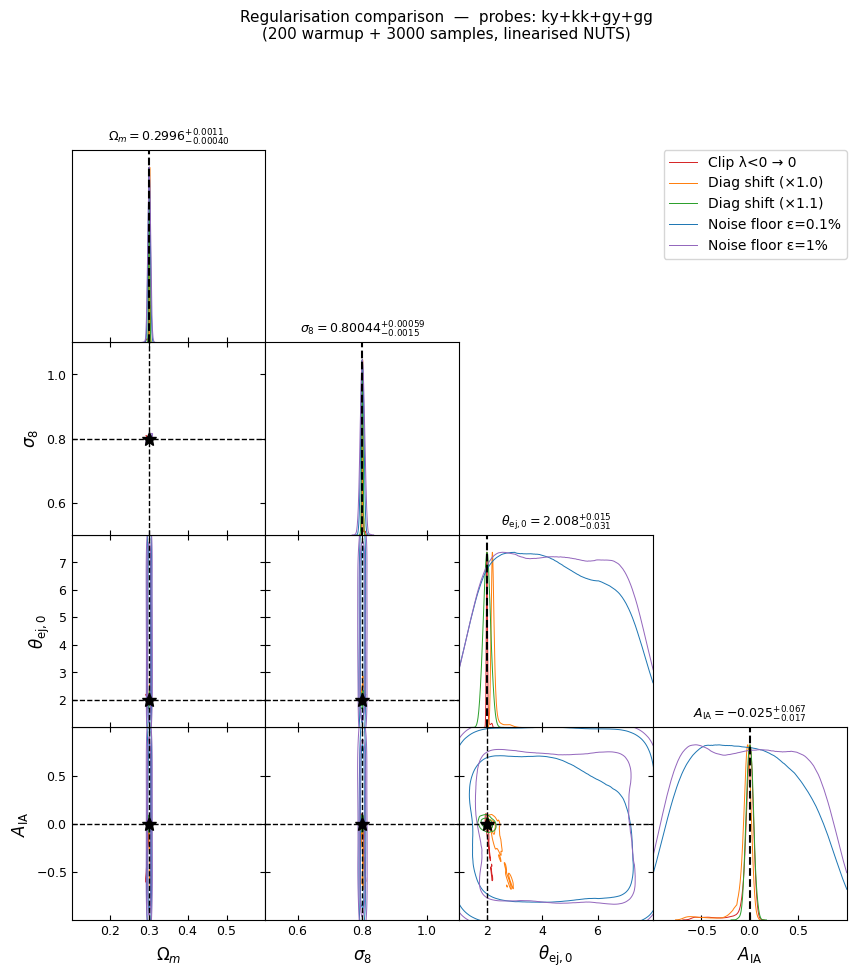

In [50]:
# =====================================================================
#                             PRIORS
# =====================================================================
prior_min = {"Om0": 0.1,  "sigma8": 0.5, "theta_ej_0": 1.0, "A_IA": -1.0}
prior_max = {"Om0": 0.6,  "sigma8": 1.1, "theta_ej_0": 8.0, "A_IA":  1.0}

cosmo_params_vary_names = ["Om0", "sigma8"]
phys_params_vary_names  = ["theta_ej_0"]
other_params_vary_names = ["A_IA"]

param_names = cosmo_params_vary_names + phys_params_vary_names + other_params_vary_names

# ── Fiducial values (read from loaded param dicts) ────────────────────────────
theta_fid_dict = {
    "Om0"       : sim_params_dict['cosmo']['Om0'],      # 0.31
    "sigma8"    : sim_params_dict['cosmo']['sigma8'],   # 0.81
    "theta_ej_0": sim_params_dict['theta_ej_0'],        # 2.0
    "A_IA"      : other_params_dict['A_IA'],            # 0.1
}
theta_fid_vec = jnp.array([theta_fid_dict[p] for p in param_names])

latex_labels = {
    "Om0": r"\Omega_m",
    "sigma8": r"\sigma_8",
    "theta_ej_0": r"\theta_{\rm ej,0}",
    "A_IA": r"A_{\rm IA}",
}
# ─────────────────────────────────────────────────────────────────────────────
# INFERENCE COMPARISON                                                                                                                  
# Linearised NUTS under 5 covariance regularisation strategies.                                                                         
# Jacobian is computed once and reused across all strategies.                                                                           
#                                                                                                                                       
# Globals required:                                                                                                                   
#   sim_params_dict, halo_params_dict, analysis_dict, other_params_dict                                                                 
#   prior_min, prior_max, param_names, theta_fid_dict, latex_labels                                                                   
#                                                                                                                                       
# Returns:                                                                                                                              
#   results : dict  {reg_name → {samples, mcmc, cov_reg, cov_inv, label, color}}                                                        
#   jac     : ndarray (n_dv, n_params)   — pass back in as jac_in to skip recompute                                                     
#   entries : list                        — data-vector entry list                                                                      
# ─────────────────────────────────────────────────────────────────────────────                                                         
import arviz as az                                                                                                                                   
def run_inference_comparison(                                                                                                           
    probes_arr,                                                                                                                         
    cov_obj       = None,                                                                                                               
    jac_in        = None,    # pre-computed Jacobian; computed if None                                                                  
    entries_in    = None,    # required when jac_in is provided
    n_warmup      = 200,                                                                                                                
    n_samples     = 3000,                   
    rng_seed      = 42,                                                                                                                 
    bin_selection = None,
    jac_eps       = None,    # step sizes per param; defaults provided                                                                  
    figdir        = FIGDIR,                 
):                                                                                                                                      
    import copy, os, time
    import numpy as np                                                                                                                  
    import jax                          
    import jax.numpy as jnp                                                                                                             
    import numpyro                                                                                                                      
    import numpyro.distributions as dist    
    from numpyro.infer import NUTS, MCMC                                                                                                
    from getdist import MCSamples
    from getdist import plots as gd_plots                                                                                               
    import matplotlib.pyplot as pl      
    from godmax.utils import build_data_vector, build_cov_matrix                                                                        
    from godmax.get_Cls import get_Cl                                                                                                   
                                        
    _eps = jac_eps or {                                                                                                                 
        "Om0": 0.01, "sigma8": 0.01, "theta_ej_0": 0.1, "A_IA": 0.05,                                                                   
    }                                                                                                                                   
                                                                                                                                        
    # ── 0. Build / reuse cov_obj ──────────────────────────────────────────────
    # ── 0. Build / reuse cov_obj ──────────────────────────────────────────────
    if cov_obj is None:                                                                                                                 
        from godmax.get_covs import get_cov as _get_cov
        print("Building get_cov from global param dicts …")                                                                             
        t0 = time.time()                
        cov_obj = _get_cov(sim_params_dict, halo_params_dict,
                            analysis_dict, other_params_dict)                                                                            
        print(f"  done in {time.time()-t0:.1f}s")
                                                                                                                                        
    if not hasattr(cov_obj, 'Cl_result_dict'):
        raise TypeError(                                                                                                                
            f"cov_obj must be a get_cov instance (has Cl_result_dict / covtot_dict), "
            f"got {type(cov_obj).__name__}. "                                                                                           
            f"Pass your get_cov object, e.g. cov_obj=cov_test"
        )                                                                                      
                                            
    Cl_result_dict = cov_obj.Cl_result_dict                                                                                             
    covtot_dict    = cov_obj.covtot_dict
                                                                                                                                        
    # ── 1. Data vector & raw covariance ───────────────────────────────────────
    print("\n── 1. Data vector & covariance ──────────────────────────────────────")                                                    
    data_vec, entries, nell = build_data_vector(                                                                                        
        Cl_result_dict, probes_arr,                                                                                                     
        key='tot_ellsurvey', bin_selection=bin_selection,                                                                               
    )                                                                                                                                   
    cov_raw, _, count_per_probe, _ = build_cov_matrix(                                                                                  
        covtot_dict, Cl_result_dict, probes_arr,                                                                                        
        bin_selection=bin_selection, symmetrize=True,                                                               
    )                                       
    n_dv    = len(data_vec)                                                                                                             
    data_np = np.array(data_vec)            
    T_fid   = data_np.copy()   # fiducial prediction = data → log_p(θ_fid) = 0 exactly                                                  
                                            
    lams, vecs  = np.linalg.eigh(cov_raw)                                                                                               
    lam_max     = lams.max()            
    sigma2_mean = np.diag(cov_raw).mean()                                                                                               
    lam_min     = lams.min()                                                                                                            
    delta_psd   = max(-lam_min, 0.0)                                                                                                    
    _floor      = lam_max * 1e-14      # absolute numerical floor                                                                       
                                                                                                                                        
    print(f"  n_dv={n_dv}  |  λ_min={lam_min:.3e}  δ_PSD={delta_psd:.3e}"                                                               
        f"  σ²_mean={sigma2_mean:.3e}")                                                                                               
                                                                                                                                        
    # ── 2. Regularisation strategies ──────────────────────────────────────────                                                        
    print("\n── 2. Regularisation ────────────────────────────────────────────────")                                                    
                                                                                                                                        
    # (eigenvalue array, human label, plot colour)
    reg_specs = {                       
        "clip_neg0"      : (lams.clip(min=0.0),                                                                                         
                            "Clip λ<0 → 0",       "tab:red"),                                                                           
        "diag_shift"     : (lams + delta_psd,                                                                                           
                            "Diag shift (×1.0)",  "tab:orange"),                                                                        
        "diag_shift_x11" : (lams + delta_psd * 1.1 + _floor,                                                                            
                            "Diag shift (×1.1)",  "tab:green"),                                                                         
        "noise_floor_01p": (lams + 1e-3 * sigma2_mean,                                                                                  
                            "Noise floor ε=0.1%", "tab:blue"),                                                                          
        "noise_floor_1p" : (lams + 1e-2 * sigma2_mean,                                                                                  
                            "Noise floor ε=1%",   "tab:purple"),                                                                        
    }                                                                                                                                   
                                                                                                                                        
    reg_mats, reg_invs = {}, {}                                                                                                         
    for name, (lams_reg, label, _col) in reg_specs.items():                                                                             
        lams_f = np.maximum(lams_reg, _floor)
        reg_mats[name] = (vecs * lams_f) @ vecs.T                                                                                       
        reg_invs[name] = (vecs * (1.0 / lams_f)) @ vecs.T
        cond = lams_f.max() / lams_f.min()                                                                                              
        n_neg = np.sum(np.linalg.eigvalsh(reg_mats[name]) < -_floor)                                                                    
        print(f"  {label:<32s}  cond={cond:.2e}  n_neg={n_neg}")                                                                        
                                                                                                                                        
    # ── 3. Jacobian ───────────────────────────────────────────────────────────                                                        
    if jac_in is not None:                                                                                                              
        print("\n── 3. Jacobian (provided) ───────────────────────────────────────────")                                                
        jac = np.asarray(jac_in)                                                                                                        
        if entries_in is not None:                                                                                                      
            entries = entries_in                                                                                                        
    else:                                                                                                                               
        print("\n── 3. Jacobian (central differences) ────────────────────────────────")
                                                                                                                                        
        def _extract(cl_obj):               
            out = np.zeros(n_dv)                                                                                                        
            for i, (prb, (b1, b2)) in enumerate(entries):                                                                               
                sl = slice(i * nell, (i + 1) * nell)                                                                                    
                if prb == 'yy':                                                                                                         
                    out[sl] = np.array(cl_obj.Cl_y_y_tot_mat)                                                                           
                elif prb == 'ky':           
                    out[sl] = np.array(cl_obj.Cl_kappa_y_tot_mat[:, b1 - 1])                                                            
                elif prb == 'kk':                                                                                                       
                    out[sl] = np.array(cl_obj.Cl_kappa_kappa_tot_mat[:, b1 - 1, b2 - 1])                                                
                elif prb == 'gg':                                                                                                       
                    out[sl] = np.array(cl_obj.Cl_gal_gal_tot_mat[:, b1 - 1, b2 - 1])                                                    
                elif prb == 'gk':           
                    out[sl] = np.array(cl_obj.Cl_gal_kappa_tot_mat[:, b1 - 1, b2 - 1])                                                  
                elif prb == 'gy':                                                                                                       
                    out[sl] = np.array(cl_obj.Cl_gal_y_tot_mat[:, b1 - 1])                                                              
            return out                                                                                                                  
                                                                                                                                        
        def _theory(Om0, sigma8, theta_ej_0, A_IA):                                                                                     
            sp = copy.deepcopy(sim_params_dict)
            op = copy.deepcopy(other_params_dict)                                                                                       
            sp['cosmo']['Om0']    = float(Om0)
            sp['cosmo']['sigma8'] = float(sigma8)                                                                                       
            sp['theta_ej_0']      = float(theta_ej_0)                                                                                   
            op['A_IA']            = float(A_IA)
            return _extract(get_Cl(sp, halo_params_dict, analysis_dict, op))                                                            
                                            
        cols = []                                                                                                                       
        for p in param_names:                                                                                                           
            kw = dict(theta_fid_dict)                                                                                                   
            print(f"  ∂T/∂{p:<14s}ε={_eps[p]} …", end='', flush=True)                                                                   
            t0 = time.time()                                                                                                            
            kw[p] = theta_fid_dict[p] + _eps[p]; Tp = _theory(**kw)
            kw[p] = theta_fid_dict[p] - _eps[p]; Tm = _theory(**kw)                                                                     
            col = (Tp - Tm) / (2.0 * _eps[p])                                                                                           
            cols.append(col)                                                                                                            
            print(f" {time.time()-t0:.0f}s  [{col.min():.2e}, {col.max():.2e}]")                                                        
                                                                                                                                        
        jac = np.column_stack(cols)                                                                                                     
        print(f"  shape: {jac.shape}  params: {param_names}")                                                                           
                                                                                                                                        
    # Freeze JAX arrays (shared across all NUTS runs)
    jac_jnp       = jnp.array(jac)                                                                                                      
    T_fid_jnp     = jnp.array(T_fid)                                                                                                    
    data_jnp      = jnp.array(data_np)                                                                                                  
    theta_fid_jnp = jnp.array([float(theta_fid_dict[p]) for p in param_names])                                                          
                                                                                                                                        
    # ── 4. NUTS for each regularisation ───────────────────────────────────────
    print("\n── 4. NUTS sampling ─────────────────────────────────────────────────")                                                    
                                                                                                                                        
    def _make_model(cov_inv_fixed):                                                                                                     
        """Factory: each call produces a fresh closure over its own cov_inv."""                                                         
        def _model():                                                                                                                   
            theta = jnp.stack([                                                                                                         
                numpyro.sample(p, dist.Uniform(prior_min[p], prior_max[p]))
                for p in param_names                                                                                                    
            ])                                                                                                                          
            diff = data_jnp - (T_fid_jnp + jac_jnp @ (theta - theta_fid_jnp))                                                           
            numpyro.factor('loglike', -0.5 * diff @ cov_inv_fixed @ diff)                                                               
        return _model                                                                                                                   
                
    results = {}                                                                                                                        
    for reg_name, (_, label, color) in reg_specs.items():
        print(f"\n  ── {label} ──", flush=True)                                                                                         
        cov_inv_jnp = jnp.array(reg_invs[reg_name])
        model = _make_model(cov_inv_jnp)    
                                                                                                                                        
        # Sanity check: log_p at fiducial should be 0
        try:                                                                                                                            
            lp = numpyro.infer.util.log_density(                                                                                        
                model, (), {}, {p: float(theta_fid_dict[p]) for p in param_names}                                                       
            )[0]                                                                                                                        
            print(f"    log_p(θ_fid) = {float(lp):.4f}  (want 0.0)")                                                                    
        except Exception as e:              
            print(f"    [warn] log_density check: {e}")                                                                                 
                                            
        mcmc = MCMC(                                                                                                                    
            NUTS(model, dense_mass=True, adapt_mass_matrix=True,
                adapt_step_size=True, max_tree_depth=8),                                                                               
            num_warmup=n_warmup, num_samples=n_samples,
            num_chains=1, progress_bar=True,                                                                                            
        )                                                                                                                               
        t0 = time.time()                                                                                                                
        mcmc.run(jax.random.PRNGKey(rng_seed))                                                                                          
        elapsed = time.time() - t0                                                                                                      
                                            
        samps = mcmc.get_samples()                                                                                                      
        idata = az.from_numpyro(mcmc)
        summary = az.summary(idata, var_names=param_names)                                                                              
        print(f"    {elapsed:.1f}s  |  R-hat max = {summary['r_hat'].max():.4f}")
                                                                                                                                        
        results[reg_name] = dict(       
            samples=samps, mcmc=mcmc, idata=idata,                                                                                      
            cov_reg=reg_mats[reg_name], cov_inv=reg_invs[reg_name],                                                                     
            label=label, color=color,                                                                                                   
        )                                                                                                                               
                                                                                                                                        
    # ── 5. Triangle plot ──────────────────────────────────────────────────────                                                        
    print("\n── 5. Triangle plot ─────────────────────────────────────────────────")                                                    
                                                                                                                                        
    gd_list, colors = [], []                                                                                                            
    for reg_name, res in results.items():
        arr = np.column_stack([np.array(res['samples'][p]) for p in param_names])                                                       
        gd_list.append(MCSamples(       
            samples=arr,                    
            names=param_names,                                                                                                          
            labels=[latex_labels[p] for p in param_names],
            label=res['label'],                                                                                                         
            settings={'smooth_scale_2D': 0.4, 'smooth_scale_1D': 0.4},
        ))                                                                                                                              
        colors.append(res['color'])                                                                                                     

    param_limits = {p: (prior_min[p], prior_max[p]) for p in param_names}                                                               
    fiducials    = [float(theta_fid_dict[p]) for p in param_names]
    n_p          = len(param_names)                                                                                                     
                                                                                                                                        
    g = gd_plots.get_subplot_plotter(width_inch=10)
    g.triangle_plot(                                                                                                                    
        gd_list, param_names,
        filled         = False,         # outlines only — cleaner when overlaid                                                         
        contour_colors = colors,            
        title_limit    = 1,                                                                                                             
        param_limits   = param_limits,      
        legend_loc     = 'upper right',                                                                                                 
    )                                                                                                                                   
                                                                                                                                        
    # Fiducial crosshairs                                                                                                               
    for row in range(n_p):                                                                                                              
        for col in range(row + 1):
            ax = g.subplots[row, col]                                                                                                   
            if ax is None:              
                continue                                                                                                                
            if row == col:                                                                                                              
                ax.axvline(fiducials[col], color='k', ls='--', lw=1.5, zorder=5)
            else:                                                                                                                       
                ax.axvline(fiducials[col], color='k', ls='--', lw=1.0, zorder=5)
                ax.axhline(fiducials[row], color='k', ls='--', lw=1.0, zorder=5)                                                        
                ax.plot(fiducials[col], fiducials[row],                                                                                 
                        '*', color='k', ms=10, zorder=6)                                                                                
                                                                                                                                        
    probe_str = '+'.join(probes_arr)                                                                                                    
    g.fig.suptitle(                     
        f'Regularisation comparison  —  probes: {probe_str}\n'                                                                          
        f'({n_warmup} warmup + {n_samples} samples, linearised NUTS)',                                                                  
        fontsize=11, y=1.02,                                                                                                            
    )                                                                                                                                   
                                                                                                                                        
    if figdir is not None:                                                                                                              
        os.makedirs(str(figdir), exist_ok=True)                                                                                         
        fname = os.path.join(str(figdir), f'inf_reg_cmp_{"_".join(probes_arr)}.png')                                                    
        g.fig.savefig(fname, dpi=150, bbox_inches='tight')
        print(f"  saved → {fname}")     
                                                                                                                                        
    pl.show()                                                                                                                           
    return results, jac, entries                                                                                                        
                                                                                                                                        
# Usage:                                      
                                                                                                                                        
# First run — computes Jacobian (slow: 8 × get_Cl calls)
results, jac, entries = run_inference_comparison(                                                                                       
    probes_arr=['ky', 'kk', 'gy', 'gg'],    
    cov_obj=cov_test,          # pass pre-built get_cov object                                                                          
    n_warmup=200,                                                                                                                       
    n_samples=3000,                                                                                                                     
)                                                                                                                                       
                                                                                                                                        
